In [1]:
%load_ext autoreload
%autoreload 2 #auto-reload all the modules

## Loading required packages

In [3]:
import os
import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import datetime
import requests
from bs4 import BeautifulSoup
import time 
from dask import dataframe as dd
from io import BytesIO
from zipfile import ZipFile
from urllib.request import urlopen
import requests
from time import time
import plotly_express as px
from sklearn.metrics import mean_squared_error
from math import sqrt
import pyarrow as pa
import pyarrow.parquet as pq

#tensorflow
import tensorflow as tf
import PIL
import PIL.Image
import pathlib
from tensorflow.keras import datasets, layers, models, losses, utils, Model
from tensorflow.keras.layers import TimeDistributed, LSTM, Dense
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

# pyspark packages
import findspark
#from pyspark.sql import SparkSession

import project_config as config

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [4]:
# version check
print(tf. __version__)
print(np.__version__)

2.10.0
1.21.5


# Merging all monthly files - Paralel processing

In [5]:
def page_href_urls(page_url, base_url):
    
    '''
    This function produces a text file called "zipfiles.txt" 
    which has all the href urls of every zip file in the open data portal of Madrid city
    '''
    zip_files = pd.DataFrame(columns=['href_urls','month_name'])

    page =requests.get(page_url)
    soup = BeautifulSoup(page.content) #Using BeautifulSoup to clean up the page
    soup.prettify()
    
    all_href_zip_links,all_month_names = [],[]
    #Find all the links on the page that end in .zip and write them into the text file
    for anchor in soup.findAll('a', href=True): # find all href urls
        links = anchor['href']
        if links.endswith('.zip'): # only getting the lınks ends with .zip

            url = base_url + links.strip()
            content = requests.get(url)
            zip_file  = ZipFile(BytesIO(content.content)) # unzip the content
            month_name = ''.join(zip_file.namelist()).split('.')[0]
            
            # appending the values
            all_href_zip_links.append(links)
            all_month_names.append(month_name)

    zip_files['href_urls'] = all_href_zip_links
    zip_files['month_name'] = all_month_names
    zip_files.to_csv('Data/zipfiles.csv', index=False)

In [62]:
# (run only once) Producing the csv zipfile:
# page_href_urls(config.page_url, config.base_url)

In [32]:

def raw_data_load_merge_from_opendata_MAD(base_url, start_month, end_month, chunk_size):
  
  output_file = f'Data/last_{number_of_months}_minute_data.parquet'
  data = list()
  
  with open("Data/zipfiles.csv") as file: 

    for i in range(number_of_months): # the last 9 most recent months' files only / 2022 minute data
      line = next(file).strip()
      url = base_url+line
      content = requests.get(url)

      # unzip the content
      zip_file  = ZipFile(BytesIO(content.content))
      print(zip_file.namelist())
      
      count = 0
      start_time = time()
      
      for text_file in zip_file.infolist():
        chunk_container = pd.read_csv(zip_file.open(text_file.filename), delimiter=';', chunksize=chunk_size, header=None, skiprows=[0])

        for chunk in chunk_container:
          chunk.write.mode('append').parquet(output_file)
          # chunk.to_csv(output_file, mode="a", index=False, header=False)
          # counting the rows
          count = count + len(chunk)

      end_time = time()
      time_consumed = end_time-start_time

      print(f'The number of rows of {zip_file.namelist()} (minute freq): {count}')
      print(f'Execussion Time for {zip_file.namelist()}: {time_consumed}')

      data.append([zip_file.namelist(),count, time_consumed])

  results = pd.DataFrame(data,columns=['File Name','Number of Rows(Minutely)', 'Execution Time'])
  return results

['09-2022.csv']


AttributeError: 'DataFrame' object has no attribute 'write'

In [ ]:
zip_file.infolist()

[<ZipInfo filename='05-2022.csv' compress_type=deflate external_attr=0x20 file_size=697915986 compress_size=74728999>]

In [ ]:
text_file

<ZipInfo filename='05-2022.csv' compress_type=deflate external_attr=0x20 file_size=697915986 compress_size=74728999>

# Initializing and Configuring Spark

In [ ]:
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-11-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.3.0-bin-hadoop3"

In [ ]:
memory = '40g'
pyspark_submit_args = ' --driver-memory ' + memory + ' pyspark-shell'

pyspark_submit_args

' --driver-memory 40g pyspark-shell'

In [ ]:
os.environ["PYSPARK_SUBMIT_ARGS"] = pyspark_submit_args

In [ ]:
findspark.init()
findspark.find()

'/content/spark-3.3.0-bin-hadoop3'

In [ ]:
from pyspark.sql import SparkSession
from pyspark import SparkContext, SparkConf
from pyspark.sql.functions import *

conf = SparkConf().set('spark.ui.port', '4050').set("spark.executor.memory", "40g").set("spark.executor.cores","4").set("spark.driver.cores","4") #.setMaster("yarn")
sc = SparkContext(conf=conf)

spark = SparkSession.builder.master("local[*]").appName("test").getOrCreate()
spark

In [ ]:
spark.sparkContext._conf.getAll()  # check the config

[('spark.driver.extraJavaOptions',
  '-XX:+IgnoreUnrecognizedVMOptions --add-opens=java.base/java.lang=ALL-UNNAMED --add-opens=java.base/java.lang.invoke=ALL-UNNAMED --add-opens=java.base/java.lang.reflect=ALL-UNNAMED --add-opens=java.base/java.io=ALL-UNNAMED --add-opens=java.base/java.net=ALL-UNNAMED --add-opens=java.base/java.nio=ALL-UNNAMED --add-opens=java.base/java.util=ALL-UNNAMED --add-opens=java.base/java.util.concurrent=ALL-UNNAMED --add-opens=java.base/java.util.concurrent.atomic=ALL-UNNAMED --add-opens=java.base/sun.nio.ch=ALL-UNNAMED --add-opens=java.base/sun.nio.cs=ALL-UNNAMED --add-opens=java.base/sun.security.action=ALL-UNNAMED --add-opens=java.base/sun.util.calendar=ALL-UNNAMED --add-opens=java.security.jgss/sun.security.krb5=ALL-UNNAMED'),
 ('spark.driver.cores', '4'),
 ('spark.app.startTime', '1664024331956'),
 ('spark.executor.id', 'driver'),
 ('spark.sql.warehouse.dir', 'file:/content/spark-warehouse'),
 ('spark.app.id', 'local-1664024333950'),
 ('spark.driver.memor

# Dask Data Frame Trial

In [ ]:
ddf = dd.read_csv('/content/drive/MyDrive/THESIS/all_files/output.csv', 
                  dtype = {'id': 'str','fecha':'str','tipo_elem':'str','intensidad':'str',
                  'ocupacion':'str','carga':'str','vmed':'str','error':'str','periodo_integracion':'str'}
                  
                  )
# ddf = ddf.astype({'id': 'int','fecha':'str','tipo_elem':'str','intensidad':'int',
#                   'ocupacion':'float64','carga':'int','vmed':'int','error':'str','periodo_integracion':'int'})
#ddf['fecha']= dd.to_datetime(ddf['fecha'])
print(ddf.dtypes)



id                     object
fecha                  object
tipo_elem              object
intensidad             object
ocupacion              object
carga                  object
vmed                   object
error                  object
periodo_integracion    object
dtype: object


In [ ]:
# Checking length of each partition
ddf.map_partitions(len).compute()

0     1429846
1     1434495
2     1445224
3     1443812
4     1439920
       ...   
77    1444221
78    1442876
79    1400737
80    1398000
81    1417559
Length: 82, dtype: int64

In [ ]:
ddf.partitions[1].compute()

,id,fecha,tipo_elem,intensidad,ocupacion,carga,vmed,error,periodo_integracion
0,3962,2022-06-25 07:15:00,URB,109,0,7,0,N,11
1,3962,2022-06-25 07:30:00,URB,105,1,9,0,N,13
2,3962,2022-06-25 07:45:00,URB,88,0,4,0,N,5
3,3962,2022-06-25 08:00:00,URB,97,0,5,0,N,14
4,3962,2022-06-25 08:15:00,URB,95,0,5,0,N,11
...,...,...,...,...,...,...,...,...,...
1434490,4564,2022-06-06 07:15:00,URB,149,3,13,0,N,15
1434491,4564,2022-06-06 07:30:00,URB,179,4,15,0,N,15
1434492,4564,2022-06-06 07:45:00,URB,300,7,25,0,N,14
1434493,4564,2022-06-06 08:00:00,URB,388,14,35,0,N,15


# Data Pre-processing and Feature Engineering with PySpark

In [ ]:
from pandas._libs.tslibs.timestamps import Timestamp
from pyspark.sql.types import *

schema_sensors = StructType([ \
    StructField("id",StringType(),True), \
    StructField("timestamp",TimestampType(),True), \
    StructField("elem_type",StringType(),True), \
    StructField("intensity", IntegerType(), True), \
    StructField("occupacion", DoubleType(), True), \
    StructField("charge", DoubleType(), True), \
    StructField("vmed", DoubleType(), True), \
    StructField("error", StringType(), True), \
    StructField("integration_error", IntegerType(), True) \
  ])

shema_location = StructType([ \
    StructField("loc_elem_type",StringType(),True), \
    StructField("loc_district",IntegerType(),True), \
    StructField("loc_id",StringType(),True), \
    StructField("cod_cent", IntegerType(), True), \
    StructField("name", StringType(), True), \
    StructField("utm_x", DoubleType(), True), \
    StructField("utm_y", DoubleType(), True), \
    StructField("longitude", DoubleType(), True), \
    StructField("latitude", DoubleType(), True) \
  ])


## Reading Data sets and Defining Schemas

In [ ]:
# minute data from January 2022 to June 2022
start_time = time()
df_traffic_minute = spark.read.csv("/content/drive/MyDrive/THESIS/all_files/2022_minute_data.csv", sep=",", schema=schema_sensors, header=False)
end_time = time()

print('Reading Time: %.2f' %(end_time-start_time), 'seconds')
df_traffic_minute.show(10)
df_traffic_minute.printSchema()

# second data
start_time = time()
locationMAD = spark.read.csv('/content/drive/MyDrive/THESIS/pmed_ubicacion_01-2022.csv', schema=shema_location,header= True)
end_time = time()

print('Reading Time: %.2f' %(end_time-start_time), 'seconds')
locationMAD.show(10)
locationMAD.printSchema()

Reading Time: 0.06 seconds
+----+-------------------+---------+---------+----------+------+----+-----+-----------------+
|  id|          timestamp|elem_type|intensity|occupacion|charge|vmed|error|integration_error|
+----+-------------------+---------+---------+----------+------+----+-----+-----------------+
|1001|2022-06-01 00:00:00|      M30|      612|       2.0|   0.0|61.0|    N|                5|
|1001|2022-06-01 00:15:00|      M30|      612|       1.0|   0.0|62.0|    N|                5|
|1001|2022-06-01 00:30:00|      M30|      492|       1.0|   0.0|58.0|    N|                5|
|1001|2022-06-01 00:45:00|      M30|      348|       1.0|   0.0|58.0|    N|                5|
|1001|2022-06-01 01:00:00|      M30|      300|       1.0|   0.0|56.0|    N|                5|
|1001|2022-06-01 01:15:00|      M30|      168|       0.0|   0.0|55.0|    N|                5|
|1001|2022-06-01 01:30:00|      M30|      120|       0.0|   0.0|53.0|    N|                5|
|1001|2022-06-01 01:45:00|      M

In [ ]:
# df_traffic_minute = df_traffic_minute.repartition(100)
print('Traffic Sensors:')
start_time = time()
print('The number of rows in the file: {:,}'.format(df_traffic_minute.count()))
end_time = time()

print('Counting Time: %.2f' %(end_time-start_time), 'seconds')

print("")

print('Location of Sensors:')
start_time = time()
print('The number of rows in the file: {:,}'.format(locationMAD.count()))
end_time = time()

print('Counting Time: %.2f' %(end_time-start_time), 'seconds')

Traffic Sensors:
The number of rows in the file: 69,477,674
Counting Time: 54.48 seconds

Location of Sensors:
The number of rows in the file: 4,576
Counting Time: 0.33 seconds


## Missing Value Analysis for locationMAD

In [ ]:
locationMAD_nan = locationMAD.select([count(when(col(c).isNull(), c)).alias(c) for c in locationMAD.columns])
locationMAD_nan.show()

+-------------+------------+------+--------+----+-----+-----+---------+--------+
|loc_elem_type|loc_district|loc_id|cod_cent|name|utm_x|utm_y|longitude|latitude|
+-------------+------------+------+--------+----+-----+-----+---------+--------+
|            0|           4|     0|     424|  25|  258|  258|      258|     258|
+-------------+------------+------+--------+----+-----+-----+---------+--------+



In [ ]:
loc_elem_type = locationMAD.groupBy("loc_elem_type").agg(countDistinct("loc_id").alias('Number of IDs'))
loc_elem_type = loc_elem_type.toPandas()

loc_elem_type

,loc_elem_type,Number of IDs
0,URB,4152
1,M30,424


In [ ]:
data = list(loc_elem_type["Number of IDs"])
data

[4152, 424]

In [ ]:
# collect_set() is similar to collect_list() with difference being, collect_set() dedupe or eliminates the duplicates and results in unique for each value
df1 = locationMAD.groupBy("loc_elem_type").agg(collect_set("loc_district").alias("District Numbers"),
                                               countDistinct("loc_district").alias('Number of Districts'),
                                               countDistinct("loc_id").alias('Number of IDs'),
                                               collect_set("loc_id").alias("Sensor Numbers"))
df1 = df1.toPandas()
df1

,loc_elem_type,District Numbers,Number of Districts,Number of IDs,Sensor Numbers
0,M30,"[15, 9, 1, 16, 2, 3, 10, 4, 11, 12, 13, 5, 14, 8]",14,424,"[6873, 6700, 1010, 6843, 10174, 6819, 3797, 10..."
1,URB,"[15, 9, 1, 16, 2, 17, 3, 18, 10, 4, 11, 12, 19...",21,4152,"[5080, 4042, 4715, 9927, 5434, 5142, 10623, 60..."


In [ ]:
district_num = []
for l in list(df1['District Numbers']):
  l.sort()
  district_num.append(l)
district_num

[[1, 2, 3, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15, 16],
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]]

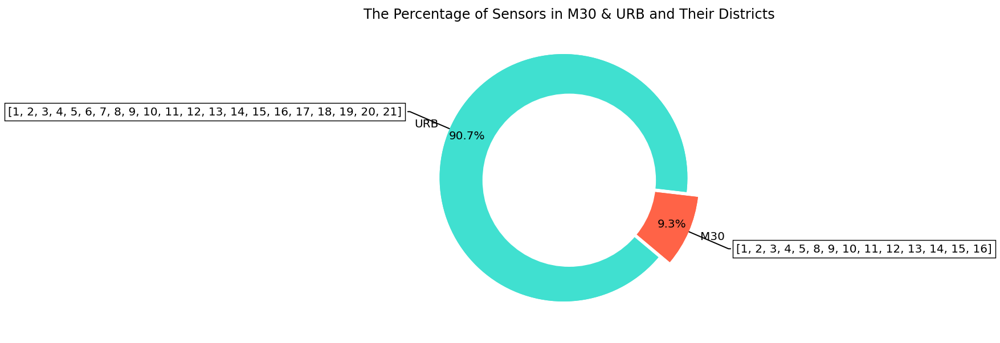

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5), subplot_kw=dict(aspect="equal"))

elem_types = list(df1["loc_elem_type"])
num_ids = list(df1["Number of IDs"])

colors = [ '#FF6347','#40E0D0']
# explosion
explode = (0.05, 0.05)

wedges, texts = ax.pie(num_ids, wedgeprops=dict(width=0.5), startangle=-40,colors=colors,explode=explode)
plt.pie(num_ids, colors=colors, wedgeprops=dict(width=0.5), startangle=-40,
                  labels=elem_types,
                  autopct='%1.1f%%', pctdistance=0.85,
                  explode=explode)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(district_num[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                horizontalalignment=horizontalalignment, **kw)

# ax.set_title("Matplotlib bakery: A donut")
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
plt.title('The Percentage of Sensors in M30 & URB and Their Districts')
plt.show()

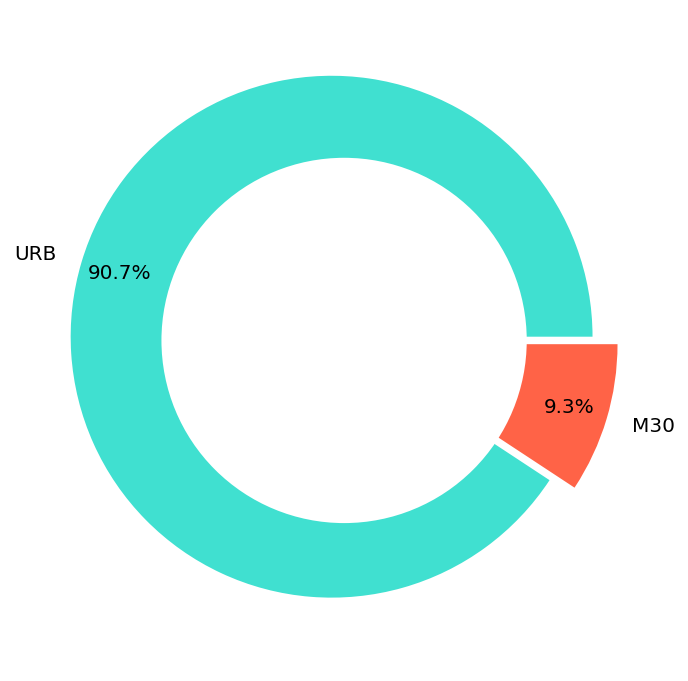

In [ ]:
elem_types = list(loc_elem_type["loc_elem_type"])
num_ids = list(loc_elem_type["Number of IDs"])
  
# colors
colors = ['#40E0D0', '#FF6347']
# explosion
explode = (0.05, 0.05)

plt.pie(num_ids, colors=colors, labels=elem_types,
        autopct='%1.1f%%', pctdistance=0.85,
        explode=explode)
  
# draw circle
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
plt.show()

#### Distance Calculation:

In [ ]:
loc_district = locationMAD.groupBy("loc_district").agg(avg("latitude").alias("latitude"), avg("longitude").alias("longitude")).sort("loc_district").toPandas()
loc_district = loc_district.iloc[1:,]
loc_district

,loc_district,latitude,longitude
1,1.0,40.417425,-3.706603
2,2.0,40.398051,-3.698437
3,3.0,40.410848,-3.674644
4,4.0,40.430408,-3.673116
5,5.0,40.457703,-3.677288
6,6.0,40.457874,-3.699099
7,7.0,40.438461,-3.704647
8,8.0,40.490352,-3.701231
9,9.0,40.445329,-3.739151
10,10.0,40.395007,-3.755418


In [ ]:
px.set_mapbox_access_token("pk.eyJ1Ijoic2hha2Fzb20iLCJhIjoiY2plMWg1NGFpMXZ5NjJxbjhlM2ttN3AwbiJ9.RtGYHmreKiyBfHuElgYq_w")

fig = px.scatter_mapbox(loc_district, 
                            lat='latitude', lon='longitude',  zoom=10,hover_name="loc_district", hover_data=["loc_district"], 
                            color="loc_district",size='latitude', color_continuous_scale=px.colors.sequential.matter, size_max=16,
                            width = 460, height=460)
fig.show()

Trying to find the closest district for sensors 5462, 5463 and 5512.

In [ ]:
null_district = locationMAD.where(locationMAD.loc_district.isNull()).toPandas()
null_district = null_district.iloc[1:,]
null_district

,loc_elem_type,loc_district,loc_id,cod_cent,name,utm_x,utm_y,longitude,latitude
1,URB,NaN,5462,60015,(AFOROS)PºCastellana S-N - Pedro Teixeira-San ...,441462.3358,4478450.138,-3.690374,40.454654
2,URB,NaN,5463,60016,PºCastellana S-N - Juán Gris- Sor Angela de la...,441485.8494,4478736.877,-3.690123,40.457238
3,URB,NaN,5512,60072,PºCastellana S-N - San Germán-Pl.Cuzco,441480.2732,4478667.717,-3.690183,40.456615


In [ ]:
fig = px.scatter_mapbox(null_district, 
                            lat='latitude', lon='longitude',  zoom=10,hover_name="loc_id", hover_data=["loc_id"], 
                            color="loc_id",size='latitude', color_continuous_scale=px.colors.sequential.matter, size_max=16,
                            width = 460, height=460)
fig.show()

In [ ]:
sensor_ids = list(null_district['loc_id'])
for i, sensor_id in zip(range(1,len(sensor_ids)+1), sensor_ids):
  print(f'The closest district is finding for Sensor ID-{sensor_id}...')
  distances= []
  new_result = 1000 # big number
  for dist in [5,6,7]:
    district_lon = loc_district[loc_district['loc_district']==dist]['longitude'].iloc[0]
    district_lat = loc_district[loc_district['loc_district']==dist]['latitude'].iloc[0]
    result = np.sqrt(np.square(null_district['longitude'][i] - district_lon) + np.square(null_district['latitude'][i] - district_lat))
    print(f'The distance to District-{dist}: {result}')
    # distances.append(result)
    if result < new_result:
      new_result = result
      found_dist = dist
    else:
      break
      
  print(f'The closest distance found {new_result} with district {found_dist}!')
  print("")

The closest district is finding for Sensor ID-5462...
The distance to District-5: 0.013436993770468642
The distance to District-6: 0.009300452954640596
The distance to District-7: 0.02158489067745847
The closest distance found 0.009300452954640596 with district 6!

The closest district is finding for Sensor ID-5463...
The distance to District-5: 0.012843913145196105
The distance to District-6: 0.008998507499066112
The distance to District-7: 0.023738541109574924
The closest distance found 0.008998507499066112 with district 6!

The closest district is finding for Sensor ID-5512...
The distance to District-5: 0.012940725268321287
The distance to District-6: 0.00900508381632762
The distance to District-7: 0.02321149931198507
The closest distance found 0.00900508381632762 with district 6!



#### Defining new LocationMAD

In [ ]:
f1 = locationMAD.filter(locationMAD.loc_id != 6637)
# f1.where(isnull('loc_district')).show()
new_locationMAD = f1.na.fill(value=6,subset=["loc_district"])
new_locationMAD.where(isnull('loc_district')).show()

+-------------+------------+------+--------+----+-----+-----+---------+--------+
|loc_elem_type|loc_district|loc_id|cod_cent|name|utm_x|utm_y|longitude|latitude|
+-------------+------------+------+--------+----+-----+-----+---------+--------+
+-------------+------------+------+--------+----+-----+-----+---------+--------+



In [ ]:
district_sensors = new_locationMAD.groupBy("loc_district","loc_elem_type").agg(countDistinct("loc_id").alias('Number of IDs'),
                                                           collect_set("loc_id").alias("Sensors")
                                                           )

df_district_sensors = district_sensors.sort("loc_district").toPandas()
df_district_sensors

,loc_district,loc_elem_type,Number of IDs,Sensors
0,1,URB,156,"[4171, 4261, 4320, 4254, 3477, 4275, 4715, 426..."
1,1,M30,8,"[6833, 1043, 6827, 6839, 6835, 1044, 1046, 6836]"
2,2,URB,201,"[4181, 3466, 4094, 4194, 4127, 4197, 4227, 109..."
3,2,M30,57,"[6873, 6850, 6880, 6685, 6872, 6680, 6895, 687..."
4,3,URB,132,"[3889, 5080, 10085, 4074, 3726, 5812, 3654, 36..."
5,3,M30,26,"[6671, 3490, 6667, 6673, 3491, 7124, 6677, 666..."
6,4,URB,196,"[3943, 4681, 4042, 3852, 3994, 4667, 7026, 387..."
7,4,M30,21,"[6665, 10174, 10266, 3800, 6664, 10175, 6666, ..."
8,5,M30,32,"[7130, 6711, 6652, 6785, 6641, 6648, 6640, 693..."
9,5,URB,307,"[4644, 4588, 4634, 10040, 5516, 3933, 3961, 46..."


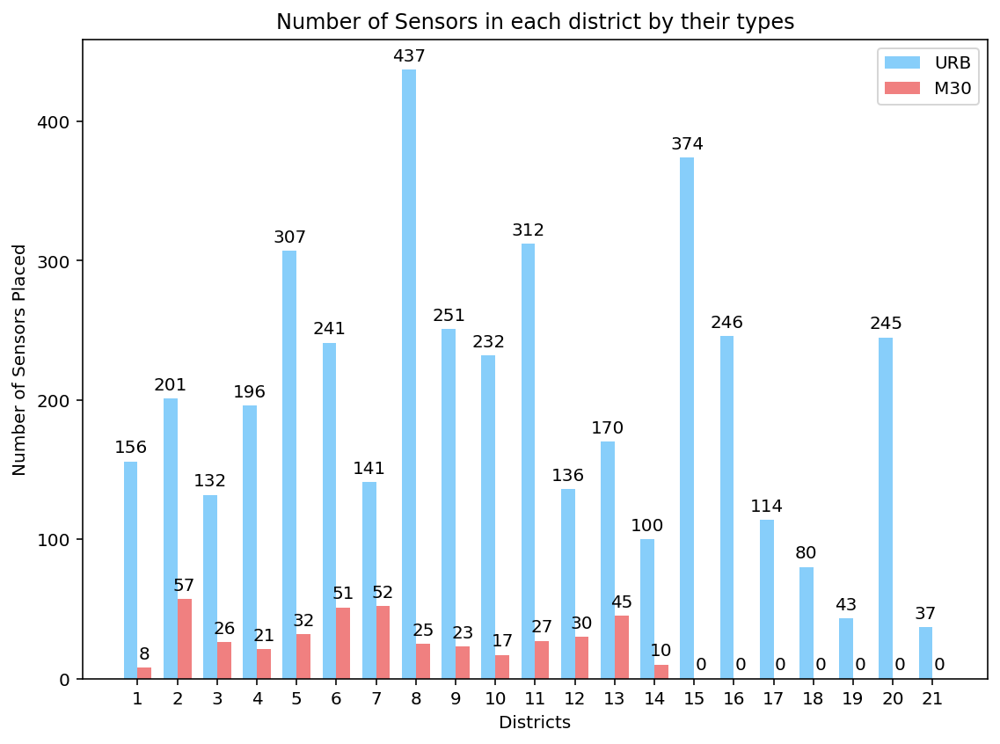

In [ ]:
def fix_dict(data):
    labels = list(df_district_sensors['loc_district'].unique())
    for d in set(labels).difference(set(data.keys())):
        data[d] = 0 # assigning 0 for elem types that do not exist in some districts..
    return data

labels = list(df_district_sensors['loc_district'].unique())
dict_URB_sensors = df_district_sensors[df_district_sensors['loc_elem_type']=='URB'].set_index('loc_district').to_dict()['Number of IDs']
dict_M30_sensors =  df_district_sensors[df_district_sensors['loc_elem_type']=='M30'].set_index('loc_district').to_dict()['Number of IDs']
urb = [v for v in fix_dict(dict_URB_sensors).values()]
m30 = [v for v in fix_dict(dict_M30_sensors).values()]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, urb, width, label='URB', color='lightskyblue')
rects2 = ax.bar(x + width/2, m30, width, label='M30', color='lightcoral')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Districts')
ax.set_ylabel('Number of Sensors Placed')
ax.set_title('Number of Sensors in each district by their types')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()

plt.show()

In [ ]:
district_sensors2 = new_locationMAD.groupBy("loc_district").agg(countDistinct("loc_id").alias('Number of IDs'),
                                                           collect_set("loc_id").alias("Sensors")
                                                           )

district_sensors2 = district_sensors2.sort("loc_district").toPandas()
district_sensors2

,loc_district,Number of IDs,Sensors
0,1,164,"[4171, 4261, 4320, 4254, 3477, 4275, 4715, 426..."
1,2,258,"[4181, 6873, 4227, 4143, 4122, 4149, 4083, 421..."
2,3,158,"[3889, 5080, 10085, 4074, 3726, 5812, 3654, 36..."
3,4,217,"[3943, 10174, 4681, 4042, 3852, 3994, 4667, 70..."
4,5,339,"[4644, 4588, 4634, 10040, 5516, 3933, 3961, 66..."
5,6,241,"[5679, 5665, 4582, 5654, 5740, 5723, 10154, 45..."
6,7,141,"[10605, 10604, 3848, 7021, 4356, 4419, 5776, 5..."
7,8,488,"[3797, 10563, 10363, 3713, 5423, 5899, 5434, 6..."
8,9,303,"[6638, 1010, 1047, 3570, 10180, 4729, 3716, 51..."
9,10,257,"[6843, 5262, 4767, 10391, 5304, 5034, 5169, 10..."


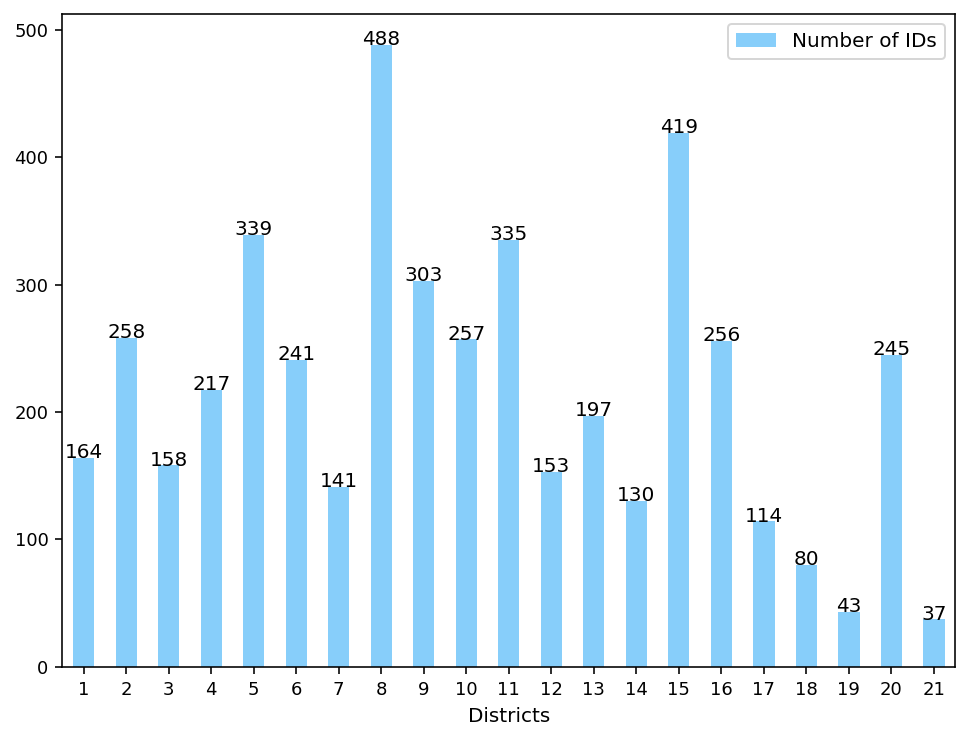

In [ ]:
# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i],ha = 'center')

x=list(district_sensors2['loc_district'])
y=list(district_sensors2['Number of IDs'])
district_sensors2.plot.bar(x = 'loc_district', y = 'Number of IDs', fontsize='9', color = 'lightskyblue')
addlabels(x, y)
plt.xticks(rotation = 0)
plt.xlabel("Districts")
plt.show()

In [ ]:
null_location = locationMAD.where(locationMAD.longtitude.isNull())
null_location.groupBy("loc_elem_type").agg(countDistinct("loc_id").alias('Number of IDs'),
                                           collect_set("loc_id").alias("Sensors"),
                                           collect_set("loc_district").alias("Districts")
                                           ).collect()

[Row(loc_elem_type='URB', Number of IDs=258, Sensors=['5196', '4644', '3713', '3933', '3961', '10692', '4624', '3952', '3676', '5876', '4292', '6600', '6634', '3950', '4433', '10289', '5874', '4175', '4429', '4492', '4764', '4425', '4753', '10217', '5878', '4409', '4004', '3944', '5889', '10273', '10610', '3497', '3462', '5871', '4036', '4001', '4900', '10279', '3930', '4631', '6635', '4480', '4052', '4009', '4387', '3980', '3608', '4348', '4174', '10276', '3931', '5894', '4757', '4224', '4430', '4898', '3965', '3966', '4381', '10277', '4012', '10296', '5197', '4428', '4450', '4309', '3958', '3997', '6545', '3813', '4457', '3940', '4911', '4455', '4456', '10805', '4055', '5906', '3719', '4307', '4414', '4441', '6582', '4412', '3911', '4359', '5886', '4405', '10286', '10395', '10295', '4053', '10278', '3690', '9991', '4426', '10283', '4481', '10509', '4439', '4306', '7077', '4305', '4177', '4422', '4403', '3567', '4308', '4914', '6583', '6546', '4297', '10274', '3909', '4002', '6568', '

In [ ]:
null_location.show(258)

+-------------+------------+------+--------+--------------------+-----+-----+----------+--------+
|loc_elem_type|loc_district|loc_id|cod_cent|                name|utm_x|utm_y|longtitude|latitude|
+-------------+------------+------+--------+--------------------+-----+-----+----------+--------+
|          URB|           1|  3855|    1021|           HORTALEZA| null| null|      null|    null|
|          URB|           5|  3909|    4001|       Concha Espina| null| null|      null|    null|
|          URB|           5|  3910|    4002|       Ramon y Cajal| null| null|      null|    null|
|          URB|           5|  3911|    4003|    Principe Vergara| null| null|      null|    null|
|          URB|           5|  3460|    4004|        Alfonso XIII| null| null|      null|    null|
|          URB|           5|  3461|    4005|       Ramon y Cajal| null| null|      null|    null|
|          URB|           5|  3925|    4019|             Dr.Arce| null| null|      null|    null|
|          URB|     

In [ ]:
null_location.groupBy("loc_elem_type","loc_district").agg(countDistinct("loc_id").alias('Number of IDs')).show()

+-------------+------------+-------------+
|loc_elem_type|loc_district|Number of IDs|
+-------------+------------+-------------+
|          URB|           3|            6|
|          URB|           9|           19|
|          URB|          12|            2|
|          URB|          10|           22|
|          URB|           4|           35|
|          URB|           5|           33|
|          URB|        null|            1|
|          URB|           6|            1|
|          URB|          11|           15|
|          URB|           2|            6|
|          URB|           8|           39|
|          URB|           1|           24|
|          URB|          17|            7|
|          URB|           7|           48|
+-------------+------------+-------------+



In [ ]:
null_district = locationMAD.where(locationMAD.loc_district.isNull())
null_district.show()

+-------------+------------+------+--------+--------------------+-----------+-----------+------------+-----------+
|loc_elem_type|loc_district|loc_id|cod_cent|                name|      utm_x|      utm_y|  longtitude|   latitude|
+-------------+------------+------+--------+--------------------+-----------+-----------+------------+-----------+
|          URB|        null|  6637|   36008|        AV. VICTORIA|       null|       null|        null|       null|
|          URB|        null|  5462|   60015|(AFOROS)PºCastell...|441462.3358|4478450.138|-3.690374183|40.45465356|
|          URB|        null|  5463|   60016|PºCastellana S-N ...|441485.8494|4478736.877| -3.69012332|40.45723828|
|          URB|        null|  5512|   60072|PºCastellana S-N ...|441480.2732|4478667.717|-3.690182706|40.45661487|
+-------------+------------+------+--------+--------------------+-----------+-----------+------------+-----------+



In [ ]:
null_district = [6637, 5462, 5463, 5512 ]

null_district_sensors  = df_traffic_minute.where(df_traffic_minute.id.isin(null_district))
null_district_sensors.groupBy("id","elem_type").agg(avg("intensity"), avg("vmed")).show()

+----+---------+------------------+---------+
|  id|elem_type|    avg(intensity)|avg(vmed)|
+----+---------+------------------+---------+
|5463|      URB|1119.3283950617283|      0.0|
|5512|      URB| 1015.619649122807|      0.0|
|5462|      URB| 1028.880670898608|      0.0|
|6637|      URB|180.59332939787484|      0.0|
+----+---------+------------------+---------+



In [ ]:
distinct_loc_district = locationMAD.select('loc_district').distinct().rdd.map(lambda r: r[0]).collect()
print(distinct_loc_district)

[12, None, 1, 13, 6, 16, 3, 20, 5, 19, 15, 9, 17, 4, 8, 7, 10, 21, 11, 14, 2, 18]


## Missing Values Analysis for Traffic Sensors Data

In [ ]:
from pyspark.sql.functions import isnan, when, count, col

# df_traffic_minute_nan = df_traffic_minute.select([c for c in df_traffic_minute.columns if c not in {'timestamp'}])
df_traffic_minute_nan  = df_traffic_minute.select([count(when(col(c).isNull(), c)).alias(c) for c in df_traffic_minute.columns])
df_traffic_minute_nan = df_traffic_minute_nan.toPandas()
df_traffic_minute_nan

,id,timestamp,elem_type,intensity,occupacion,charge,vmed,error,integration_error
0,0,0,0,0,123796,0,10896,147292,0


In [ ]:
null_vmed = df_traffic_minute.where(df_traffic_minute.vmed.isNull())
null_vmed.groupBy("elem_type").agg(countDistinct("id").alias('Number of IDs'),
                                   avg("intensity").alias("Average Intensity")).show()

+---------+-------------+-----------------+
|elem_type|Number of IDs|Average Intensity|
+---------+-------------+-----------------+
|      M30|          170|0.497154919236417|
+---------+-------------+-----------------+



In [ ]:
intensity_null_vmed = null_vmed.groupBy("intensity").agg(count("intensity").alias('Counts'),
                                                         collect_set("id").alias("Sensors"),
                                                         collect_set("timestamp").alias("Times"))
intensity_null_vmed.collect()

[Row(intensity=5, Counts=127, Sensors=['6700', '3838', '3797', '10201', '6652', '6781', '7014', '6944', '10269', '10210', '10173', '6806', '6941', '6810', '6950', '7128', '6786', '6817', '6800', '10172', '10211', '6705', '6751', '6671', '6658', '6703', '7124', '6704', '6692', '6796', '10200', '6808', '7125', '6936', '10297', '3560', '6678', '6736', '6792', '6935', '6951', '7131', '6813', '3559', '6799', '6798', '10264', '6762', '10659', '6698'], Times=[datetime.datetime(2022, 1, 14, 4, 15), datetime.datetime(2022, 1, 11, 3, 45), datetime.datetime(2022, 2, 3, 3, 45), datetime.datetime(2022, 2, 6, 4, 15), datetime.datetime(2022, 2, 2, 11, 45), datetime.datetime(2022, 1, 12, 3, 15), datetime.datetime(2022, 1, 31, 14, 30), datetime.datetime(2022, 2, 7, 2, 45), datetime.datetime(2022, 1, 23, 4, 15), datetime.datetime(2022, 1, 17, 3, 0), datetime.datetime(2022, 1, 13, 3, 0), datetime.datetime(2022, 1, 12, 2, 0), datetime.datetime(2022, 1, 13, 4, 0), datetime.datetime(2022, 1, 31, 4, 0), date

In [ ]:
Sensors=['5196', '4644', '3713', '3933', '3961', '10692', '4624', '3952', '3676', '5876', '4292', '6600', '6634', '3950', '4433', '10289', '5874', '4175', '4429', '4492', '4764', '4425', '4753', '10217', '5878', '4409', '4004', '3944', '5889', '10273', '10610', '3497', '3462', '5871', '4036', '4001', '4900', '10279', '3930', '4631', '6635', '4480', '4052', '4009', '4387', '3980', '3608', '4348', '4174', '10276', '3931', '5894', '4757', '4224', '4430', '4898', '3965', '3966', '4381', '10277', '4012', '10296', '5197', '4428', '4450', '4309', '3958', '3997', '6545', '3813', '4457', '3940', '4911', '4455', '4456', '10805', '4055', '5906', '3719', '4307', '4414', '4441', '6582', '4412', '3911', '4359', '5886', '4405', '10286', '10395', '10295', '4053', '10278', '3690', '9991', '4426', '10283', '4481', '10509', '4439', '4306', '7077', '4305', '4177', '4422', '4403', '3567', '4308', '4914', '6583', '6546', '4297', '10274', '3909', '4002', '6568', '4915', '4442', '10107', '10280', '3675', '3967', '4384', '4835', '5870', '3435', '5873', '3994', '4419', '5875', '5872', '5877', '10397', '3674', '4413', '4408', '3672', '5081', '3953', '4432', '4752', '3855', '4406', '4459', '3606', '4008', '4469', '4358', '10290', '10678', '4893', '5882', '10387', '10386', '4892', '3979', '4758', '4628', '4310', '3964', '10394', '4054', '10688', '3925', '4458', '4464', '4417', '4627', '5879', '4901', '3460', '4630', '3712', '4424', '4811', '4304', '4046', '4438', '10275', '3999', '4633', '4295', '4415', '6962', '4010', '4377', '5891', '3612', '5145', '5112', '4431', '4759', '4902', '5884', '4037', '7037', '4379', '4404', '7058', '4293', '4317', '3437', '10288', '3407', '4380', '3956', '4447', '4407', '4756', '4296', '4771', '10609', '4454', '4117', '4058', '3764', '10281', '4746', '3963', '4351', '4446', '4642', '3934', '3461', '4294', '3714', '3622', '3926', '4421', '4289', '3400', '4329', '3720', '4013', '4865', '10287', '4057', '3995', '4882', '4830', '3399', '3730', '4410', '3568', '4411', '4910', '3739', '4629', '6637', '10134', '4325', '4479', '3932', '4301', '4852', '4015', '4762', '3910']

In [ ]:
null_loc_id = df_traffic_minute.where(df_traffic_minute.id.isin(Sensors))
df3 = null_loc_id.groupBy('id').agg(avg("intensity").alias("Average Intensity"))
df4 = df3.toPandas()
df4

,id,Average Intensity
0,3606,449.941730
1,4464,796.659431
2,4417,598.349905
3,4408,265.710365
4,4415,250.003193
...,...,...
251,10281,493.259184
252,10295,373.991054
253,10395,2879.577923
254,3953,150.000000


only 2 sensors data are not here.

In [ ]:
df_traffic_minute.selectExpr(f'any(id IN {str(tuple(Sensors))})').show()

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

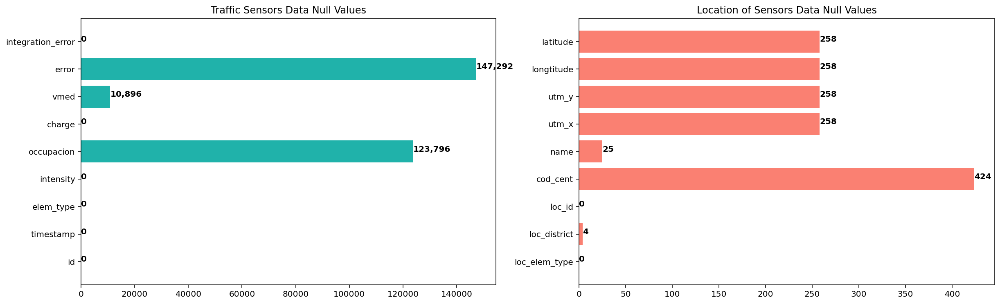

In [ ]:
# define figure size
plt.figure(figsize=(20,6))

# plot 1 - traffic sensors
x = list(df_traffic_minute_nan.columns)
y = list(df_traffic_minute_nan.values.flatten())

plt.subplot(1, 2, 1)
plt.barh(x,y, color = "lightseagreen")
plt.title("Traffic Sensors Data Null Values")

for index, value in enumerate(y):
    plt.text(value, index,
             str('{:,.0f}'.format(value)), fontweight='bold')


# plot 2 - location of sensors

df_locationMAD_nan = locationMAD_nan.toPandas()
loc_x = list(df_locationMAD_nan.columns)
loc_y = list(df_locationMAD_nan.values.flatten())

plt.subplot(1, 2, 2)
plt.barh(loc_x,loc_y, color = "salmon")
plt.title("Location of Sensors Data Null Values")
for index, value in enumerate(loc_y):
    plt.text(value, index,
             str('{:,.0f}'.format(value)), fontweight='bold')
plt.show()

# Traffic Sensors Analysis

How many sensors do M30 and URB type of roads have?

In [ ]:
id_elem_type = df_traffic_minute.groupBy("elem_type").agg(avg("intensity").alias('Average Intensity'), 
                                                          avg("vmed").alias('Average Speed of Vehicles'),
                                                          countDistinct("id").alias('Number of IDs'))
id_elem_type = id_elem_type.toPandas()
id_elem_type.index = id_elem_type['elem_type']
id_elem_type.drop('elem_type', axis=1, inplace=True)

In [ ]:
id_elem_type_sorted  = id_elem_type.sort_values(by = 'Average Intensity', ascending=False)
id_elem_type_sorted

,Average Intensity,Average Speed of Vehicles,Number of IDs
elem_type,,,
M30,1159.753304,57.637808,421
URB,284.860447,0.000000,4039


1159.7533041756478
284.860446766832
57.63780760550138
0.0
421
4039


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f8cd1294750>,
      dtype=object)

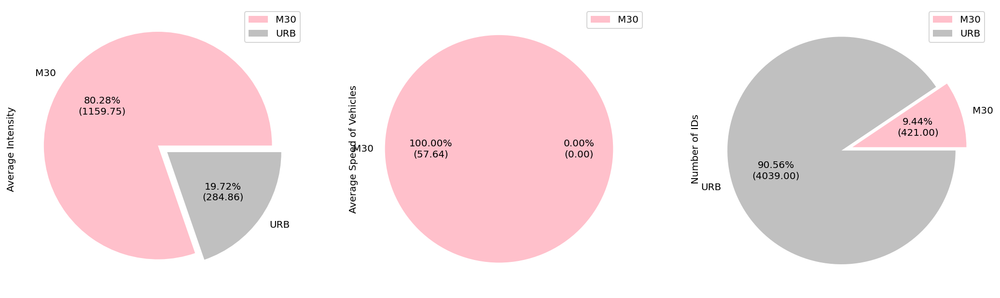

In [ ]:
i = [0]
def absolute_value(val):
    a  = id_elem_type_sorted.iloc[i[0]%len(id_elem_type),i[0]//len(id_elem_type)]
    b= "{:1.2f}%".format(val)
    i[0] += 1
    print(a)
    return b + '\n' + "({:.2f})".format(a)

id_elem_type.groupby(['elem_type']).sum().plot(
    kind='pie', subplots=True, autopct= absolute_value, #'%1.2f%%',
    colors=['pink', 'silver'], explode=(0.05, 0.05),
    figsize=(18, 10), label=True)

Time series - 3661 sensor filtering..

In [ ]:
df_traffic_minute_3661 = df_traffic_minute.filter("id='3661'")
df_traffic_minute_3661 = df_traffic_minute_3661.toPandas()
df_traffic_minute_3661

,id,timestamp,elem_type,intensity,occupacion,charge,vmed,error,integration_error
0,3661,2022-06-01 00:00:00,URB,132,2.0,15.0,0.0,N,15
1,3661,2022-06-01 00:15:00,URB,143,4.0,19.0,0.0,N,15
2,3661,2022-06-01 00:30:00,URB,106,4.0,13.0,0.0,N,15
3,3661,2022-06-01 00:45:00,URB,109,0.0,9.0,0.0,N,15
4,3661,2022-06-01 01:00:00,URB,65,1.0,12.0,0.0,N,15
...,...,...,...,...,...,...,...,...,...
17342,3661,2022-01-31 22:45:00,URB,254,20.0,36.0,0.0,N,15
17343,3661,2022-01-31 23:00:00,URB,200,8.0,28.0,0.0,N,15
17344,3661,2022-01-31 23:15:00,URB,205,8.0,25.0,0.0,N,15
17345,3661,2022-01-31 23:30:00,URB,152,5.0,21.0,0.0,N,15


In [ ]:
df_traffic_minute_3661['elem_type'].unique()

array(['URB'], dtype=object)

In [ ]:
df_traffic_minute_3661.index = df_traffic_minute_3661['timestamp']
df_traffic_minute_3661.value = df_traffic_minute_3661['intensity']
df_traffic_minute_3661.value

timestamp
2022-06-01 00:00:00    132
2022-06-01 00:15:00    143
2022-06-01 00:30:00    106
2022-06-01 00:45:00    109
2022-06-01 01:00:00     65
                      ... 
2022-01-31 22:45:00    254
2022-01-31 23:00:00    200
2022-01-31 23:15:00    205
2022-01-31 23:30:00    152
2022-01-31 23:45:00    119
Name: intensity, Length: 17347, dtype: int32

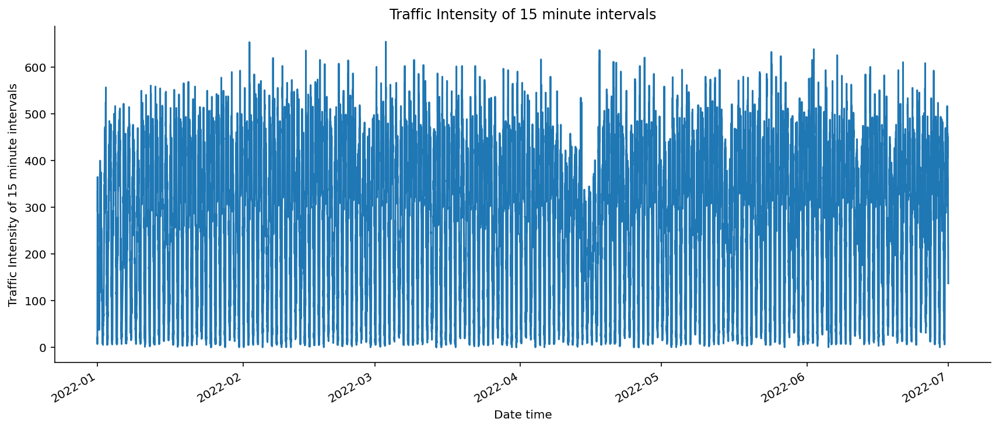

In [ ]:
df1=df_traffic_minute_3661.loc[:,['timestamp','intensity']]
df1.set_index('timestamp',inplace=True)
df1.plot(figsize=(12,5))
plt.xlabel('Date time')
plt.ylabel('Traffic Intensity of 15 minute intervals')
plt.legend().set_visible(False)
plt.tight_layout()
plt.title('Traffic Intensity of 15 minute intervals')
sns.despine(top=True)
plt.show();

In [ ]:
df_traffic_hour_3661 = df_traffic_minute_3661.groupby([pd.Grouper(freq='H', key='timestamp'), 'id']).mean().reset_index()
df_traffic_hour_3661

,timestamp,id,intensity,occupacion,charge,vmed,integration_error
0,2022-01-01 00:00:00,3661,82.50,0.50,8.00,0.0,15.00
1,2022-01-01 01:00:00,3661,329.75,34.75,47.50,0.0,15.00
2,2022-01-01 02:00:00,3661,267.25,34.75,43.75,0.0,10.00
3,2022-01-01 03:00:00,3661,125.25,2.50,14.75,0.0,8.75
4,2022-01-01 04:00:00,3661,60.00,1.00,7.25,0.0,12.75
...,...,...,...,...,...,...,...
4335,2022-06-30 19:00:00,3661,441.50,73.25,68.00,0.0,15.00
4336,2022-06-30 20:00:00,3661,431.25,45.50,60.75,0.0,15.00
4337,2022-06-30 21:00:00,3661,399.25,24.75,53.50,0.0,15.00
4338,2022-06-30 22:00:00,3661,319.00,39.25,48.25,0.0,15.00


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  


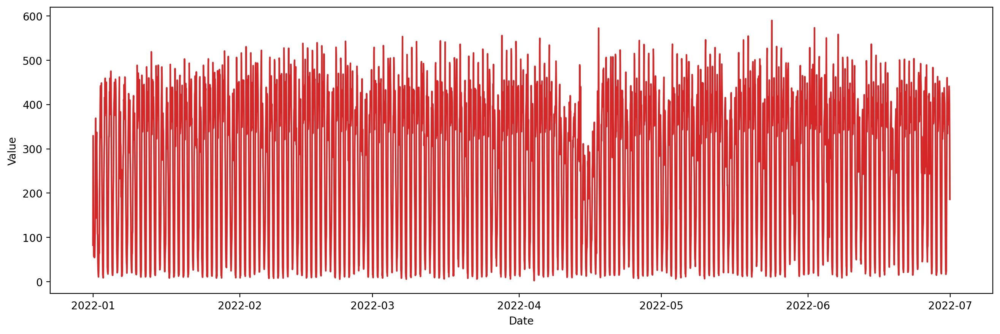

In [ ]:
df_traffic_hour_3661.index = df_traffic_hour_3661['timestamp']
df_traffic_hour_3661.value = df_traffic_hour_3661['intensity']
plot_df(df_traffic_hour_3661, x=df_traffic_hour_3661.index, y=df_traffic_hour_3661.value, title='') 

# Merging Data:
 
Assigning to 6 for these sensors and dropping 6637 sensor.

In [ ]:
f1 = locationMAD.filter(locationMAD.loc_id != 6637)
# f1.where(isnull('loc_district')).show()
new_locationMAD = f1.na.fill(value=6,subset=["loc_district"])
new_locationMAD.where(isnull('loc_district')).show()

+-------------+------------+------+--------+----+-----+-----+---------+--------+
|loc_elem_type|loc_district|loc_id|cod_cent|name|utm_x|utm_y|longitude|latitude|
+-------------+------------+------+--------+----+-----+-----+---------+--------+
+-------------+------------+------+--------+----+-----+-----+---------+--------+



In [ ]:
df_traffic_minute.filter(df_traffic_minute.id == 6637).show()

+----+-------------------+---------+---------+----------+------+----+-----+-----------------+
|  id|          timestamp|elem_type|intensity|occupacion|charge|vmed|error|integration_error|
+----+-------------------+---------+---------+----------+------+----+-----+-----------------+
|6637|2022-06-01 00:00:00|      URB|       47|       0.0|   3.0| 0.0|    N|               15|
|6637|2022-06-01 00:15:00|      URB|       46|       1.0|   5.0| 0.0|    N|               15|
|6637|2022-06-01 00:30:00|      URB|       30|       1.0|   3.0| 0.0|    N|               15|
|6637|2022-06-01 00:45:00|      URB|       19|       0.0|   2.0| 0.0|    N|               15|
|6637|2022-06-01 01:00:00|      URB|       19|       1.0|   4.0| 0.0|    N|               15|
|6637|2022-06-01 01:15:00|      URB|       25|       0.0|   2.0| 0.0|    N|               15|
|6637|2022-06-01 01:30:00|      URB|       17|       0.0|   3.0| 0.0|    N|               15|
|6637|2022-06-01 01:45:00|      URB|        7|       0.0|   

In [ ]:
trafficMAD = df_traffic_minute.join(new_locationMAD,df_traffic_minute.id ==  new_locationMAD.loc_id,"inner")

In [ ]:
trafficMAD.filter(trafficMAD.id == 6637).show()

+---+---------+---------+---------+----------+------+----+-----+-----------------+-------------+------------+------+--------+----+-----+-----+---------+--------+
| id|timestamp|elem_type|intensity|occupacion|charge|vmed|error|integration_error|loc_elem_type|loc_district|loc_id|cod_cent|name|utm_x|utm_y|longitude|latitude|
+---+---------+---------+---------+----------+------+----+-----+-----------------+-------------+------------+------+--------+----+-----+-----+---------+--------+
+---+---------+---------+---------+----------+------+----+-----+-----------------+-------------+------------+------+--------+----+-----+-----+---------+--------+



In [ ]:
trafficMAD.select([count(when(col(c).isNull(), c)).alias(c) for c in trafficMAD.columns]).show()

+---+---------+---------+---------+----------+------+-----+------+-----------------+-------------+------------+------+--------+-----+-------+-------+---------+--------+
| id|timestamp|elem_type|intensity|occupacion|charge| vmed| error|integration_error|loc_elem_type|loc_district|loc_id|cod_cent| name|  utm_x|  utm_y|longitude|latitude|
+---+---------+---------+---------+----------+------+-----+------+-----------------+-------------+------------+------+--------+-----+-------+-------+---------+--------+
|  0|        0|        0|        0|    123796|     0|10896|147292|                0|            0|           0|     0| 3237797|90966|4251122|4251122|  4251122| 4251122|
+---+---------+---------+---------+----------+------+-----+------+-----------------+-------------+------------+------+--------+-----+-------+-------+---------+--------+



In [ ]:
vmed_data = trafficMAD.filter("vmed==0")
vmed_data.groupBy("elem_type").count().show()

+---------+--------+
|elem_type|   count|
+---------+--------+
|      URB|65717283|
|      M30|  201104|
+---------+--------+



In [ ]:
vmed_data

65918387

In [ ]:
trafficMAD.show()

+----+-------------------+---------+---------+----------+------+----+-----+-----------------+-------------+------------+------+--------+----------+-----------+-----------+-----------+-----------+
|  id|          timestamp|elem_type|intensity|occupacion|charge|vmed|error|integration_error|loc_elem_type|loc_district|loc_id|cod_cent|      name|      utm_x|      utm_y|  longitude|   latitude|
+----+-------------------+---------+---------+----------+------+----+-----+-----------------+-------------+------------+------+--------+----------+-----------+-----------+-----------+-----------+
|1001|2022-06-01 00:00:00|      M30|      612|       2.0|   0.0|61.0|    N|                5|          M30|          10|  1001|    null|05FT10PM01|437146.0227|4473498.172|-3.74078578|40.40972919|
|1001|2022-06-01 00:15:00|      M30|      612|       1.0|   0.0|62.0|    N|                5|          M30|          10|  1001|    null|05FT10PM01|437146.0227|4473498.172|-3.74078578|40.40972919|
|1001|2022-06-01 00:

In [ ]:
trafficMAD_selected = trafficMAD.select("id", "timestamp", "elem_type", "intensity", "vmed", "loc_district", "name", "longitude", "latitude")
trafficMAD_selected.show()

+----+-------------------+---------+---------+----+------------+----------+-----------+-----------+
|  id|          timestamp|elem_type|intensity|vmed|loc_district|      name|  longitude|   latitude|
+----+-------------------+---------+---------+----+------------+----------+-----------+-----------+
|1001|2022-06-01 00:00:00|      M30|      612|61.0|          10|05FT10PM01|-3.74078578|40.40972919|
|1001|2022-06-01 00:15:00|      M30|      612|62.0|          10|05FT10PM01|-3.74078578|40.40972919|
|1001|2022-06-01 00:30:00|      M30|      492|58.0|          10|05FT10PM01|-3.74078578|40.40972919|
|1001|2022-06-01 00:45:00|      M30|      348|58.0|          10|05FT10PM01|-3.74078578|40.40972919|
|1001|2022-06-01 01:00:00|      M30|      300|56.0|          10|05FT10PM01|-3.74078578|40.40972919|
|1001|2022-06-01 01:15:00|      M30|      168|55.0|          10|05FT10PM01|-3.74078578|40.40972919|
|1001|2022-06-01 01:30:00|      M30|      120|53.0|          10|05FT10PM01|-3.74078578|40.40972919|


In [ ]:
trafficMAD_selected.count()

68955080

Averaging the values according to the district information:

In [ ]:
trafficMAD_district = trafficMAD_selected.groupBy("timestamp", "loc_district").agg(avg("intensity").alias("Avg_Intensity")).sort("timestamp", "loc_district")
trafficMAD_district = trafficMAD_district.toPandas() # bcz there are 21 districts..
trafficMAD_district

,timestamp,loc_district,Avg_Intensity
0,2022-01-01 00:00:00,1,166.000000
1,2022-01-01 00:00:00,2,100.873239
2,2022-01-01 00:00:00,3,88.093750
3,2022-01-01 00:00:00,4,95.045977
4,2022-01-01 00:00:00,5,59.714912
...,...,...,...
364729,2022-06-30 23:45:00,17,158.314815
364730,2022-06-30 23:45:00,18,95.904110
364731,2022-06-30 23:45:00,19,130.257143
364732,2022-06-30 23:45:00,20,129.198276


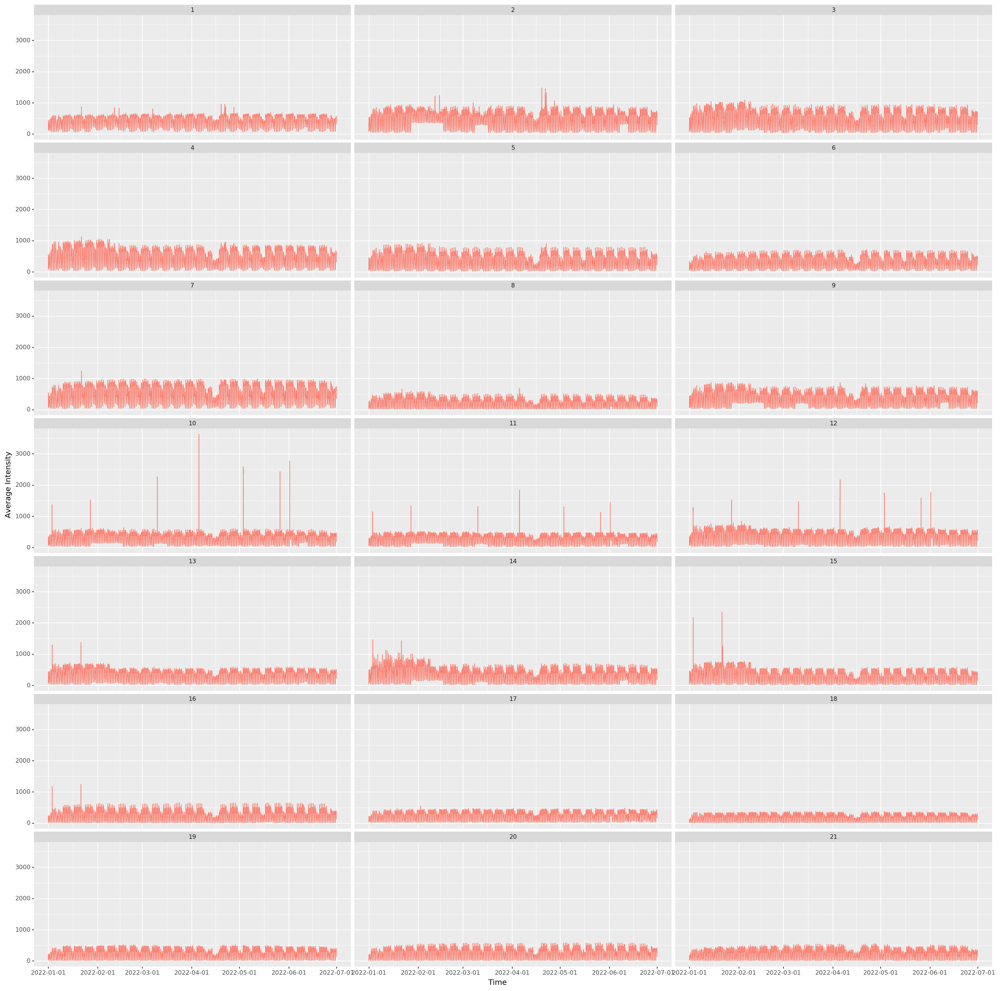

In [ ]:
from plotnine import *

# for dist in list(range(1, 21+1)):
# df_trafficMAD_ts[df_trafficMAD_ts['loc_district']==dist]
print( 
  ggplot(trafficMAD_district, aes(x = 'timestamp', y = 'Avg_Intensity')) 
          + geom_line(color='salmon') 
          + labs(x='Time', y='Average Intensity')
          + facet_wrap('loc_district', nrow=7)
          + theme(figure_size=(25, 25))
  )

In [ ]:
trafficMAD_dist_sensors = trafficMAD_selected.groupBy("loc_district","elem_type").agg(avg("intensity").alias("Avg_Intensity"),
                                                                            collect_set("id").alias("Sensors")).sort("loc_district")
trafficMAD_dist_sensors.collect()

[Row(loc_district=1, elem_type='URB', Avg_Intensity=381.1543443109185, Sensors=['4261', '4320', '4254', '3477', '4715', '4264', '4392', '3731', '4247', '4292', '3672', '4385', '4353', '4323', '10258', '4717', '4238', '3855', '4394', '4291', '4205', '7139', '10528', '3475', '10639', '4268', '4712', '4258', '4402', '10678', '3691', '4202', '4318', '10387', '4256', '10386', '7113', '7087', '10530', '4310', '7102', '3854', '4206', '4265', '4212', '4417', '7101', '4287', '4395', '4204', '4400', '4290', '4391', '4382', '4387', '10608', '4312', '4295', '4263', '4330', '4324', '4170', '4390', '4711', '4386', '4707', '4266', '10259', '5104', '4293', '4317', '4252', '3669', '4173', '4309', '4389', '4209', '3401', '4296', '4710', '4283', '3618', '3846', '4282', '4270', '3707', '4262', '10491', '4269', '4307', '3478', '4199', '4695', '4314', '4328', '4294', '10527', '3842', '5117', '4289', '4713', '4311', '7041', '4257', '4251', '4306', '4714', '4201', '4331', '7138', '4305', '5116', '4298', '1042

In [ ]:
trafficMAD_ts = trafficMAD_selected.groupBy("loc_district", "timestamp","elem_type").agg(avg("intensity").alias("Avg_Intensity"),
                                                                                                avg("latitude").alias("latitude"),
                                                                                                avg("longitude").alias("longitude")).sort("loc_district","timestamp")
trafficMAD_ts.show()

+------------+-------------------+---------+------------------+------------------+-------------------+
|loc_district|          timestamp|elem_type|     Avg_Intensity|          latitude|          longitude|
+------------+-------------------+---------+------------------+------------------+-------------------+
|           1|2022-01-01 00:00:00|      URB|  170.406015037594|40.417074542568805|  -3.70633473653211|
|           1|2022-01-01 00:00:00|      M30| 82.28571428571429| 40.41781065857143| -3.721394669285714|
|           1|2022-01-01 00:15:00|      M30|61.714285714285715| 40.41781065857143| -3.721394669285714|
|           1|2022-01-01 00:15:00|      URB|150.82575757575756|40.417130444074076| -3.706217344027778|
|           1|2022-01-01 00:30:00|      M30|30.857142857142858| 40.41781065857143| -3.721394669285714|
|           1|2022-01-01 00:30:00|      URB|207.87313432835822|40.417010777363636| -3.706391515990909|
|           1|2022-01-01 00:45:00|      URB|277.55970149253733| 40.417054

In [ ]:
df_trafficMAD_ts = trafficMAD_ts.toPandas()

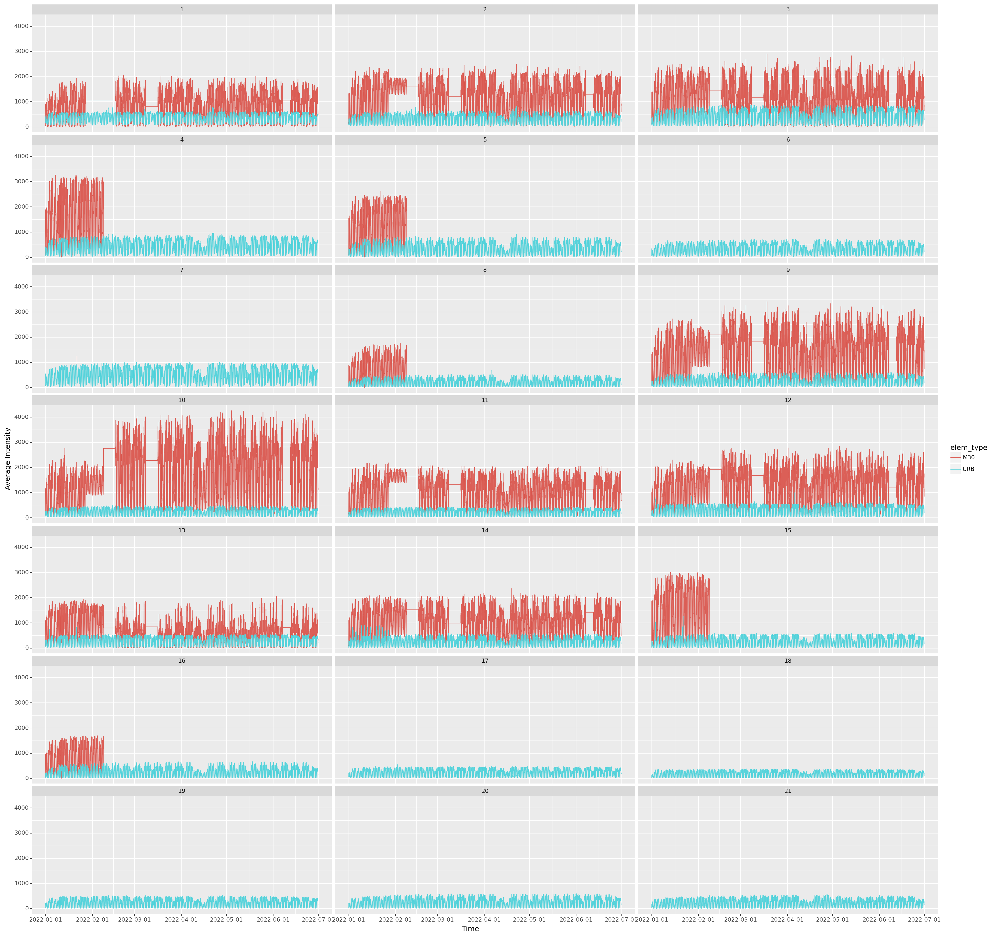

In [ ]:
from plotnine import *

# for dist in list(range(1, 21+1)):
# df_trafficMAD_ts[df_trafficMAD_ts['loc_district']==dist]
print( 
  ggplot(df_trafficMAD_ts, aes(x = 'timestamp', y = 'Avg_Intensity', color = 'elem_type')) 
          + geom_line() 
          + labs(x='Time', y='Average Intensity')
          + facet_wrap('loc_district', nrow=7)
          + theme(figure_size=(25, 25))
  )


In [ ]:
df_trafficMAD_ts_urb = df_trafficMAD_ts[df_trafficMAD_ts['elem_type']=='URB']
print(df_trafficMAD_ts_urb.isnull().sum())
print(df_trafficMAD_ts_urb.head(5))

loc_district     0
timestamp        0
elem_type        0
Avg_Intensity    0
latitude         0
longitude        0
dtype: int64
   loc_district           timestamp elem_type  Avg_Intensity   latitude  \
0             1 2022-01-01 00:00:00       URB     170.406015  40.417075   
2             1 2022-01-01 00:15:00       URB     150.825758  40.417130   
5             1 2022-01-01 00:30:00       URB     207.873134  40.417011   
7             1 2022-01-01 00:45:00       URB     277.559701  40.417054   
9             1 2022-01-01 01:00:00       URB     336.185185  40.417054   

   longitude  
0  -3.706335  
2  -3.706217  
5  -3.706392  
7  -3.706267  
9  -3.706211  


In [ ]:
df_trafficMAD_ts_urb.groupby(['loc_district'])['Avg_Intensity'].agg('mean')

loc_district
1     380.472677
2     318.161351
3     416.635939
4     439.499099
5     339.047902
6     322.749171
7     499.806298
8     198.198021
9     256.880033
10    233.563517
11    215.494824
12    300.786871
13    286.735265
14    244.322216
15    257.235016
16    227.258943
17    229.236021
18    167.781063
19    226.461650
20    243.156060
21    214.721329
Name: Avg_Intensity, dtype: float64

District 7 has the maximum average intensity..

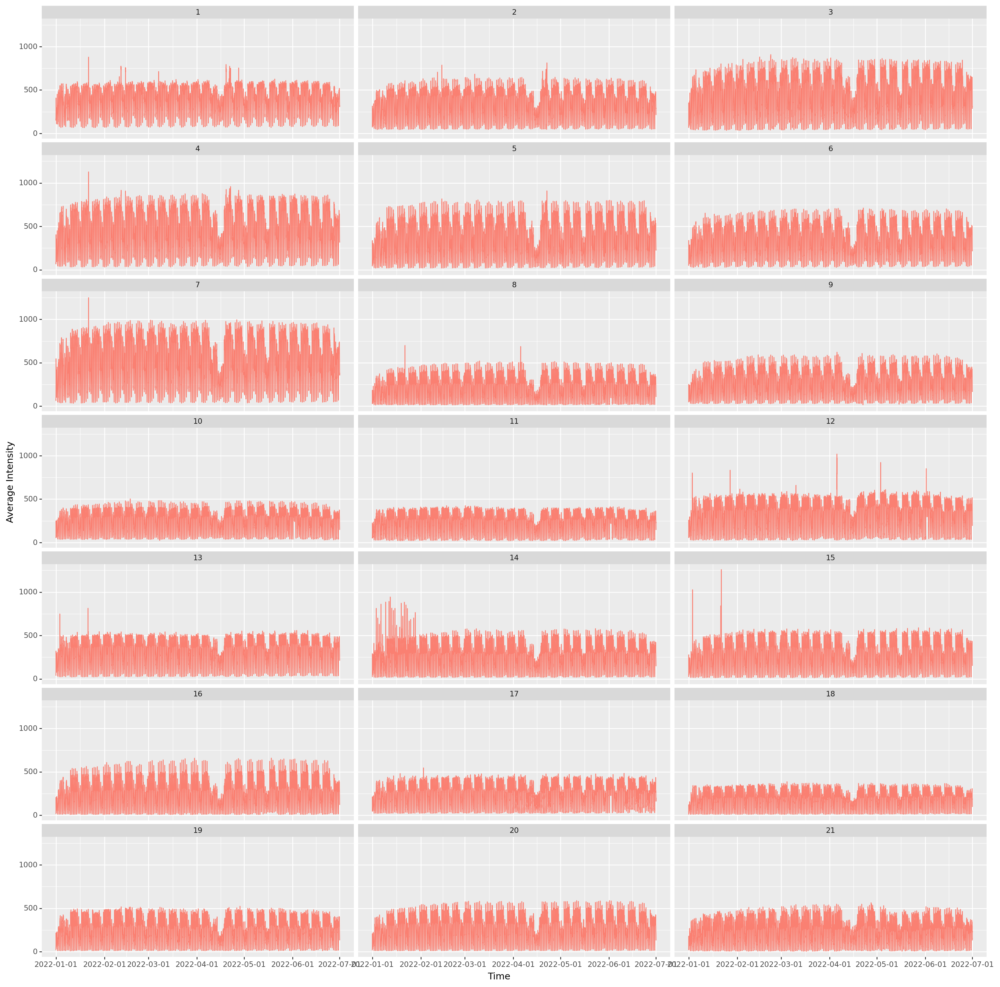

In [ ]:
from plotnine import *

# for dist in list(range(1, 21+1)):
# df_trafficMAD_ts[df_trafficMAD_ts['loc_district']==dist]
print( 
  ggplot(df_trafficMAD_ts_urb, aes(x = 'timestamp', y = 'Avg_Intensity', )) 
          + geom_line(color='salmon') 
          + labs(x='Time', y='Average Intensity')
          + facet_wrap('loc_district', nrow=7)
          + theme(figure_size=(20, 20))
  )


# Filling missing values in the series by interpolation method

In [ ]:
# 1 kolonluk 1 ocaktan 30 hazirana kadar 15 dakika aralıklarla zaman serisi oluştur.
all_times = pd.date_range(start='2022-01-01', end='2022-07-01', freq='15T')
df1 = pd.DataFrame (all_times, columns = ['timestamp'])
df_all_times = df1.iloc[:-1]
print(f'The number of unique times: {len(df_all_times)}') 
df_all_times

The number of unique times: 17376


,timestamp
0,2022-01-01 00:00:00
1,2022-01-01 00:15:00
2,2022-01-01 00:30:00
3,2022-01-01 00:45:00
4,2022-01-01 01:00:00
...,...
17371,2022-06-30 22:45:00
17372,2022-06-30 23:00:00
17373,2022-06-30 23:15:00
17374,2022-06-30 23:30:00


In [ ]:
df_trafficMAD_ts_urb.groupby('loc_district')['timestamp'].count()
# df2 = df.groupby(['Courses'])['Courses'].count()

loc_district
1     17373
2     17372
3     17372
4     17373
5     17372
6     17372
7     17373
8     17372
9     17372
10    17339
11    17339
12    17371
13    17372
14    17371
15    17372
16    17367
17    17339
18    17343
19    17367
20    17367
21    17367
Name: timestamp, dtype: int64

In [ ]:
na_df_trafficMAD_ts_urb = pd.DataFrame()

for dist in list(range(1,22)):
  district_data = df_trafficMAD_ts_urb[df_trafficMAD_ts_urb['loc_district']== dist].iloc[: , 1:]

  join_df = pd.merge(district_data,df_all_times,on='timestamp',how='outer')
  join_df.insert(0, 'loc_district', dist)
  
  #concat
  na_df_trafficMAD_ts_urb = pd.concat([na_df_trafficMAD_ts_urb, join_df])
na_df_trafficMAD_ts_urb= na_df_trafficMAD_ts_urb.sort_values(['loc_district', 'timestamp'])
na_df_trafficMAD_ts_urb

,loc_district,timestamp,elem_type,Avg_Intensity,latitude,longitude
0,1,2022-01-01 00:00:00,URB,170.406015,40.417075,-3.706335
1,1,2022-01-01 00:15:00,URB,150.825758,40.417130,-3.706217
2,1,2022-01-01 00:30:00,URB,207.873134,40.417011,-3.706392
3,1,2022-01-01 00:45:00,URB,277.559701,40.417054,-3.706267
4,1,2022-01-01 01:00:00,URB,336.185185,40.417054,-3.706211
...,...,...,...,...,...,...
17362,21,2022-06-30 22:45:00,URB,192.740741,40.464615,-3.592610
17363,21,2022-06-30 23:00:00,URB,157.703704,40.464615,-3.592610
17364,21,2022-06-30 23:15:00,URB,152.310345,40.464303,-3.593532
17365,21,2022-06-30 23:30:00,URB,153.482759,40.464303,-3.593532


In [ ]:
na_df_trafficMAD_ts_urb.isnull().sum()

loc_district       0
timestamp          0
elem_type        231
Avg_Intensity    231
latitude         231
longitude        231
dtype: int64

In [ ]:
na_df_trafficMAD_ts_urb.groupby('loc_district').agg({'Avg_Intensity': lambda x: x.isnull().sum()})

,Avg_Intensity
loc_district,
1,3.0
2,4.0
3,4.0
4,3.0
5,4.0
6,4.0
7,3.0
8,4.0
9,4.0


In [ ]:
na_df_trafficMAD_ts_urb['Avg_Intensity'] = na_df_trafficMAD_ts_urb['Avg_Intensity'].interpolate()
na_df_trafficMAD_ts_urb['elem_type'].fillna(value='URB', inplace=True)
na_df_trafficMAD_ts_urb.isnull().sum()

loc_district       0
timestamp          0
elem_type          0
Avg_Intensity      0
latitude         231
longitude        231
dtype: int64

In [ ]:
fill_na_df_trafficMAD_ts_urb = pd.DataFrame()

for dist in list(range(1,22)):
  district_data = na_df_trafficMAD_ts_urb[na_df_trafficMAD_ts_urb['loc_district']==dist]
  mean_lat = district_data['latitude'].mean()
  district_data['latitude'].fillna(value=mean_lat, inplace=True)

  mean_lon = district_data['longitude'].mean()
  district_data['longitude'].fillna(value=mean_lon, inplace=True)

  fill_na_df_trafficMAD_ts_urb = pd.concat([fill_na_df_trafficMAD_ts_urb, district_data])
fill_na_df_trafficMAD_ts_urb.isnull().sum()

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4523: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4523: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4523: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4523: SettingWithCopyWarning: 
A value is try

loc_district     0
timestamp        0
elem_type        0
Avg_Intensity    0
latitude         0
longitude        0
dtype: int64

In [ ]:
fill_na_df_trafficMAD_ts_urb.to_csv('/content/drive/MyDrive/THESIS/Producing_15_mins/trafficMAD_ts_urb_2022.csv', index=False,header=True)

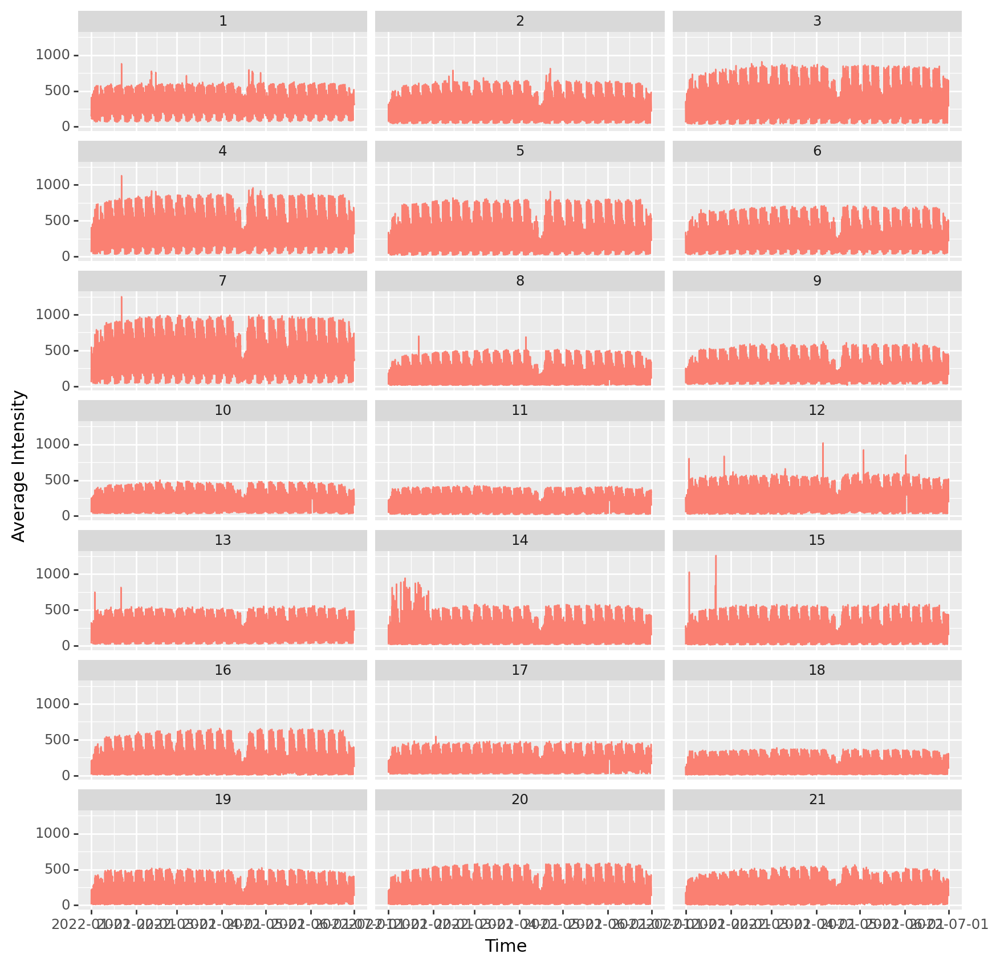

In [ ]:
from plotnine import *
print( 
  ggplot(fill_na_df_trafficMAD_ts_urb, aes(x = 'timestamp', y = 'Avg_Intensity', )) 
          + geom_line(color='salmon') 
          + labs(x='Time', y='Average Intensity')
          + facet_wrap('loc_district', nrow=7)
          + theme(figure_size=(10, 10))
  )

In [ ]:
fill_na_df_trafficMAD_ts_urb.groupby('loc_district')['Avg_Intensity'].mean()

loc_district
1     380.472352
2     318.143808
3     416.603950
4     439.471842
5     339.030366
6     322.736469
7     499.785508
8     198.190443
9     256.860997
10    233.705645
11    215.622853
12    300.769456
13    286.712746
14    244.307775
15    257.239597
16    227.262144
17    229.383453
18    167.901171
19    226.459090
20    243.155425
21    214.717282
Name: Avg_Intensity, dtype: float64

Let's analyze the 3 and 7th districts and predict their intensities.

In [ ]:
fill_na_df_trafficMAD_ts_urb.groupby('loc_district')['timestamp'].count()

loc_district
1     17376
2     17376
3     17376
4     17376
5     17376
6     17376
7     17376
8     17376
9     17376
10    17376
11    17376
12    17376
13    17376
14    17376
15    17376
16    17376
17    17376
18    17376
19    17376
20    17376
21    17376
Name: timestamp, dtype: int64

In [ ]:
all_times = fill_na_df_trafficMAD_ts_urb['timestamp'].unique()
print(len(all_times))
print(all_times)

17376
['2022-01-01T00:00:00.000000000' '2022-01-01T00:15:00.000000000'
 '2022-01-01T00:30:00.000000000' ... '2022-06-30T23:15:00.000000000'
 '2022-06-30T23:30:00.000000000' '2022-06-30T23:45:00.000000000']


# Analyzing the Time series Characteristics of One district - district 3

In [ ]:
# reading the modified 6 months time series data:
modified_trafficMAD_urb_2022 = pd.read_csv('/content/drive/MyDrive/THESIS/Producing_15_mins/trafficMAD_ts_urb_2022.csv', header=0)
modified_trafficMAD_urb_2022.dtypes

loc_district       int64
timestamp         object
elem_type         object
Avg_Intensity    float64
latitude         float64
longitude        float64
dtype: object

In [ ]:
modified_trafficMAD_urb_2022

,loc_district,timestamp,elem_type,Avg_Intensity,latitude,longitude
0,1,2022-01-01 00:00:00,URB,170.406015,40.417075,-3.706335
1,1,2022-01-01 00:15:00,URB,150.825758,40.417130,-3.706217
2,1,2022-01-01 00:30:00,URB,207.873134,40.417011,-3.706392
3,1,2022-01-01 00:45:00,URB,277.559701,40.417054,-3.706267
4,1,2022-01-01 01:00:00,URB,336.185185,40.417054,-3.706211
...,...,...,...,...,...,...
364891,21,2022-06-30 22:45:00,URB,192.740741,40.464615,-3.592610
364892,21,2022-06-30 23:00:00,URB,157.703704,40.464615,-3.592610
364893,21,2022-06-30 23:15:00,URB,152.310345,40.464303,-3.593532
364894,21,2022-06-30 23:30:00,URB,153.482759,40.464303,-3.593532


As an example, the 3rd district time series data will be used as a prediction case:

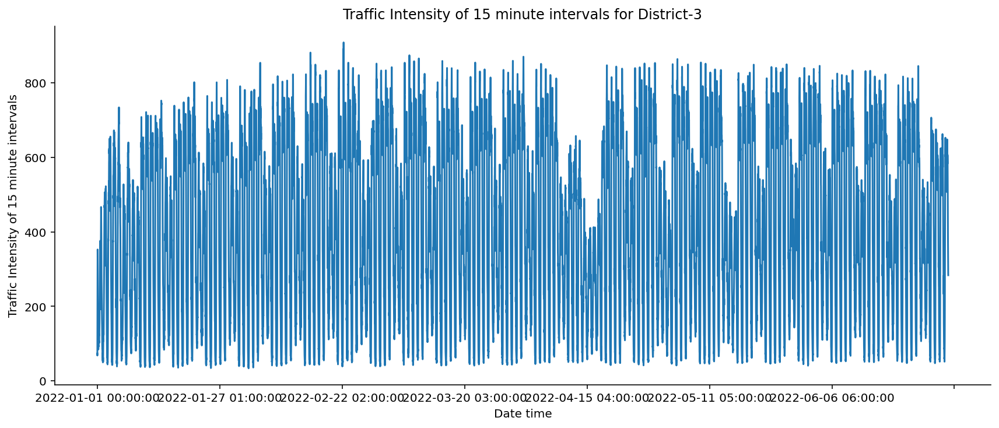

In [ ]:
# All districts:
ts_trafficMAD_urb_2022_dist_3 = modified_trafficMAD_urb_2022[modified_trafficMAD_urb_2022['loc_district']==3]
df_ts_indexed=ts_trafficMAD_urb_2022_dist_3.loc[:,['timestamp','Avg_Intensity']]

df_ts_indexed.set_index('timestamp',inplace=True)
df_ts_indexed.plot(figsize=(12,5))
plt.xlabel('Date time')
plt.ylabel('Traffic Intensity of 15 minute intervals')
plt.legend().set_visible(False)
plt.tight_layout()
plt.title('Traffic Intensity of 15 minute intervals for District-3')
sns.despine(top=True)
plt.show();

In [ ]:
from scipy import stats

stat, p = stats.normaltest(ts_trafficMAD_urb_2022_dist_3.Avg_Intensity)
print('Statistics=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Data looks Gaussian (fail to reject H0)')
else:
    print('Data does not look Gaussian (reject H0)')

Statistics=145362.570, p=0.000
Data does not look Gaussian (reject H0)


Kurtosis of normal distribution: -1.4172535216849713
Skewness of normal distribution: -0.09615288353832005


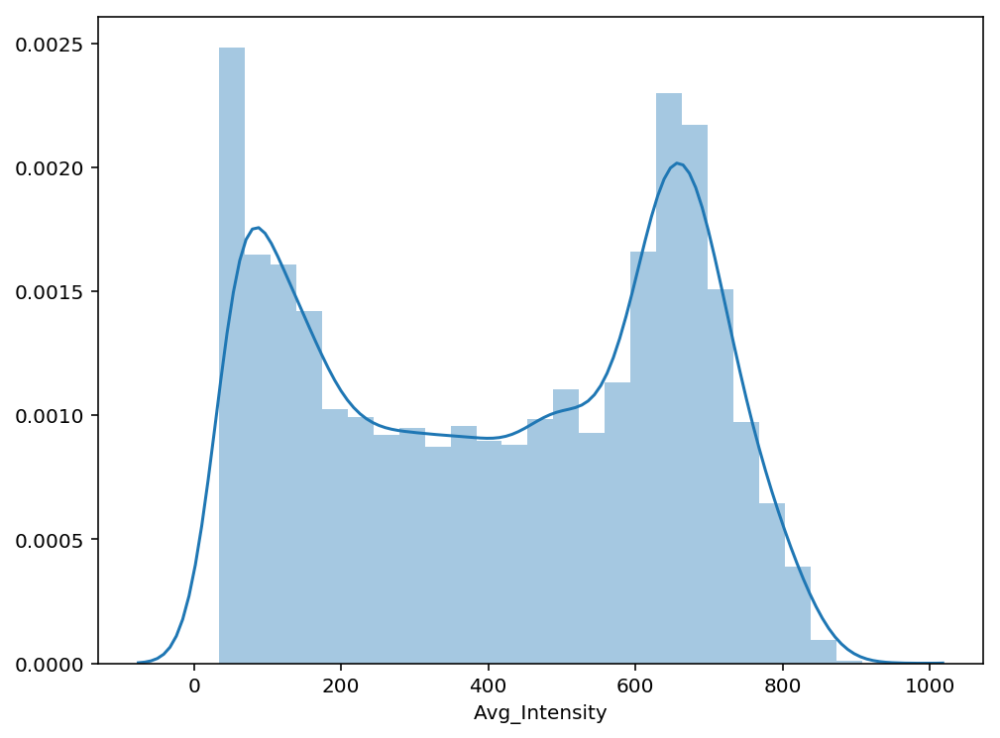

In [ ]:
sns.distplot(ts_trafficMAD_urb_2022_dist_3.Avg_Intensity);
print( 'Kurtosis of normal distribution: {}'.format(stats.kurtosis(ts_trafficMAD_urb_2022_dist_3.Avg_Intensity)))
print( 'Skewness of normal distribution: {}'.format(stats.skew(ts_trafficMAD_urb_2022_dist_3.Avg_Intensity)))

## Modifing the data as time series, to do that assign the index column to timestamp:

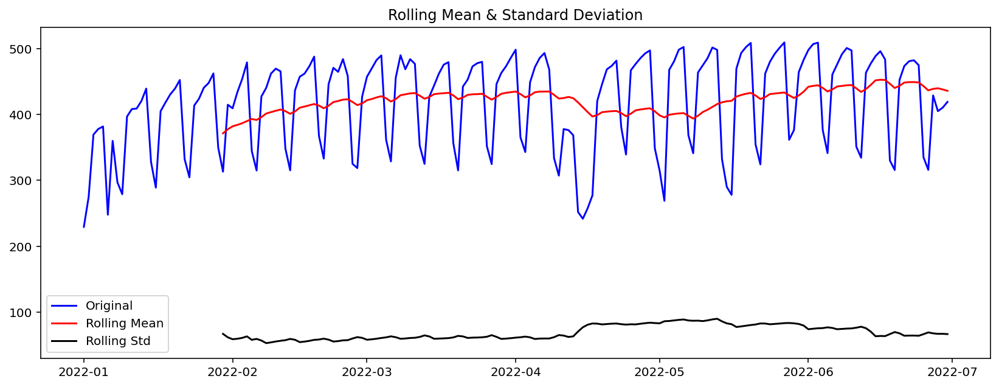

<Results of Dickey-Fuller Test>
Test Statistic                  -3.023430
p-value                          0.032763
#Lags Used                      14.000000
Number of Observations Used    166.000000
Critical Value (1%)             -3.470370
Critical Value (5%)             -2.879114
Critical Value (10%)            -2.576139
dtype: float64


In [ ]:
# Stationarity test
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import pacf

# df1=ts_trafficMAD_urb_2022_dist_3.loc[:,['timestamp','Avg_Intensity']]
# df1.set_index('timestamp',inplace=True)
df_ts_indexed.index = pd.to_datetime(df_ts_indexed.index)
df2=df_ts_indexed.resample('D').agg('mean')

def test_stationarity(timeseries):
    rolmean = timeseries.rolling(window=30).mean()
    rolstd = timeseries.rolling(window=30).std()
    
    plt.figure(figsize=(14,5))
    sns.despine(left=True)
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')

    plt.legend(loc='best'); plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    print ('<Results of Dickey-Fuller Test>')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4],
                         index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
test_stationarity(df2.Avg_Intensity)

Time series of district 3 is stationary... because the p-value is less than 0.05.

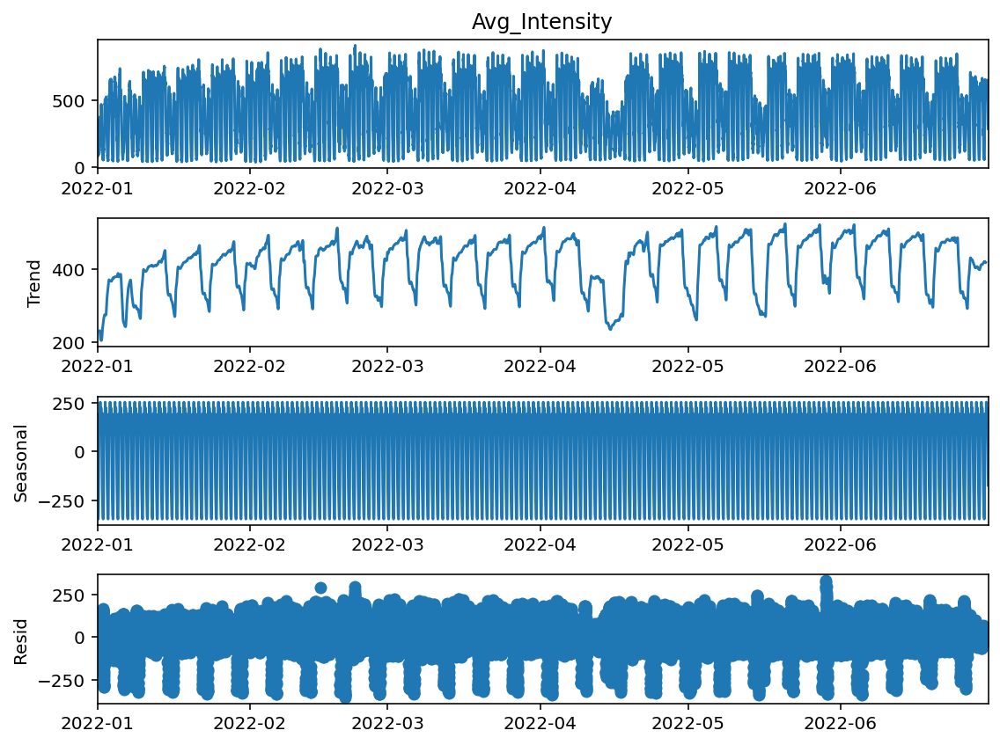

In [ ]:
#bu kütüphaneyle de oluyo..
from statsmodels.tsa.seasonal import seasonal_decompose

result = seasonal_decompose(df_ts_indexed['Avg_Intensity'],period=96)
result.plot();

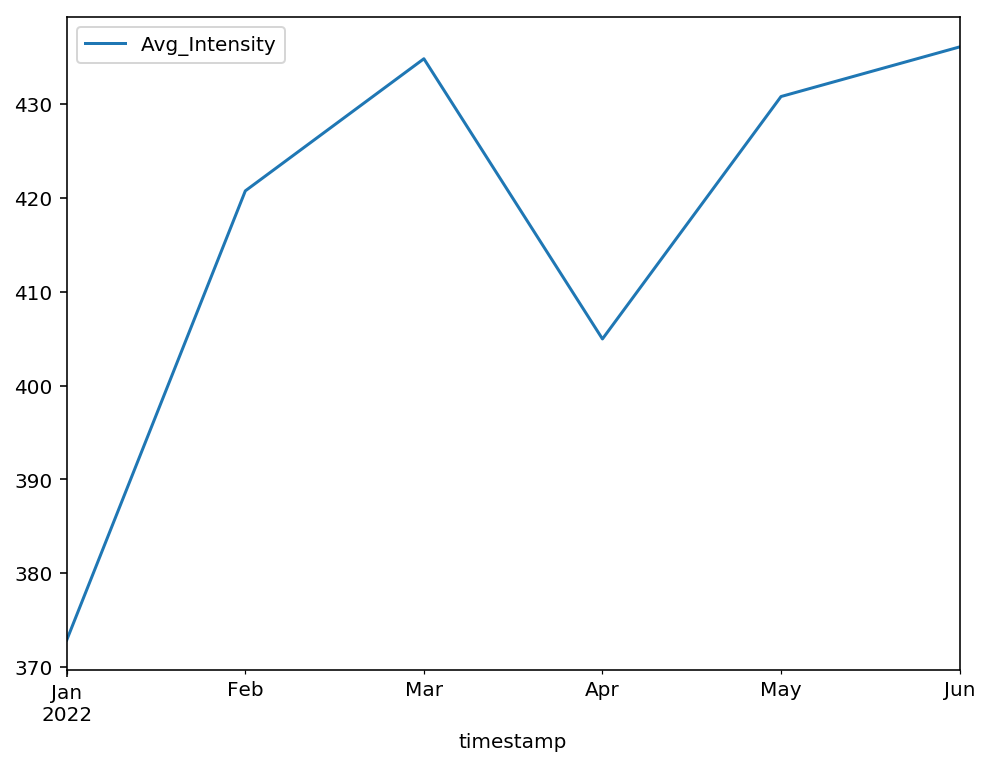

In [ ]:
x = df_ts_indexed['Avg_Intensity'].resample('M').mean()
x = x.reset_index()
x['timestamp'] = pd.to_datetime(x['timestamp'])
x['timestamp'] = x['timestamp'].dt.to_period('M')
x.set_index('timestamp').plot()
# x.plot(x='timestamp', y='Avg_Intensity')

In [ ]:
x = df_ts_indexed['Avg_Intensity'].resample('W').mean()
x

timestamp
2022-01-02    252.161453
2022-01-09    330.505591
2022-01-16    384.539365
2022-01-23    397.587469
2022-01-30    407.480583
2022-02-06    407.378860
2022-02-13    418.496680
2022-02-20    431.218918
2022-02-27    424.101123
2022-03-06    431.151573
2022-03-13    436.283762
2022-03-20    423.008916
2022-03-27    429.125006
2022-04-03    439.488220
2022-04-10    429.957319
2022-04-17    307.377623
2022-04-24    430.208821
2022-05-01    440.586390
2022-05-08    418.418151
2022-05-15    435.330210
2022-05-22    418.811070
2022-05-29    454.883355
2022-06-05    454.269576
2022-06-12    444.741706
2022-06-19    436.554222
2022-06-26    430.897459
2022-07-03    416.044571
Freq: W-SUN, Name: Avg_Intensity, dtype: float64

Text(0.5, 1.0, 'Mean Average Intensity resampled over week')

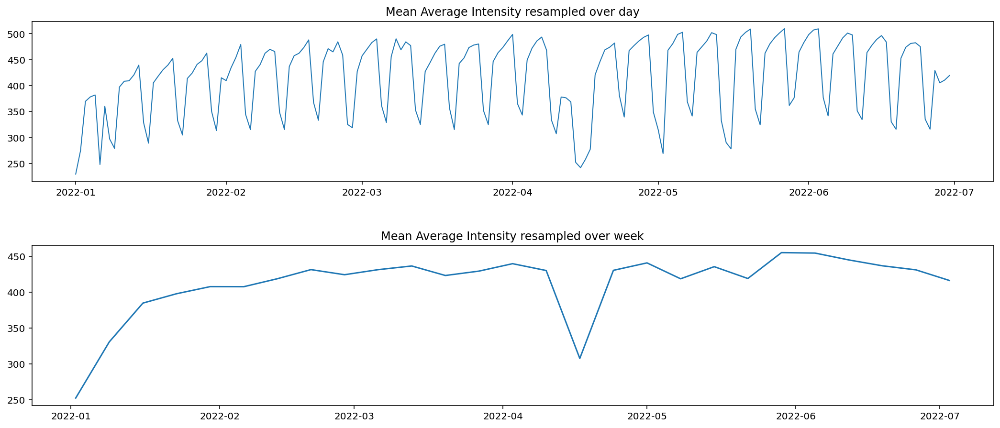

In [ ]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(4,1,1)
ax1.plot(df_ts_indexed['Avg_Intensity'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Average Intensity resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(4,1,2)
ax2.plot(df_ts_indexed['Avg_Intensity'].resample('W').mean())
ax2.set_title('Mean Average Intensity resampled over week')
# ax2.tick_params(axis='both', which='major')

In [ ]:
import calendar
import warnings
warnings.filterwarnings("ignore")

ts_trafficMAD_urb_2022_dist_3['timestamp']=pd.to_datetime(ts_trafficMAD_urb_2022_dist_3['timestamp']) 
# df_trafficMAD_ts_urb_11['year'] = df['date_time'].apply(lambda x: x.year)
ts_trafficMAD_urb_2022_dist_3['quarter'] = ts_trafficMAD_urb_2022_dist_3['timestamp'].apply(lambda x: x.quarter)
ts_trafficMAD_urb_2022_dist_3['month'] = ts_trafficMAD_urb_2022_dist_3['timestamp'].apply(lambda x: x.month)
ts_trafficMAD_urb_2022_dist_3['day'] = ts_trafficMAD_urb_2022_dist_3['timestamp'].apply(lambda x: x.day)
ts_trafficMAD_urb_2022_dist_3['hour'] = ts_trafficMAD_urb_2022_dist_3['timestamp'].apply(lambda x: x.hour)
df_trafficMAD_ts_urb_3=ts_trafficMAD_urb_2022_dist_3.loc[:,['timestamp','Avg_Intensity','quarter','month','day','hour']]
df_trafficMAD_ts_urb_3.sort_values('timestamp', inplace=True, ascending=True)
new_df_trafficMAD_ts_urb_3 = df_trafficMAD_ts_urb_3.reset_index(drop=True)

new_df_trafficMAD_ts_urb_3["weekday"]=new_df_trafficMAD_ts_urb_3.apply(lambda row: row["timestamp"].weekday(),axis=1)
new_df_trafficMAD_ts_urb_3["weekday_weekend_flg"] = (new_df_trafficMAD_ts_urb_3["weekday"] < 5).astype(int)
new_df_trafficMAD_ts_urb_3["day_name"] = new_df_trafficMAD_ts_urb_3.apply(lambda row: row["timestamp"].day_name(),axis=1)

print('Number of rows and columns:', new_df_trafficMAD_ts_urb_3.shape)
print('The time series starts from: ', new_df_trafficMAD_ts_urb_3.timestamp.min())
print('The time series ends on: ', new_df_trafficMAD_ts_urb_3.timestamp.max())

Number of rows and columns: (17376, 9)
The time series starts from:  2022-01-01 00:00:00
The time series ends on:  2022-06-30 23:45:00


In [ ]:
new_df_trafficMAD_ts_urb_3.head()

,timestamp,Avg_Intensity,quarter,month,day,hour,weekday,weekday_weekend_flg,day_name
0,2022-01-01 00:00:00,73.417476,1,1,1,0,5,0,Saturday
1,2022-01-01 00:15:00,68.145631,1,1,1,0,5,0,Saturday
2,2022-01-01 00:30:00,138.206612,1,1,1,0,5,0,Saturday
3,2022-01-01 00:45:00,244.925620,1,1,1,0,5,0,Saturday
4,2022-01-01 01:00:00,292.844262,1,1,1,1,5,0,Saturday


In [ ]:
x = new_df_trafficMAD_ts_urb_3[new_df_trafficMAD_ts_urb_3['month']==2]
x.to_csv()

,timestamp,Avg_Intensity,quarter,month,day,hour,weekday,weekday_weekend_flg,day_name
2976,2022-02-01 00:00:00,152.672269,1,2,1,0,1,1,Tuesday
2977,2022-02-01 00:15:00,139.940171,1,2,1,0,1,1,Tuesday
2978,2022-02-01 00:30:00,110.181034,1,2,1,0,1,1,Tuesday
2979,2022-02-01 00:45:00,91.956140,1,2,1,0,1,1,Tuesday
2980,2022-02-01 01:00:00,74.594828,1,2,1,1,1,1,Tuesday
...,...,...,...,...,...,...,...,...,...
5659,2022-02-28 22:45:00,239.793388,1,2,28,22,0,1,Monday
5660,2022-02-28 23:00:00,208.260504,1,2,28,23,0,1,Monday
5661,2022-02-28 23:15:00,213.241667,1,2,28,23,0,1,Monday
5662,2022-02-28 23:30:00,214.791667,1,2,28,23,0,1,Monday


In [ ]:
# importing the required module
import matplotlib.pyplot as plt
import plotly.express as px
plt.rcParams["figure.figsize"] = (15,10)

fig = px.line(new_df_trafficMAD_ts_urb_3, x='timestamp', y="Avg_Intensity",
              title='The evaluation of Traffic Intensity of District 3',hover_data=["day_name"],
              labels=dict(timestamp="Date", Avg_Intensity="Traffic Intensity"))

fig.update_layout(title_text='District-3 Traffic Intensity at 15-minute intervals', title_x=0.5, hovermode="x unified")

fig.show()

In [ ]:
new_df_trafficMAD_ts_urb_3.groupby('month').Avg_Intensity.agg('mean')

month
1    372.905914
2    420.740069
3    434.809756
4    404.965689
5    430.785903
6    436.069120
Name: Avg_Intensity, dtype: float64

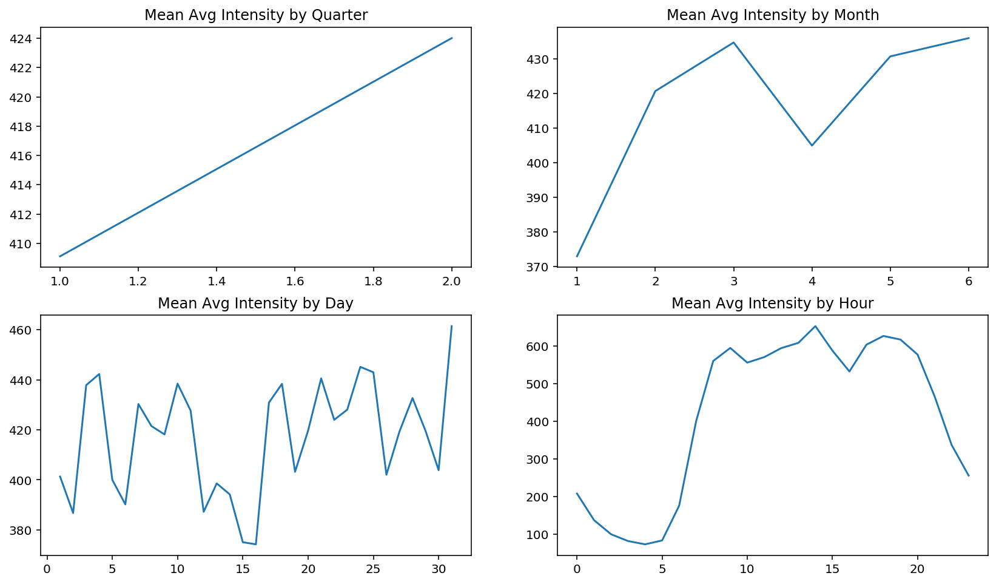

In [ ]:
plt.figure(figsize=(14,8))
# plt.subplot(2,2,1)
# df.groupby('year').Global_active_power.agg('mean').plot()
# plt.xlabel('')
# plt.title('Mean Global active power by Year')

plt.subplot(2,2,1)
new_df_trafficMAD_ts_urb_3.groupby('quarter').Avg_Intensity.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Avg Intensity by Quarter')

plt.subplot(2,2,2)
new_df_trafficMAD_ts_urb_3.groupby('month').Avg_Intensity.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Avg Intensity by Month')

plt.subplot(2,2,3)
new_df_trafficMAD_ts_urb_3.groupby('day').Avg_Intensity.agg('mean').plot()
plt.xlabel('')
plt.title('Mean Avg Intensity by Day')

plt.subplot(2,2,4)
new_df_trafficMAD_ts_urb_3.groupby('hour').Avg_Intensity.agg('mean').plot()

plt.xlabel('')
plt.title('Mean Avg Intensity by Hour');

# Analyzing the Sensors by Grouping their elem type:

First the full frequency:

In [ ]:
from pyspark.sql.functions import *
traffic_MAD = df_traffic_minute.withColumn('date', to_date('timestamp')).\
                        withColumn('hour', hour('timestamp')).\
                        withColumn('minute', minute('timestamp'))

# traffic_elem_type = df1.groupBy("date",'hour','minute', "elem_type").agg(avg("intensity"),avg('vmed'))

In [ ]:
from pyspark.sql.functions import *
traffic_day_elem_type = traffic_MAD.groupBy("date", "elem_type").agg(avg("intensity"),avg('vmed'))
df_traffic_day_elem_type = traffic_day_elem_type.toPandas()
df_traffic_day_elem_type.head(5)

,date,elem_type,avg(intensity),avg(vmed)
0,2022-06-03,M30,1299.234750,53.292667
1,2022-06-09,M30,1439.520000,56.160000
2,2022-06-29,URB,278.351133,0.000000
3,2022-06-01,M30,1252.795000,52.536167
4,2022-06-09,URB,334.272810,0.000000


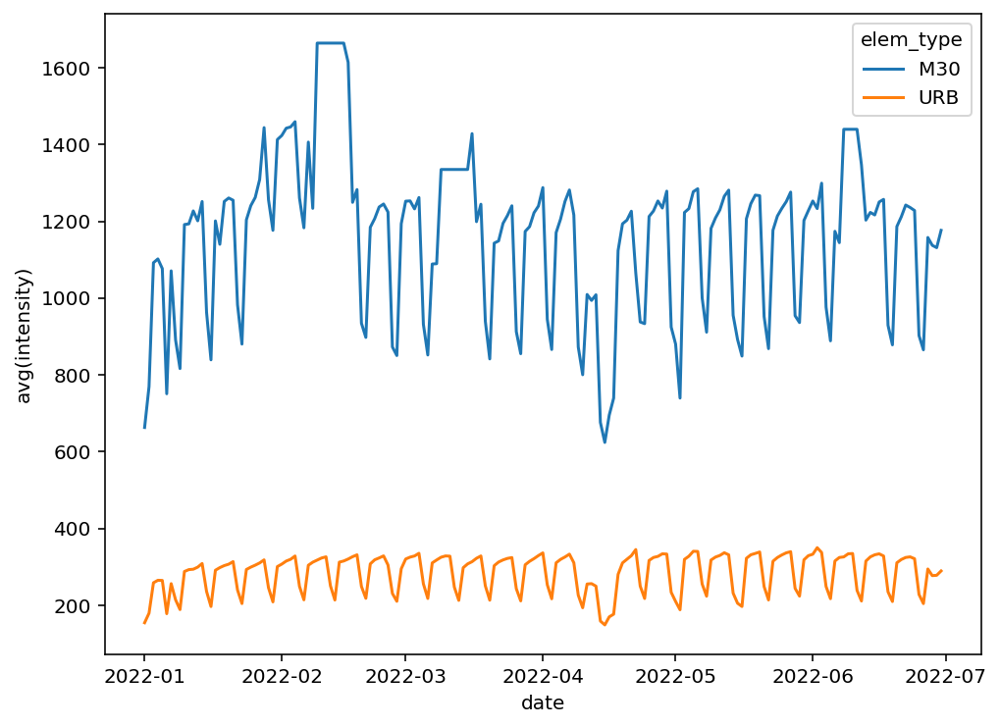

In [ ]:
sns.lineplot(x = "date", y = "avg(intensity)", hue = "elem_type", data = df_traffic_day_elem_type)

In [ ]:
traffic_hour_elem_type = df_traffic_minute.groupBy('elem_type',hour("timestamp").alias("hour")).agg(mean("intensity").alias("avg_intensity"))

In [ ]:
df_traffic_hour_elem_type = traffic_hour_elem_type.toPandas()
df_traffic_hour_elem_type.head(5)


,elem_type,hour,avg_intensity
0,URB,21,325.217874
1,M30,16,1521.955380
2,URB,3,53.377849
3,URB,9,403.420978
4,URB,12,393.639733


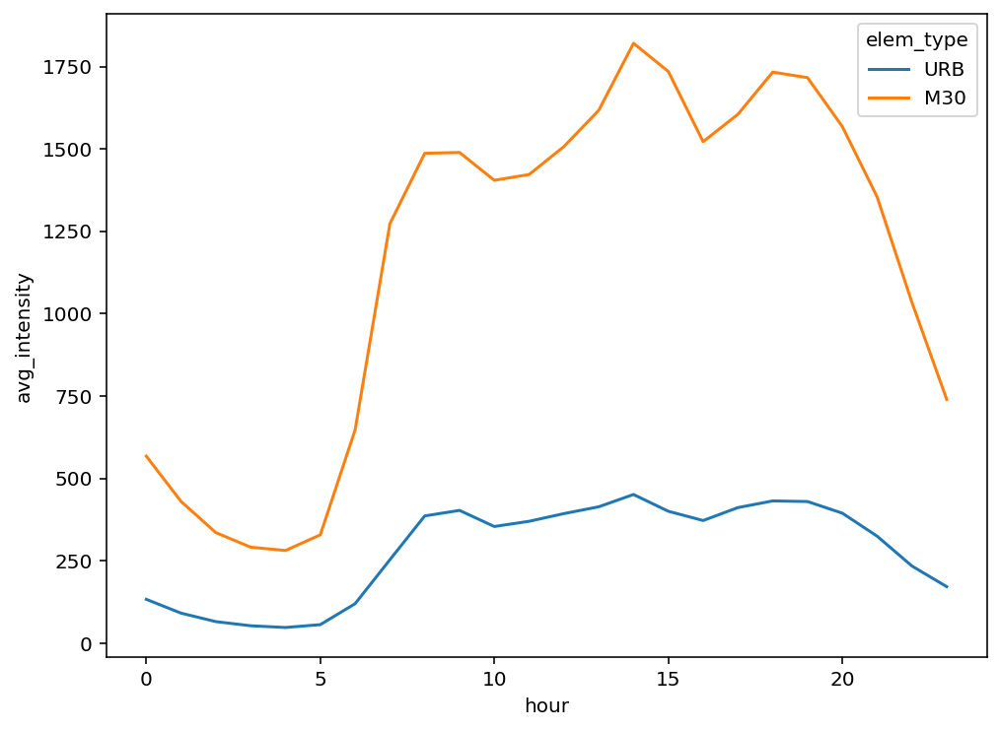

In [ ]:
sns.lineplot(x = "hour", y = "avg_intensity", hue = "elem_type", data = df_traffic_hour_elem_type)

## M30 roads data analysis

In [ ]:
df_traffic_minute_M30 = df_traffic_minute.filter("elem_type='M30'")
df_traffic_minute_M30.count()

8083108

In [ ]:
from pyspark.sql.functions import hour, mean

df_traffic_hour_M30 = df_traffic_minute_M30.groupBy(hour("fecha").alias("hour")).agg(mean("intensidad").alias("mean"))
df_traffic_hour_M30.show(5)


+----+------------------+
|hour|              mean|
+----+------------------+
|  12|1628.6959641575781|
|  22| 1062.559920155673|
|   1| 401.2309858493198|
|  13| 1753.255698127213|
|   6|  678.080200974763|
+----+------------------+
only showing top 5 rows



Null and Missing Values:

In [ ]:
df_avg_intensity = df_traffic_minute.groupBy('id','fecha').agg(mean('intensidad').alias("Average Intensity"))
df_avg_intensity.show(5)

+----+------------------+
|  id| Average Intensity|
+----+------------------+
|3749|179.32827672269235|
|3794|57.309166254799834|
|3918|258.97066777615976|
|3997|217.13766115789105|
|4101|329.74175227009783|
+----+------------------+
only showing top 5 rows



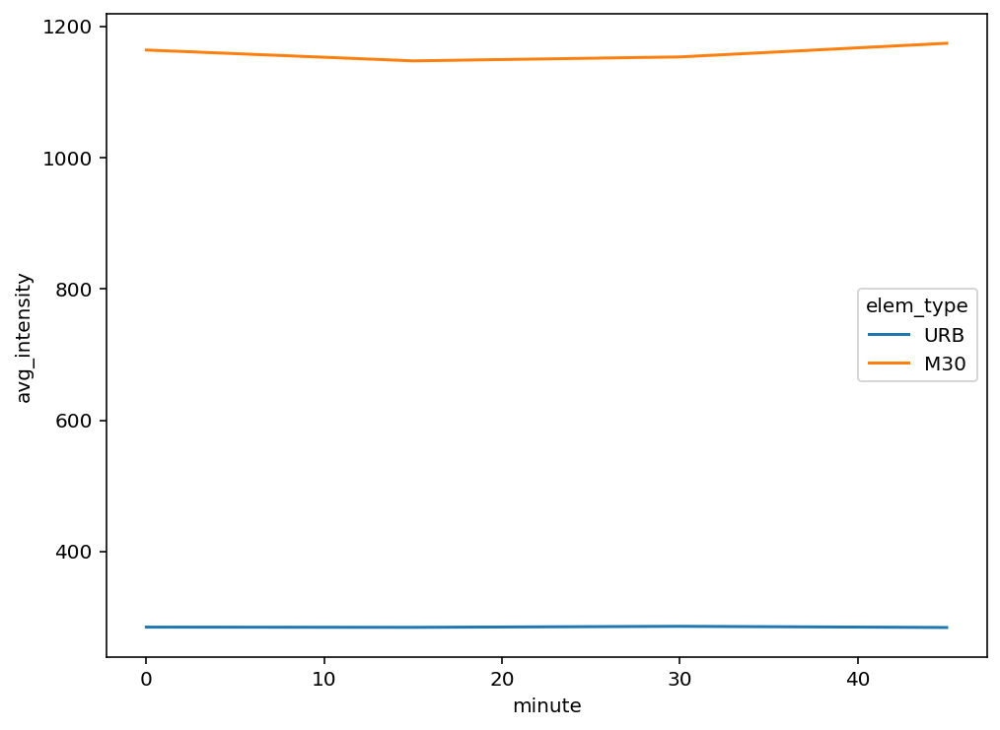

In [ ]:
sns.lineplot(x = "minute", y = "avg_intensity", hue = "elem_type", data = df_traffic_minute_elem_type)

# Monthly vs Daily vs Day of week vs Hourly Traffic Intensity

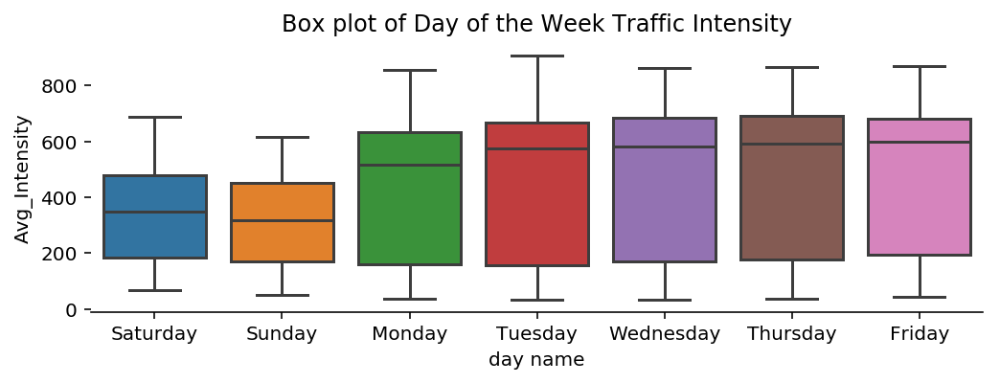

In [ ]:
plt.figure(figsize=(14,5))
# # monthly
# plt.subplot(2,2,1)
# plt.subplots_adjust(wspace=0.2)
# sns.boxplot(x="month", y="Avg_Intensity", data=new_df_trafficMAD_ts_urb_3)
# plt.xlabel('month')
# plt.title('Box plot of Monthly Traffic Intensity')
# sns.despine(left=True)
# plt.tight_layout()

# #Daily
# plt.subplot(2,2,2)
# sns.boxplot(x="day", y="Avg_Intensity", data=new_df_trafficMAD_ts_urb_3)
# plt.xlabel('day')
# plt.title('Box plot of Daily Traffic Intensity')
# sns.despine(left=True)
# plt.tight_layout()

# #Hourly
# plt.subplot(2,2,3)
# sns.boxplot(x="hour", y="Avg_Intensity", data=new_df_trafficMAD_ts_urb_3)
# plt.xlabel('hour')
# plt.title('Box plot of Hourly Traffic Intensity')
# sns.despine(left=True)
# plt.tight_layout()

#Week of the day
plt.subplot(2,2,1)
sns.boxplot(x="day_name", y="Avg_Intensity", data=new_df_trafficMAD_ts_urb_3)
plt.xlabel('day name')
plt.title('Box plot of Day of the Week Traffic Intensity')
sns.despine(left=True)
plt.tight_layout()

# plt.subplot(2,2,2)
# dic={0:'Weekend',1:'Weekday'}
# new_df_trafficMAD_ts_urb_3['Day'] = new_df_trafficMAD_ts_urb_3.weekday_weekend_flg.map(dic)
# a=plt.figure(figsize=(9,4)) 
# plt1=sns.boxplot('month','Avg_Intensity',hue='Day',width=0.6,fliersize=3,
#                     data=new_df_trafficMAD_ts_urb_3)                                                                                                                                                                                                                                                                                                                                                 
# a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
# sns.despine(left=True, bottom=True)
# plt.xlabel('')
# plt.tight_layout()                                                                                                                  
# plt.legend().set_visible(False);

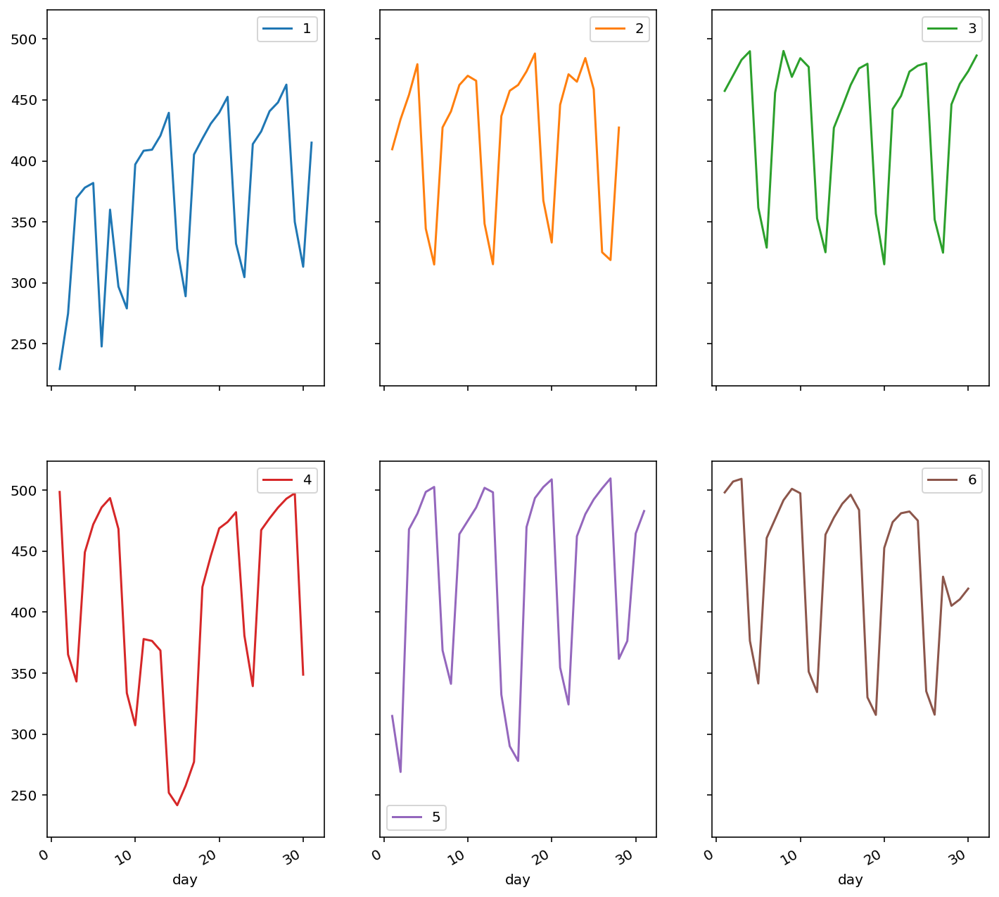

In [ ]:
pd.pivot_table(new_df_trafficMAD_ts_urb_3, values = "Avg_Intensity", 
               columns = "month", index="day").plot(subplots = True, figsize=(12, 12), layout=(2, 3), sharey=True);

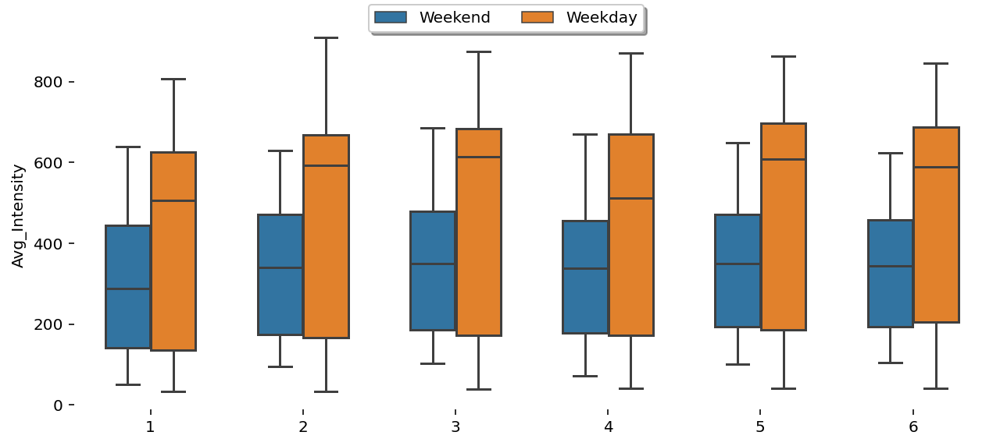

In [ ]:
dic={0:'Weekend',1:'Weekday'}
new_df_trafficMAD_ts_urb_3['Day'] = new_df_trafficMAD_ts_urb_3.weekday_weekend_flg.map(dic)
a=plt.figure(figsize=(9,4)) 
plt1=sns.boxplot('month','Avg_Intensity',hue='Day',width=0.6,fliersize=3,
                    data=new_df_trafficMAD_ts_urb_3)                                                                                                                                                                                                                                                                                                                                                 
a.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
sns.despine(left=True, bottom=True)
plt.xlabel('')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False);

# Prediction with basic LSTM:

In [ ]:
len(df_ts_indexed)-96*30

14496

In [ ]:
train = df_ts_indexed.iloc[:14496]
# val = df_ts_indexed.iloc[11616:14496]
test = df_ts_indexed.iloc[14496:]

In [ ]:
len(train) + len(test) == len(df_ts_indexed) # + len(val)

True

Scaling the intensity values between 0 and 1:

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

#checking the head and tail of the data 
# new_df_trafficMAD_ts_urb_3.head(4),new_df_trafficMAD_ts_urb_3.tail(4)

scaler.fit(train)
scaled_train = scaler.transform(train)
# scaled_val = scaler.transform(val)
scaled_test = scaler.transform(test)

In [ ]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

n_input_length =  342
n_features = 1
generator_train = TimeseriesGenerator(scaled_train,scaled_train, length=n_input_length, batch_size=1)

X,y = generator_train[0]
print(X.flatten())
print(y)
print("------------------")
X,y = generator_train[1]
print(X.flatten())
print(y)

# n_input_length = 30
# n_features = 1
# generator_val = TimeseriesGenerator(scaled_val,scaled_val, length=n_input_length, batch_size=1)

[0.04533503 0.03930688 0.11941886 0.24144787 0.29624096 0.33743366
 0.36460143 0.35713586 0.31853844 0.28689335 0.24344184 0.2008543
 0.17015639 0.14249598 0.13525832 0.10191441 0.0888809  0.08618424
 0.07910383 0.0780278  0.07280462 0.05790656 0.06005494 0.07257673
 0.06550837 0.08324811 0.09359517 0.10285438 0.09214655 0.09738959
 0.1060875  0.12860395 0.09739968 0.09366487 0.07619044 0.07857069
 0.0842446  0.07912136 0.09050888 0.08822269 0.10392365 0.10122355
 0.11070194 0.12002367 0.14002006 0.14130527 0.16912935 0.17748966
 0.20562637 0.2227033  0.24238583 0.26251823 0.29227633 0.3161203
 0.34449125 0.36897256 0.37309652 0.39089514 0.37469413 0.35024605
 0.30020558 0.25677281 0.21770924 0.19287022 0.18096699 0.18794022
 0.21190604 0.25672595 0.29119848 0.30222069 0.33569973 0.36034037
 0.36512041 0.39981789 0.42218098 0.44350371 0.47028131 0.4950438
 0.48623353 0.47088116 0.45429161 0.4237837  0.40744721 0.40006157
 0.35784725 0.32756428 0.31744184 0.27711142 0.26652972 0.2448133

In [ ]:
X.shape

(7, 96, 1)

In [ ]:
input_shape = (n_input_length,n_features)
lstm_model = tf.keras.Sequential([

    tf.keras.layers.LSTM(100, activation='relu', input_shape=input_shape),
    tf.keras.layers.Dense(1)

])


lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 100)               40800     
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 101       
Total params: 40,901
Trainable params: 40,901
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# early stopping callback, the validation loss for 10 epochs
early_stop_param = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                   mode='min',
                                   patience=20, 
                                   restore_best_weights=True)

start = time()

epoches = lstm_model.fit( generator_train,
                    # validation_data=generator_val,
                    # validation_split=0.2,
                    # callbacks=[early_stop_param],
                    epochs=10, 
                    # batch_size=20,
                    shuffle=False, # because it is daily data
                    verbose=1)

end = time()

time_lstm = end- start
print('Time consumed while training the model: ', time_lstm)

Epoch 1/10
2058/2058 [==============================] - 119s 58ms/step - loss: 0.0074
Epoch 2/10
2058/2058 [==============================] - 124s 60ms/step - loss: 0.0015
Epoch 3/10
2058/2058 [==============================] - 126s 61ms/step - loss: 0.0010
Epoch 4/10
  17/2058 [..............................] - ETA: 1:55 - loss: 6.0881e-04

KeyboardInterrupt: ignored

Loss evaluation by Epoch
Last Epoch Training Loss: 0.0007177100051194429


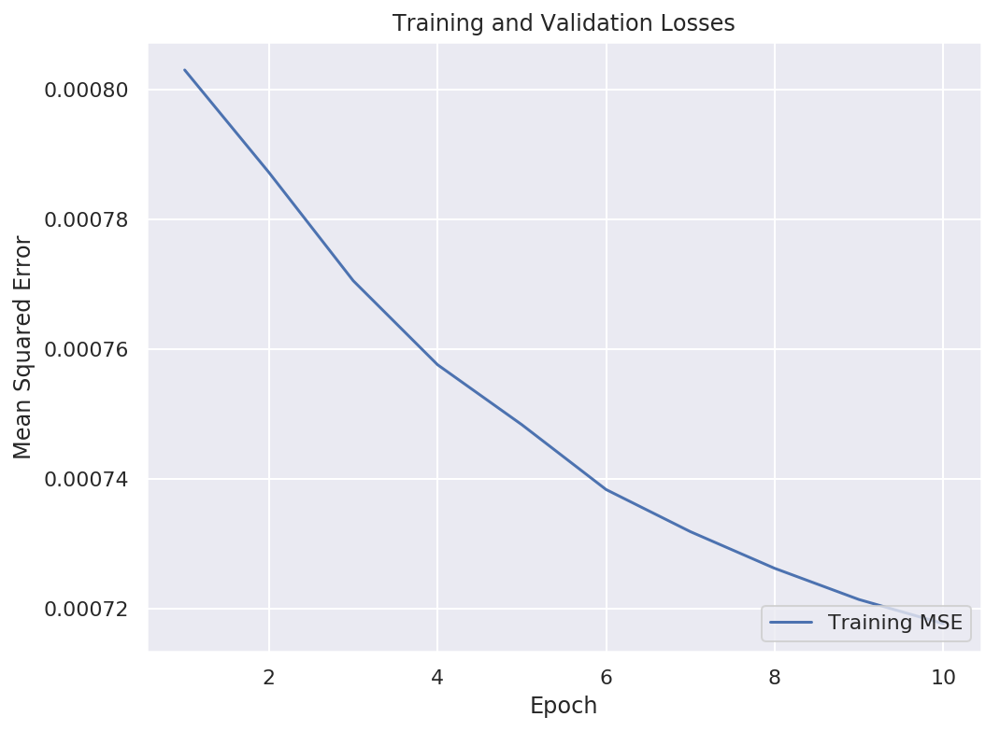

In [ ]:
print('Loss evaluation by Epoch')
sns.set() 
train = epoches.history['loss']
# val = epoches.history['val_loss']
epochs = range(1, len(train) + 1)
 
plt.plot(epochs, train, '-', label='Training MSE')
# plt.plot(epochs, val, ':', label='Validation MSE')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc='lower right')
plt.plot()

print("Last Epoch Training Loss: {}".format(train[-1]))
# print("Last Epoch Validation Loss: {}".format(val[-1]))

In [ ]:
last_train_batch = scaled_train[-n_input_length:]
last_train_batch = last_train_batch.reshape((1,n_input_length,n_features))
print(last_train_batch.shape)
pred_value = lstm_model.predict(last_train_batch)[0]
print(pred_value)

second_batch = np.append(last_train_batch[:,1:,:], [[pred_value]],axis=1)
pred_value = lstm_model.predict(second_batch)[0]
print(pred_value)


(1, 4, 1)
[0.19936183]
[0.17782909]


In [ ]:
scaled_test[0]

array([0.20870203])

In [ ]:
test_predictions = []

first_eval_batch = scaled_train[-n_input_length:]
current_batch = first_eval_batch.reshape((1,n_input_length,n_features)) #batch size=1

for i in range(len(test)):
  # print(i)
  #get the prediction value for the first batch
  current_pred = lstm_model.predict(current_batch)[0]
  test_predictions.append(current_pred)
  current_batch = np.append(current_batch[:,1:,:], [[current_pred]],axis=1) #current_batch bi array, o arraying ilk elementini prediction değeriyle 


Changing the intensity values back to its normal scale

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


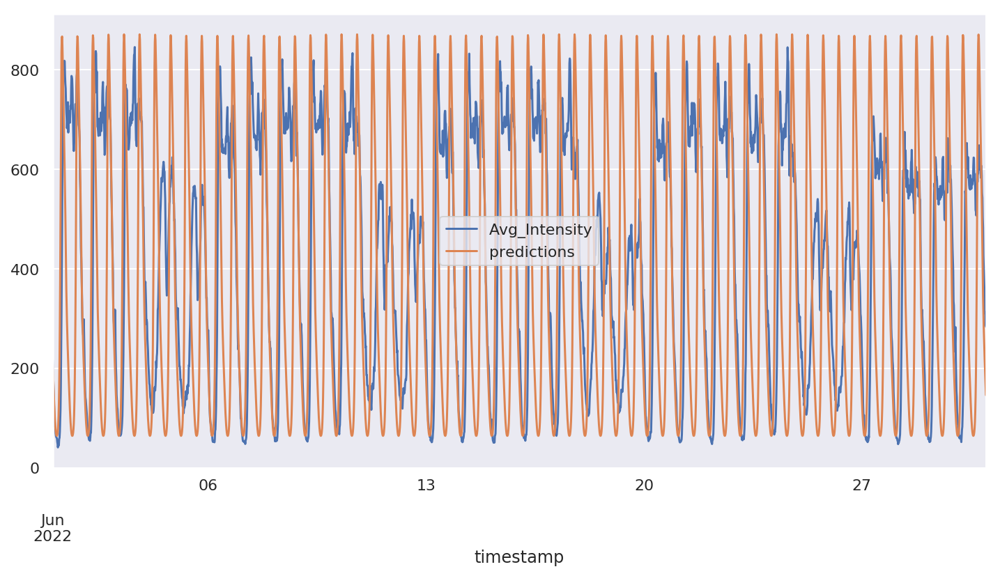

In [ ]:
true_predictions = scaler.inverse_transform(test_predictions)
test['predictions'] = true_predictions
test.plot(figsize=(12,6))


In [ ]:
mse_value = mean_squared_error(test['Avg_Intensity'],test['predictions'])
rmse = sqrt(mse_value)

print('MSE: ', mse_value)
print('RMSE: ', rmse)

MSE:  112486.688705448
RMSE:  335.3903527316312


# Predicting with seacat automl

In [ ]:
%%capture
!pip install scalecast --upgrade
from scalecast.Forecaster import Forecaster

In [ ]:
f = Forecaster(y=df_ts_indexed['Avg_Intensity'],
                   current_dates=df_ts_indexed.index)
f

Forecaster(
    DateStartActuals=2022-01-01T00:00:00.000000000
    DateEndActuals=2022-06-30T23:45:00.000000000
    Freq=15T
    N_actuals=17376
    ForecastLength=0
    Xvars=[]
    Differenced=0
    TestLength=1
    ValidationLength=1
    ValidationMetric=rmse
    ForecastsEvaluated=[]
    CILevel=0.95
    BootstrapSamples=100
    CurrentEstimator=None
    GridsFile=Grids
)

In [ ]:
f.set_test_length(2880)       # 1. 12 observations to test the results
f.generate_future_dates(2880) # 2. 12 future points to forecast
f.set_estimator('lstm')     # 3. LSTM neural network

453/453 [==============================] - 4s 4ms/step - loss: 0.2892


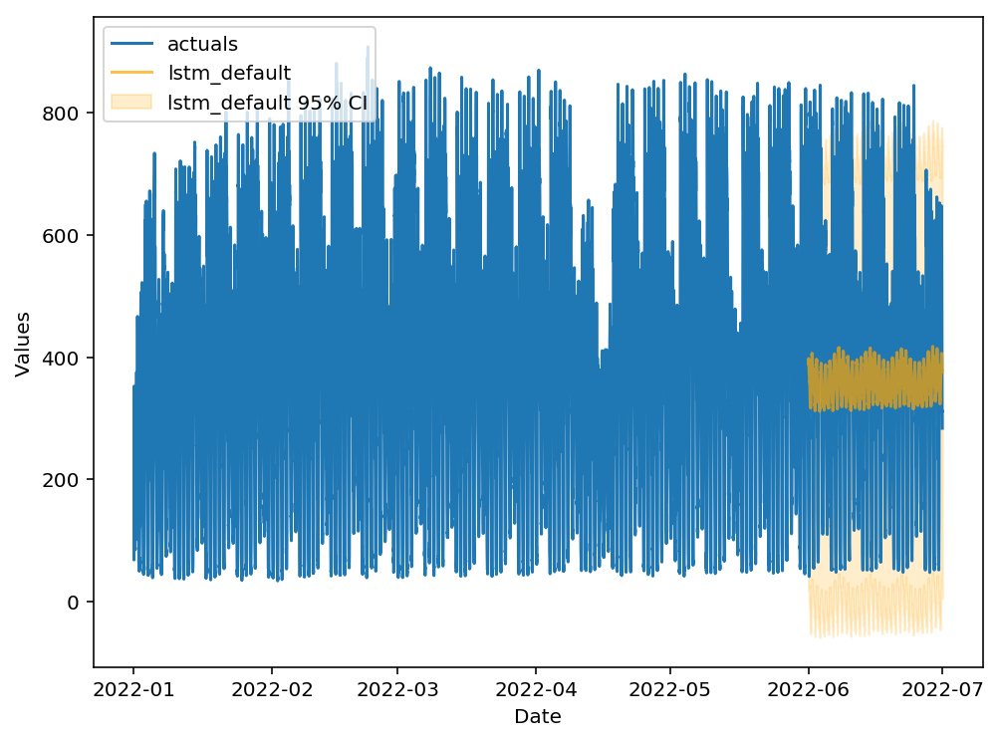

In [ ]:
f.manual_forecast(call_me='lstm_default')
f.plot_test_set(ci=True)

Epoch 1/5
290/290 [==============================] - 6s 15ms/step - loss: 0.2625 - val_loss: 0.1970
Epoch 2/5
290/290 [==============================] - 4s 13ms/step - loss: 0.1970 - val_loss: 0.1743
Epoch 3/5
290/290 [==============================] - 4s 13ms/step - loss: 0.1678 - val_loss: 0.1525
Epoch 4/5
290/290 [==============================] - 4s 13ms/step - loss: 0.1583 - val_loss: 0.1466
Epoch 5/5
290/290 [==============================] - 4s 13ms/step - loss: 0.1553 - val_loss: 0.1445
Epoch 1/5
362/362 [==============================] - 7s 15ms/step - loss: 0.2688 - val_loss: 0.2075
Epoch 2/5
362/362 [==============================] - 5s 13ms/step - loss: 0.1912 - val_loss: 0.1535
Epoch 3/5
362/362 [==============================] - 5s 14ms/step - loss: 0.1610 - val_loss: 0.1478
Epoch 4/5
362/362 [==============================] - 5s 13ms/step - loss: 0.1573 - val_loss: 0.1469
Epoch 5/5
362/362 [==============================] - 5s 13ms/step - loss: 0.1535 - val_loss: 0.1426


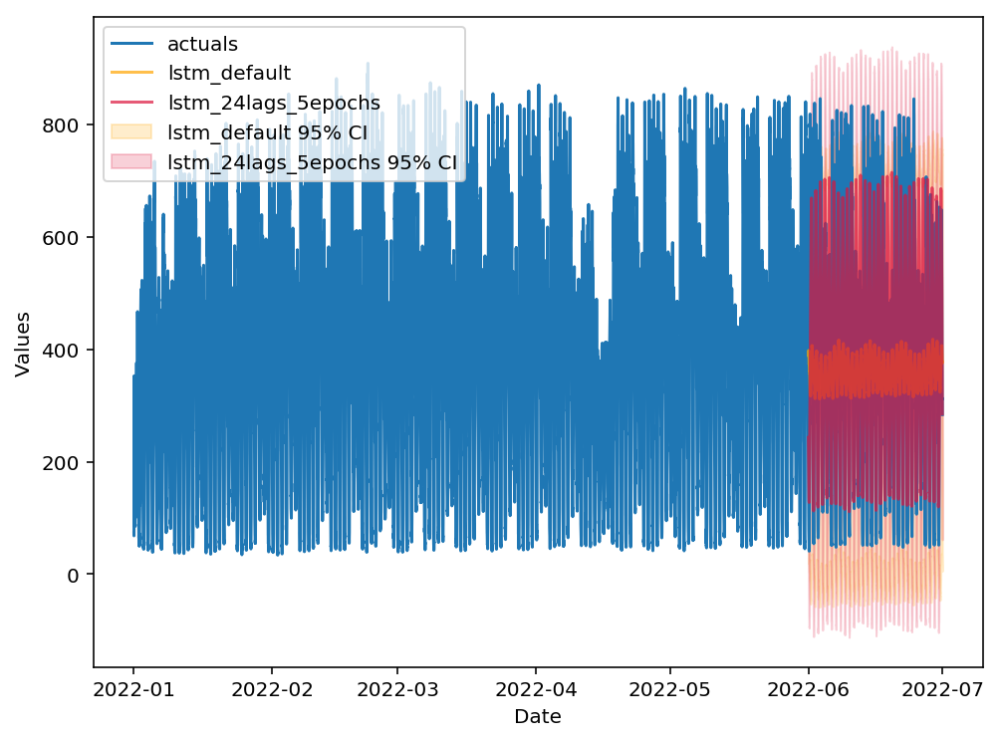

In [ ]:
f.manual_forecast(call_me='lstm_24lags_5epochs',
                  lags=24,
                  epochs=5,
                  validation_split=.2,
                  shuffle=True)
f.plot_test_set(ci=True)

# Predicting with fedot automl

In [ ]:
!pip install fedot==0.3.0

# FEDOT api
from fedot.api.main import Fedot
# Tasks to solve
from fedot.core.repository.tasks import Task, TaskTypesEnum, TsForecastingParams
# Input data for fit and predict
from fedot.core.data.data import InputData
# Train and test split
from fedot.core.data.data import train_test_data_setup

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached tensorflow-2.2.0-cp37-cp37m-manylinux2010_x86_64.whl (516.2 MB)
  Using cached h5py-2.10.0-cp37-cp37m-manylinux1_x86_64.whl (2.9 MB)
  Using cached tensorboard-2.2.2-py3-none-any.whl (3.0 MB)
  Using cached tensorflow_estimator-2.2.0-py2.py3-none-any.whl (454 kB)
  Using cached gast-0.3.3-py2.py3-none-any.whl (9.7 kB)
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.5.0
    Uninstalling tensorflow-estimator-2.5.0:
      Successfully uninstalled tensorflow-estimator-2.5.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
  Attempting uninstall: gast
    Found exi

In [ ]:
df_ts_indexed.to_csv('/content/drive/MyDrive/THESIS/Producing_15_mins/trafficMAD_urb_dist_3.csv',index=True,header=True)

In [ ]:
forecast_length = 2880
task = Task(TaskTypesEnum.ts_forecasting,
            TsForecastingParams(forecast_length=forecast_length))

# Load data from csv file and wrap it into InputData structure
input_data = InputData.from_csv_time_series(task, '/content/drive/MyDrive/THESIS/Producing_15_mins/trafficMAD_urb_dist_3.csv', target_column='Avg_Intensity')
# Divide into train and test
train_data, test_data = train_test_data_setup(input_data)

In [ ]:
input_data

InputData(idx=array([    0,     1,     2, ..., 17373, 17374, 17375]), features=array([ 73.41747573,  68.14563107, 138.20661157, ..., 313.        ,
       287.52542373, 283.58974359]), task=Task(task_type=<TaskTypesEnum.ts_forecasting: 'ts_forecasting'>, task_params=TsForecastingParams(forecast_length=2880)), data_type=<DataTypesEnum.ts: 'time_series'>, target=array([ 73.41747573,  68.14563107, 138.20661157, ..., 313.        ,
       287.52542373, 283.58974359]))

In [ ]:
# Init model for the time series forecasting
model = Fedot(problem='ts_forecasting',task_params=task.task_params)
# Run AutoML model design
chain = model.fit(features=train_data)
# Use model to obtain forecast
forecast = model.predict(features=test_data)

Composition started. Parameters tuning: True. Set of candidate models: ['linear', 'lasso', 'ridge', 'xgbreg', 'adareg', 'gbr', 'dtreg', 'treg', 'rfr', 'svr', 'sgdr', 'ar', 'scaling', 'normalization', 'simple_imputation', 'pca', 'poly_features', 'ransac_lin_reg', 'ransac_non_lin_reg', 'rfe_lin_reg', 'rfe_non_lin_reg', 'lagged', 'smoothing', 'gaussian_filter']. Composing time limit: 2 min


INFO:FEDOT logger:Composition started. Parameters tuning: True. Set of candidate models: ['linear', 'lasso', 'ridge', 'xgbreg', 'adareg', 'gbr', 'dtreg', 'treg', 'rfr', 'svr', 'sgdr', 'ar', 'scaling', 'normalization', 'simple_imputation', 'pca', 'poly_features', 'ransac_lin_reg', 'ransac_non_lin_reg', 'rfe_lin_reg', 'rfe_non_lin_reg', 'lagged', 'smoothing', 'gaussian_filter']. Composing time limit: 2 min


Model composition started


INFO:FEDOT logger:Model composition started


Hyperparameters tuning started


INFO:FEDOT logger:Hyperparameters tuning started


Default loss function was set


INFO:FEDOT logger:Default loss function was set


Hyperparameters optimization start


INFO:fedot.core.chains.tuning.tuner_interface:Hyperparameters optimization start


  0%|          | 1/1000 [05:05<84:42:42, 305.27s/trial, best loss: 99.29186168167418]
Hyperparameters optimization finished


INFO:fedot.core.chains.tuning.tuner_interface:Hyperparameters optimization finished


Return tuned chain due to the fact that obtained metric 99.292 equal or smaller than initial (+ 5% deviation) 185.813


INFO:fedot.core.chains.tuning.tuner_interface:Return tuned chain due to the fact that obtained metric 99.292 equal or smaller than initial (+ 5% deviation) 185.813


Model composition finished


INFO:FEDOT logger:Model composition finished


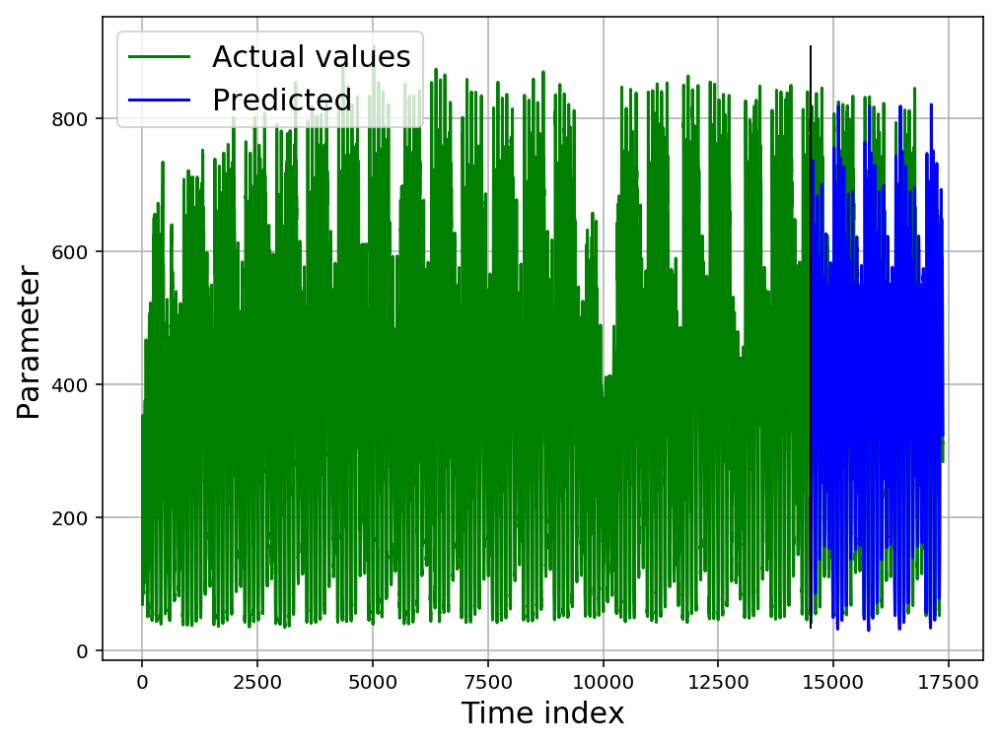

In [ ]:
# Plot the graph
# Let's prepare a function for visualizing forecasts
def plot_results(actual_time_series, predicted_values, len_train_data, y_name = 'Parameter'):
    """
    Function for drawing plot with predictions
    
    :param actual_time_series: the entire array with one-dimensional data
    :param predicted_values: array with predicted values
    :param len_train_data: number of elements in the training sample
    :param y_name: name of the y axis
    """
    
    plt.plot(np.arange(0, len(actual_time_series)), 
             actual_time_series, label = 'Actual values', c = 'green')
    plt.plot(np.arange(len_train_data, len_train_data + len(predicted_values)), 
             predicted_values, label = 'Predicted', c = 'blue')
    # Plot black line which divide our array into train and test
    plt.plot([len_train_data, len_train_data],
             [min(actual_time_series), max(actual_time_series)], c = 'black', linewidth = 1)
    plt.ylabel(y_name, fontsize = 15)
    plt.xlabel('Time index', fontsize = 15)
    plt.legend(fontsize = 15, loc='upper left')
    plt.grid()
    plt.show()
    
# Got univariate time series as numpy array
time_series = np.array(df_ts_indexed['Avg_Intensity'])
plot_results(actual_time_series = time_series,
             predicted_values = forecast, 
             len_train_data = len(time_series)-forecast_length)

In [ ]:
metrics = model.get_metrics()
print(metrics)
print(model.best_models)
print(model.composer_params)
print(model.current_model)
print(model.task_params)

{'rmse': 94.06507772157809, 'mae': 66.39056138876492}
[{'depth': 2, 'length': 2, 'nodes': [ridge, lagged]}]
{'max_depth': 2, 'max_arity': 3, 'pop_size': 20, 'num_of_generations': 20, 'learning_time': 2, 'available_operations': ['linear', 'lasso', 'ridge', 'xgbreg', 'adareg', 'gbr', 'dtreg', 'treg', 'rfr', 'svr', 'sgdr', 'ar', 'scaling', 'normalization', 'simple_imputation', 'pca', 'poly_features', 'ransac_lin_reg', 'ransac_non_lin_reg', 'rfe_lin_reg', 'rfe_non_lin_reg', 'lagged', 'smoothing', 'gaussian_filter'], 'with_tuning': True}
{'depth': 2, 'length': 2, 'nodes': [ridge, lagged]}
TsForecastingParams(forecast_length=2880)


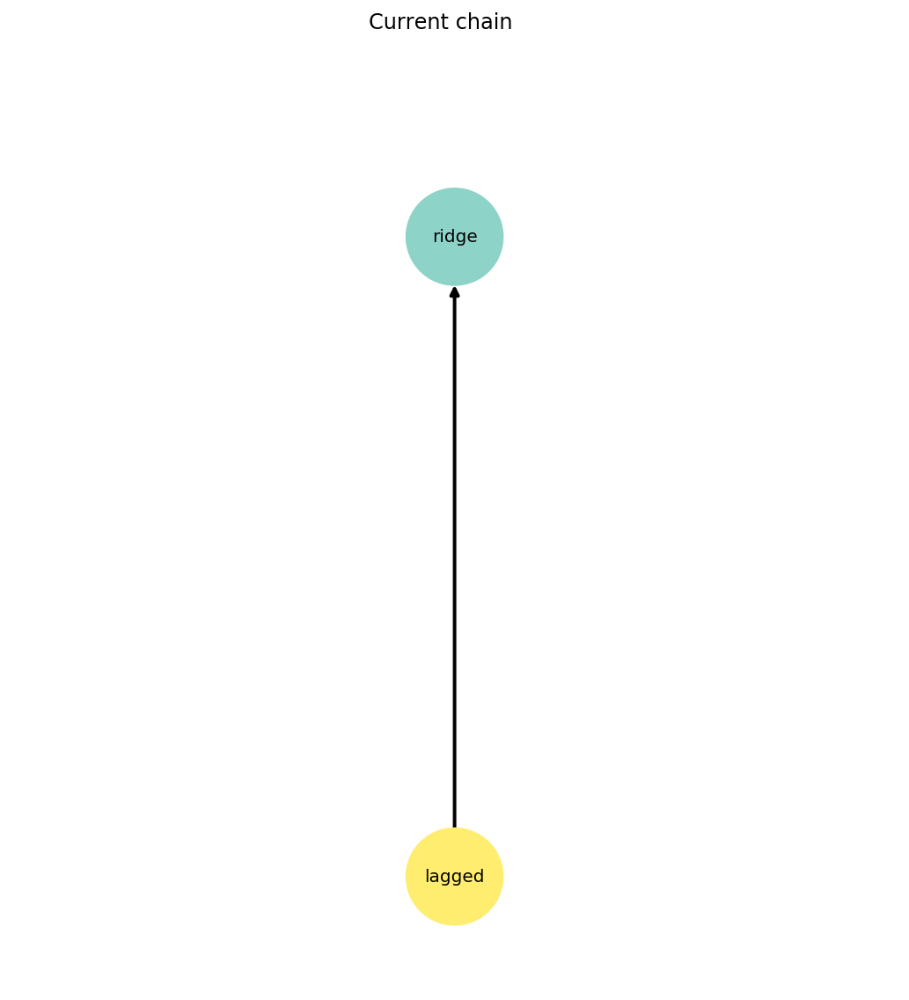

Obtained chain:
ridge, params: {'alpha': 4.751437815177516}
lagged, params: {'window_size': 343.61823444519246}


In [ ]:
chain.show()
 
print('Obtained chain:')
for node in chain.nodes:
    print(f'{node.operation}, params: {node.custom_params}')

# Implementing Paralel input and Multi-step Time Series Forecasting model with CNN-LSTM structure - 1Dimensional

Burada başlangıç olarak 3 ve 5. bölgelerin verisi tahmin edilcek deneme açısından.

In [ ]:
# reading the modified 6 months time series data:
modified_trafficMAD_urb_2022 = pd.read_csv('/content/drive/MyDrive/THESIS/Producing_15_mins/trafficMAD_ts_urb_2022.csv', header=0)
modified_trafficMAD_urb_2022.dtypes

loc_district       int64
timestamp         object
elem_type         object
Avg_Intensity    float64
latitude         float64
longitude        float64
dtype: object

In [ ]:
districts_pivot = pd.pivot_table(modified_trafficMAD_urb_2022, values='Avg_Intensity', index=['timestamp'], columns=['loc_district'])
districts_pivot_3_5 =  districts_pivot[[3, 5]]
districts_pivot_3_5.columns = ['dist-3','dist-5']
districts_pivot_3_5

,dist-3,dist-5
timestamp,,
2022-01-01 00:00:00,73.417476,52.954082
2022-01-01 00:15:00,68.145631,43.487923
2022-01-01 00:30:00,138.206612,105.275986
2022-01-01 00:45:00,244.925620,190.125000
2022-01-01 01:00:00,292.844262,274.770318
...,...,...
2022-06-30 22:45:00,310.299145,251.524306
2022-06-30 23:00:00,310.525424,227.276817
2022-06-30 23:15:00,313.000000,231.682927


In [ ]:
districts_pivot_3_5.reset_index()

,timestamp,dist-3,dist-5
0,2022-01-01 00:00:00,73.417476,52.954082
1,2022-01-01 00:15:00,68.145631,43.487923
2,2022-01-01 00:30:00,138.206612,105.275986
3,2022-01-01 00:45:00,244.925620,190.125000
4,2022-01-01 01:00:00,292.844262,274.770318
...,...,...,...
17371,2022-06-30 22:45:00,310.299145,251.524306
17372,2022-06-30 23:00:00,310.525424,227.276817
17373,2022-06-30 23:15:00,313.000000,231.682927
17374,2022-06-30 23:30:00,287.525424,225.337979


In [ ]:
# importing the required module
import matplotlib.pyplot as plt
import plotly.express as px
plt.rcParams["figure.figsize"] = (15,10)

fig = px.line(districts_pivot_3_5.reset_index(), x='timestamp', y="dist-5",
              title='The evaluation of Traffic Intensity of District 5', 
              labels=dict(timestamp="Date", Avg_Intensity="Traffic Intensity"))

fig.update_layout(title_text='District-5 Traffic Intensity at 15-minute intervals', title_x=0.5, hovermode="x unified")

fig.show()

In [ ]:
import plotly
import plotly.express as px
import plotly.graph_objects as go

districts_pivot_3_5.reset_index(inplace=True)
districts_pivot_3_5['timestamp'] = pd.to_datetime(districts_pivot_3_5['timestamp'])
trace1 = go.Scatter(
 x = districts_pivot_3_5['timestamp'],
 y = districts_pivot_3_5["dist-3"],
 mode = 'lines',
 name = 'district-3'
)
trace2 = go.Scatter(
 x = districts_pivot_3_5['timestamp'],
 y = districts_pivot_3_5["dist-5"],
 mode = 'lines',
 name = 'district-5'
)


layout = go.Layout(
 title = "Traffic Intensity of Districts",
 xaxis = {"title" : "Date"},
 yaxis = {"title" : "Traffic Intensity"}
)
fig = go.Figure(data=[trace1, trace2], layout=layout)
fig.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
from datetime import datetime

train_test_split = datetime.strptime('2022-06-01 00:00:00', '%Y-%m-%d %H:%M:%S')
df_train = districts_pivot_3_5.loc[districts_pivot_3_5['timestamp'] < train_test_split]
df_test = districts_pivot_3_5.loc[districts_pivot_3_5['timestamp'] >= train_test_split]

# normalizing the data between 0 and 1 before training
from sklearn.preprocessing import MinMaxScaler
dist_list = [i for i in districts_pivot_3_5.columns if i != 'timestamp']
scaler = MinMaxScaler()
scaled_train = scaler.fit_transform(df_train[dist_list])
scaled_test = scaler.transform(df_test[dist_list])

In [ ]:
scaled_train.shape, scaled_test.shape

((14496, 2), (2880, 2))

In [ ]:
len(df_train), len(df_test)


(14496, 2880)

In [ ]:
def split_sequence(sequence, look_back, forecast_horizon):
 X, y = list(), list()
 for i in range(len(sequence)): 
   lag_end = i + look_back
   forecast_end = lag_end + forecast_horizon
   if forecast_end > len(sequence):
     break
   seq_x, seq_y = sequence[i:lag_end], sequence[lag_end:forecast_end]
   X.append(seq_x)
   y.append(seq_y)
 return np.array(X), np.array(y)


# Take into consideration last 6 hours, and perform forecasting for next 1 hour
LOOK_BACK = 4*6
FORECAST_RANGE = 4
n_features = len(dist_list)
X_train, y_train = split_sequence(scaled_train, look_back=LOOK_BACK, forecast_horizon=FORECAST_RANGE)
X_test, y_test = split_sequence(scaled_test, look_back=LOOK_BACK, forecast_horizon=FORECAST_RANGE)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(14469, 24, 2)
(14469, 4, 2)
(2853, 24, 2)
(2853, 4, 2)


In [ ]:
X_train[0]

array([[0.04533503, 0.03867882],
       [0.03930688, 0.0280539 ],
       [0.11941886, 0.09740553],
       [0.24144787, 0.19264104],
       [0.29624096, 0.28764792],
       [0.33743366, 0.33545552],
       [0.36460143, 0.35742805],
       [0.35713586, 0.34955141],
       [0.31853844, 0.31013504],
       [0.28689335, 0.25013104],
       [0.24344184, 0.1937943 ],
       [0.2008543 , 0.15386342],
       [0.17015639, 0.1253057 ],
       [0.14249598, 0.09624497],
       [0.13525832, 0.08734157],
       [0.10191441, 0.07786538],
       [0.0888809 , 0.06231303],
       [0.08618424, 0.05462985],
       [0.07910383, 0.04959415],
       [0.0780278 , 0.0521209 ],
       [0.07280462, 0.04538945],
       [0.05790656, 0.04434242],
       [0.06005494, 0.04810187],
       [0.07257673, 0.0472375 ]])

## **BASELINE MODEL BEFORE THE MAIN MODEL TO COMPARE THE PERFORMANCE**

It is always a good idea to have a baseline model to measure the performance of the model relatively. Baseline models are expected to be simple, fast, and repeatable. The most common method to establish a baseline model is the persistence model. It has a very simple working principle, just forecast the next time step as the previous one, in other saying t+1 is the same as t. For multi-step forecasting, it might be adapted forecast t+1, t+2, t+3 as t, entire forecast horizon will be the same.

But here, forecast each time step in the forecast horizon as the mean of the previous same time of the same district.

In [ ]:
import warnings
warnings.filterwarnings("ignore")

# Baseline model before the main model:
dist_3_5 = modified_trafficMAD_urb_2022[modified_trafficMAD_urb_2022['loc_district'].isin([3,5])]
dist_3_5['timestamp'] = pd.to_datetime(dist_3_5['timestamp'])
dist_3_5['hour'] = dist_3_5['timestamp'].apply(lambda x: x.hour)
dist_3_5['minute'] = dist_3_5['timestamp'].apply(lambda x: x.minute)

train_test_split = datetime.strptime('2022-06-01 00:00:00', '%Y-%m-%d %H:%M:%S')
df_train_pers = dist_3_5.loc[dist_3_5['timestamp'] < train_test_split]
df_test_pers =  dist_3_5.loc[dist_3_5['timestamp'] >= train_test_split]

df_cpu_mean = df_train_pers.groupby(['loc_district', 'hour', 'minute']).mean('Avg_Intensity').round(2) ## her saat içindeki dakika bazında ortalama yoğunluk bilgisi her günün o saat 
                                                                                                       ## ve dakikasındaki veri yerine yazılıyor.
df_cpu_mean.reset_index(inplace=True)
df_cpu_mean = df_cpu_mean.rename(columns={"Avg_Intensity": "Avg_Intensity_Pred"})

df_test_pers = df_test_pers.merge(df_cpu_mean, on=['loc_district', 'hour', 'minute'], how="inner")

In [ ]:
df_test_pers

,loc_district,timestamp,elem_type,Avg_Intensity,latitude_x,longitude_x,hour,minute,Avg_Intensity_Pred,latitude_y,longitude_y
0,3,2022-06-01 00:00:00,URB,216.288136,40.411815,-3.676981,0,0,231.63,40.41,-3.68
1,3,2022-06-02 00:00:00,URB,298.316667,40.411740,-3.676947,0,0,231.63,40.41,-3.68
2,3,2022-06-03 00:00:00,URB,317.775000,40.411740,-3.676947,0,0,231.63,40.41,-3.68
3,3,2022-06-04 00:00:00,URB,327.983193,40.411717,-3.676842,0,0,231.63,40.41,-3.68
4,3,2022-06-05 00:00:00,URB,311.873950,40.411717,-3.676842,0,0,231.63,40.41,-3.68
...,...,...,...,...,...,...,...,...,...,...,...
5755,5,2022-06-26 23:45:00,URB,210.250000,40.457290,-3.678036,23,45,180.72,40.46,-3.68
5756,5,2022-06-27 23:45:00,URB,185.948454,40.457484,-3.677969,23,45,180.72,40.46,-3.68
5757,5,2022-06-28 23:45:00,URB,192.941781,40.457338,-3.677961,23,45,180.72,40.46,-3.68
5758,5,2022-06-29 23:45:00,URB,213.293103,40.457502,-3.677882,23,45,180.72,40.46,-3.68


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from math import sqrt

# inversing the data
def inverse_transform(y_test, yhat):
 y_test_reshaped = y_test.reshape(-1, y_test.shape[-1])
 yhat_reshaped = yhat.reshape(-1, yhat.shape[-1])
 yhat_inverse = scaler.inverse_transform(yhat_reshaped)
 y_test_inverse = scaler.inverse_transform(y_test_reshaped)
 return yhat_inverse, y_test_inverse
 
def evaluate_forecast(y_test_inverse, yhat_inverse):
 mse_ = tf.keras.losses.MeanSquaredError()
 mae_ = tf.keras.losses.MeanAbsoluteError()
 mape_ = tf.keras.losses.MeanAbsolutePercentageError()
 mae = mae_(y_test_inverse,yhat_inverse)
 print('mae:', mae)
 mse = mse_(y_test_inverse,yhat_inverse)
 print('mse:', mse)
 rmse = sqrt(mse)
 print('rmse:', rmse)
 mape = mape_(y_test_inverse,yhat_inverse)
 print('mape:', mape)

evaluate_forecast(df_test_pers['Avg_Intensity'], df_test_pers['Avg_Intensity_Pred'])

mae: tf.Tensor(83.17408752441406, shape=(), dtype=float64)
mse: tf.Tensor(12143.4150390625, shape=(), dtype=float64)
rmse: 110.19716438757624
mape: tf.Tensor(26.174209594726562, shape=(), dtype=float64)


## **DIFFERENT MODELS**


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau,EarlyStopping
checkpoint_filepath = 'path_to_checkpoint_filepath'
checkpoint_callback = ModelCheckpoint(
                                          filepath=checkpoint_filepath,
                                          save_weights_only=False,
                                          monitor='val_loss',
                                          mode='min',
                                          save_best_only=True)

early_stopping_callback = EarlyStopping(  monitor='val_loss',
                                          min_delta=0.005,
                                          patience=10,
                                          mode='min')

rlrop_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.2, mode='min', patience=3, min_lr=0.001)

In short, TimeDistributed layer is a kind of wrapper and expects another layer as an argument. It applies this layer to every temporal slice of input and therefore allows to build models that have one-to-many, many-to-many architectures. Similarly, it expects the input at least as 3 dimensions. I am aware that it is not very clear for beginners, you can find a useful discussion here.

RepeatVector basically repeats inputs n times. In other words, it increases the dimension of the output shape by 1. 

In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, TimeDistributed, Conv1D, MaxPooling1D, Flatten, Bidirectional, Input, Flatten, Activation, Reshape, RepeatVector, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

epochs = 50
batch_size = 32
validation = 0.1
LOOK_BACK = 4*6
FORECAST_RANGE = 4
n_features = 2

### **1. Encoder-Decoder Model**

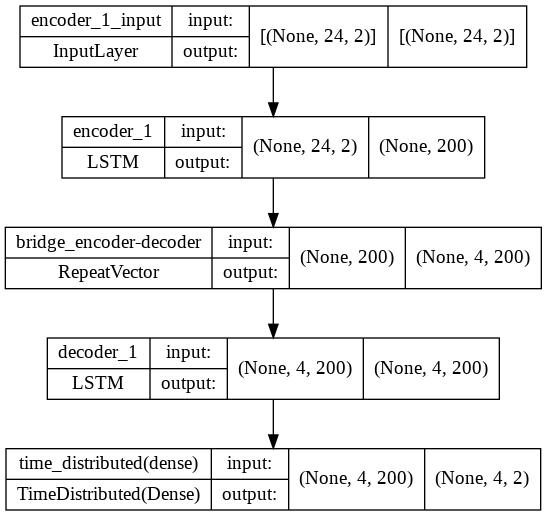

In [ ]:
model_enc_dec = Sequential()
model_enc_dec.add(LSTM(200, activation='relu', input_shape=(LOOK_BACK, n_features), name= "encoder_1"))
model_enc_dec.add(RepeatVector(FORECAST_RANGE, name="bridge_encoder-decoder")) # forecast the next 1 hour, it means after 4 minute units.
model_enc_dec.add(LSTM(200, activation='relu', return_sequences=True, name = "decoder_1"))
model_enc_dec.add(TimeDistributed(Dense(n_features)))
model_enc_dec.compile(optimizer='adam', loss='mse')
plot_model(model=model_enc_dec, show_shapes=True)

Epoch 1/50
407/407 [==============================] - ETA: 0s - loss: 0.0121

407/407 [==============================] - 39s 88ms/step - loss: 0.0121 - val_loss: 0.0028 - lr: 0.0010
Epoch 2/50
407/407 [==============================] - 37s 92ms/step - loss: 0.0027 - val_loss: 0.0029 - lr: 0.0010
Epoch 3/50
407/407 [==============================] - ETA: 0s - loss: 0.0021

407/407 [==============================] - 59s 145ms/step - loss: 0.0021 - val_loss: 0.0019 - lr: 0.0010
Epoch 4/50
407/407 [==============================] - ETA: 0s - loss: 0.0019

407/407 [==============================] - 35s 86ms/step - loss: 0.0019 - val_loss: 0.0018 - lr: 0.0010
Epoch 5/50
407/407 [==============================] - ETA: 0s - loss: 0.0019

407/407 [==============================] - 37s 91ms/step - loss: 0.0019 - val_loss: 0.0017 - lr: 0.0010
Epoch 6/50
407/407 [==============================] - 35s 87ms/step - loss: 0.0017 - val_loss: 0.0018 - lr: 0.0010
Epoch 7/50
407/407 [==============================] - ETA: 0s - loss: 0.0015

407/407 [==============================] - 36s 89ms/step - loss: 0.0015 - val_loss: 0.0012 - lr: 0.0010
Epoch 8/50
407/407 [==============================] - 31s 76ms/step - loss: 0.0013 - val_loss: 0.0012 - lr: 0.0010
Epoch 9/50
407/407 [==============================] - 30s 75ms/step - loss: 0.0012 - val_loss: 0.0012 - lr: 0.0010
Epoch 10/50
407/407 [==============================] - 30s 73ms/step - loss: 0.0012 - val_loss: 0.0016 - lr: 0.0010
Epoch 11/50
407/407 [==============================] - ETA: 0s - loss: 0.0011

407/407 [==============================] - 41s 102ms/step - loss: 0.0011 - val_loss: 0.0011 - lr: 0.0010
Training Execution Time:  411.25283789634705
Last Epoch Training Loss: 0.0011014357442036271
Last Epoch Validation Loss: 0.0010758315911516547

Evaluation Metric Results: 
mae: tf.Tensor(18.745487, shape=(), dtype=float32)
mse: tf.Tensor(733.6338, shape=(), dtype=float32)
rmse: 27.085674978897977
mape: tf.Tensor(5.8734255, shape=(), dtype=float32)


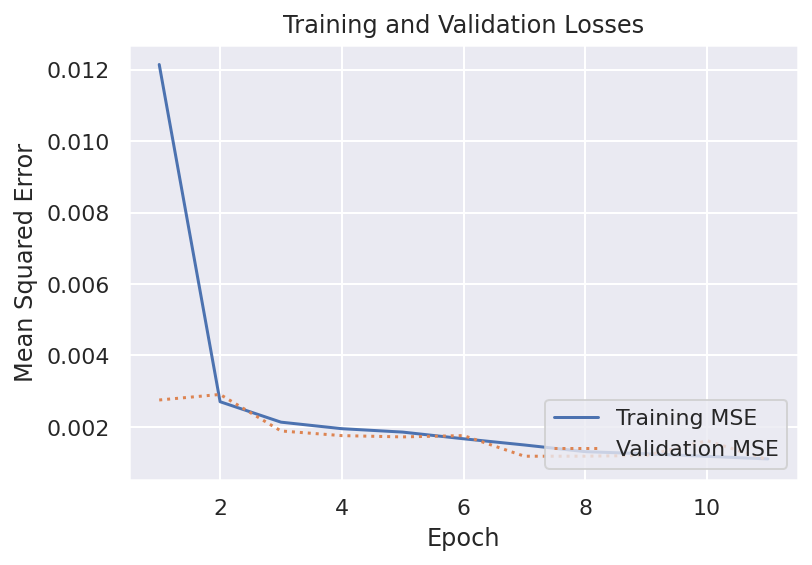

In [ ]:
start_time = time()
epoches = model_enc_dec.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=validation,callbacks=[early_stopping_callback, checkpoint_callback, rlrop_callback])
end_time = time()

plt.rcParams["figure.figsize"] = (6,4)
sns.set() 
train = epoches.history['loss']
val = epoches.history['val_loss']
epochs = range(1, len(train) + 1)
 
plt.plot(epochs, train, '-', label='Training MSE')
plt.plot(epochs, val, ':', label='Validation MSE')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc='lower right')
plt.plot()

print("Training Execution Time: ", end_time - start_time)
print("Last Epoch Training Loss: {}".format(train[-1]))
print("Last Epoch Validation Loss: {}".format(val[-1]))
print("")
print("Evaluation Metric Results: ")
yhat = model_enc_dec.predict(X_test, verbose=0)
yhat_inverse, y_test_inverse = inverse_transform(y_test, yhat)
evaluate_forecast(y_test_inverse, yhat_inverse)

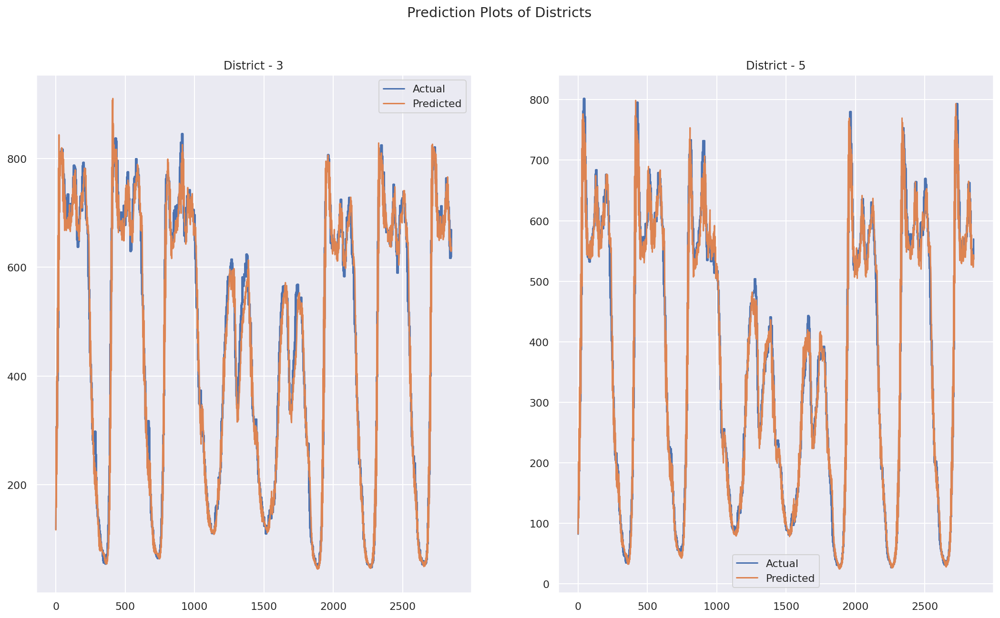

In [ ]:
dist_3_preds = []
dist_5_preds = []

dist_3_actual = []
dist_5_actual = []

for i in range(0,len(yhat)):

  dist_3_preds.append(yhat_inverse[i][0])
  dist_5_preds.append(yhat_inverse[i][1])

  dist_3_actual.append(y_test_inverse[i][0])
  dist_5_actual.append(y_test_inverse[i][1])

#plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
fig.suptitle('Prediction Plots of Districts')
ax1.set_title("District - 3")
ax2.set_title("District - 5")
ax1.plot(dist_3_actual, label='Actual')
ax1.plot(dist_3_preds, label='Predicted')
ax1.legend()
ax2.plot(dist_5_actual, label='Actual')
ax2.plot(dist_5_preds, label='Predicted')
ax2.legend()

### **2. CNN-LSTM Encoder-Decoder Model**

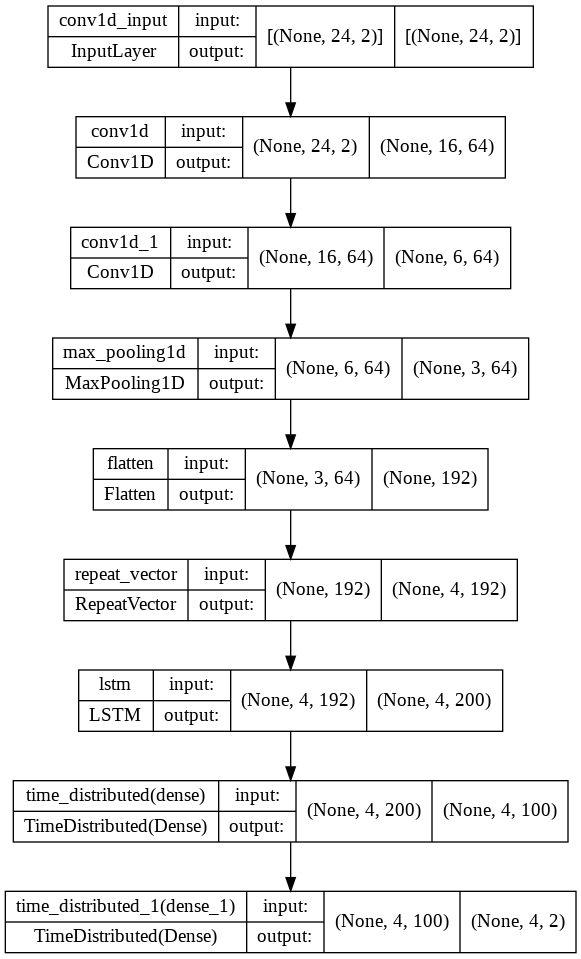

In [ ]:
model_enc_dec_cnn = Sequential()
model_enc_dec_cnn.add(Conv1D(filters=64, kernel_size=9, activation='relu', input_shape=(LOOK_BACK, n_features)))
model_enc_dec_cnn.add(Conv1D(filters=64, kernel_size=11, activation='relu'))
model_enc_dec_cnn.add(MaxPooling1D(pool_size=2))
model_enc_dec_cnn.add(Flatten())
model_enc_dec_cnn.add(RepeatVector(FORECAST_RANGE))
model_enc_dec_cnn.add(LSTM(200, activation='relu', return_sequences=True))
model_enc_dec_cnn.add(TimeDistributed(Dense(100, activation='relu')))
model_enc_dec_cnn.add(TimeDistributed(Dense(n_features)))
model_enc_dec_cnn.compile(loss='mse', optimizer='adam')
plot_model(model_enc_dec_cnn, show_shapes=True, show_layer_names=True)

Epoch 1/50
405/407 [============================>.] - ETA: 0s - loss: 0.0107

407/407 [==============================] - 16s 33ms/step - loss: 0.0107 - val_loss: 0.0029 - lr: 0.0010
Epoch 2/50
406/407 [============================>.] - ETA: 0s - loss: 0.0025

407/407 [==============================] - 14s 34ms/step - loss: 0.0025 - val_loss: 0.0020 - lr: 0.0010
Epoch 3/50
407/407 [==============================] - ETA: 0s - loss: 0.0018

407/407 [==============================] - 12s 31ms/step - loss: 0.0018 - val_loss: 0.0016 - lr: 0.0010
Epoch 4/50
405/407 [============================>.] - ETA: 0s - loss: 0.0017

407/407 [==============================] - 14s 34ms/step - loss: 0.0017 - val_loss: 0.0015 - lr: 0.0010
Epoch 5/50
406/407 [============================>.] - ETA: 0s - loss: 0.0014

407/407 [==============================] - 15s 36ms/step - loss: 0.0014 - val_loss: 0.0012 - lr: 0.0010
Epoch 6/50
407/407 [==============================] - 10s 25ms/step - loss: 0.0014 - val_loss: 0.0013 - lr: 0.0010
Epoch 7/50
407/407 [==============================] - 14s 35ms/step - loss: 0.0012 - val_loss: 0.0016 - lr: 0.0010
Epoch 8/50
406/407 [============================>.] - ETA: 0s - loss: 0.0012

407/407 [==============================] - 14s 35ms/step - loss: 0.0012 - val_loss: 0.0010 - lr: 0.0010
Epoch 9/50
407/407 [==============================] - 13s 31ms/step - loss: 0.0011 - val_loss: 0.0011 - lr: 0.0010
Epoch 10/50
407/407 [==============================] - ETA: 0s - loss: 0.0011

407/407 [==============================] - 14s 34ms/step - loss: 0.0011 - val_loss: 0.0010 - lr: 0.0010
Epoch 11/50
407/407 [==============================] - 11s 28ms/step - loss: 0.0011 - val_loss: 0.0011 - lr: 0.0010
Training Execution Time:  147.27052688598633
Last Epoch Training Loss: 0.00107730517629534
Last Epoch Validation Loss: 0.001126448973082006

Evaluation Metric Results: 
mae: tf.Tensor(20.466322, shape=(), dtype=float32)
mse: tf.Tensor(885.0899, shape=(), dtype=float32)
rmse: 29.750460581059183
mape: tf.Tensor(6.291275, shape=(), dtype=float32)


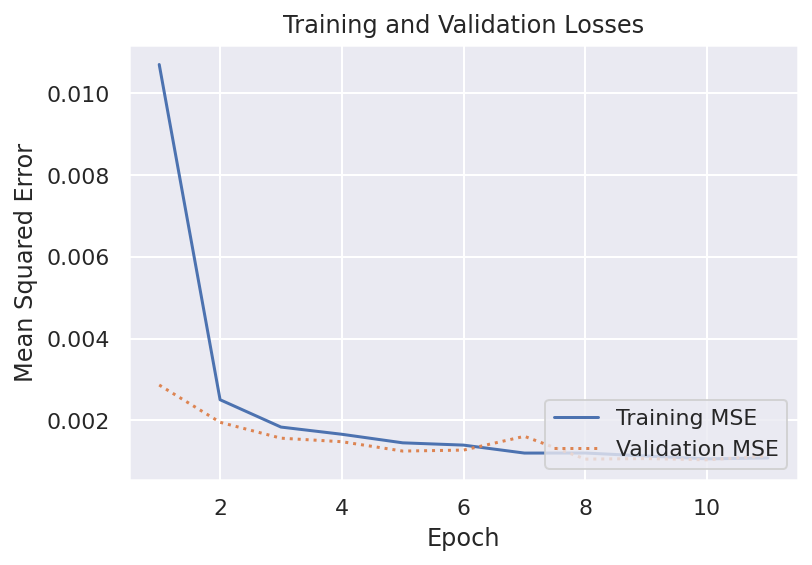

In [ ]:
start_time = time()
epoches_cnn = model_enc_dec_cnn.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=validation,callbacks=[early_stopping_callback, checkpoint_callback, rlrop_callback])
end_time = time()

print("Training Execution Time: ", end_time - start_time)

plt.rcParams["figure.figsize"] = (6,4)
sns.set() 
train = epoches_cnn.history['loss']
val = epoches_cnn.history['val_loss']
epochs = range(1, len(train) + 1)
 
plt.plot(epochs, train, '-', label='Training MSE')
plt.plot(epochs, val, ':', label='Validation MSE')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc='lower right')
plt.plot()


print("Last Epoch Training Loss: {}".format(train[-1]))
print("Last Epoch Validation Loss: {}".format(val[-1]))
print("")
print("Evaluation Metric Results: ")
yhat = model_enc_dec_cnn.predict(X_test, verbose=0)
yhat_inverse, y_test_inverse = inverse_transform(y_test, yhat)

evaluate_forecast(y_test_inverse, yhat_inverse)

In [ ]:
yhat_inverse[1]

array([152.12679, 105.32057], dtype=float32)

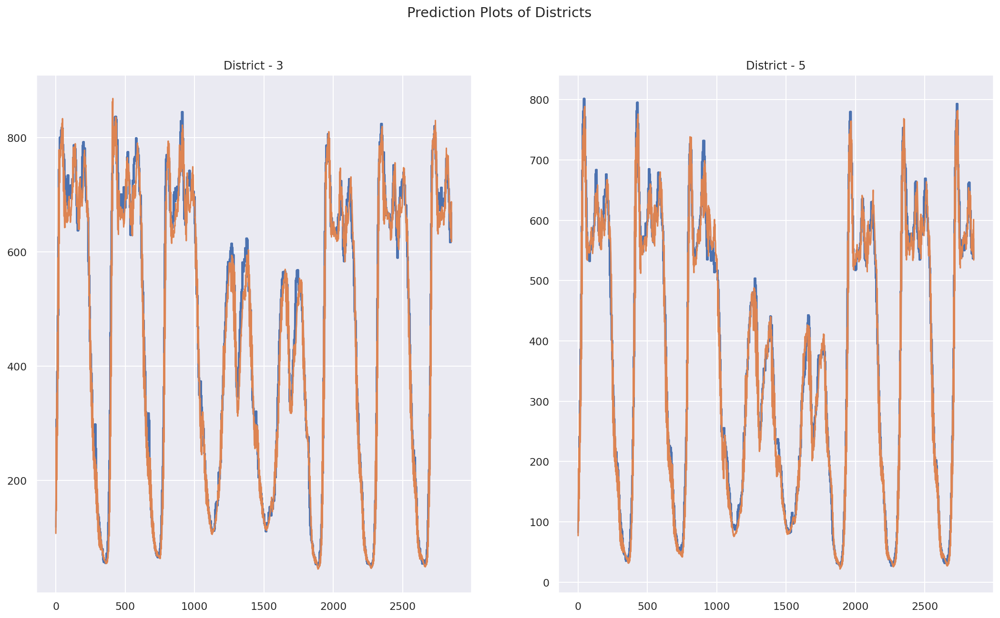

In [ ]:
dist_3_preds = []
dist_5_preds = []

dist_3_actual = []
dist_5_actual = []

for i in range(0,len(yhat)):

  dist_3_preds.append(yhat_inverse[i][0])
  dist_5_preds.append(yhat_inverse[i][1])

  dist_3_actual.append(y_test_inverse[i][0])
  dist_5_actual.append(y_test_inverse[i][1])

#plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
fig.suptitle('Prediction Plots of Districts')
ax1.set_title("District - 3")
ax2.set_title("District - 5")
ax1.plot(dist_3_actual)
ax1.plot(dist_3_preds)
ax2.plot(dist_5_actual)
ax2.plot(dist_5_preds)

**3. Multi-head CNN-LSTM Model**

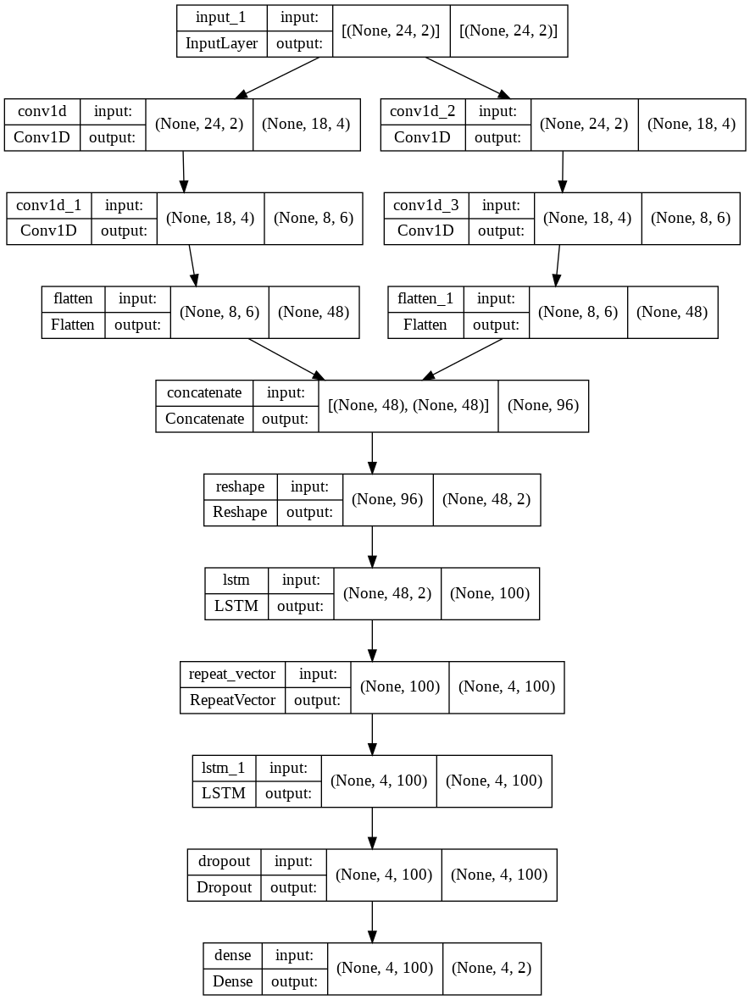

In [ ]:
input_layer = Input(shape=(LOOK_BACK, n_features)) 
head_list = []
for i in range(0, n_features):
 conv_layer_head = Conv1D(filters=4, kernel_size=7, activation='relu')(input_layer)
 conv_layer_head_2 = Conv1D(filters=6, kernel_size=11, activation='relu')(conv_layer_head)
 conv_layer_flatten = Flatten()(conv_layer_head_2)
 head_list.append(conv_layer_flatten)
 
concat_cnn = Concatenate(axis=1)(head_list)
reshape = Reshape((head_list[0].shape[1], n_features))(concat_cnn)
lstm = LSTM(100, activation='relu')(reshape)
repeat = RepeatVector(FORECAST_RANGE)(lstm)
lstm_2 = LSTM(100, activation='relu', return_sequences=True)(repeat)
dropout = Dropout(0.2)(lstm_2)
dense = Dense(n_features, activation='linear')(dropout)
multi_head_cnn_lstm_model = Model(inputs=input_layer, outputs=dense)
multi_head_cnn_lstm_model.compile(loss='mse', optimizer='adam')
plot_model(multi_head_cnn_lstm_model, show_shapes=True, show_layer_names=True)

Epoch 1/50
407/407 [==============================] - ETA: 0s - loss: 0.0293

407/407 [==============================] - 35s 74ms/step - loss: 0.0293 - val_loss: 0.0045 - lr: 0.0010
Epoch 2/50
407/407 [==============================] - ETA: 0s - loss: 0.0056

407/407 [==============================] - 30s 73ms/step - loss: 0.0056 - val_loss: 0.0040 - lr: 0.0010
Epoch 3/50
407/407 [==============================] - ETA: 0s - loss: 0.0045

407/407 [==============================] - 30s 74ms/step - loss: 0.0045 - val_loss: 0.0039 - lr: 0.0010
Epoch 4/50
407/407 [==============================] - ETA: 0s - loss: 0.0038

407/407 [==============================] - 29s 72ms/step - loss: 0.0038 - val_loss: 0.0022 - lr: 0.0010
Epoch 5/50
407/407 [==============================] - 23s 56ms/step - loss: 0.0035 - val_loss: 0.0023 - lr: 0.0010
Epoch 6/50
407/407 [==============================] - ETA: 0s - loss: 0.0032

407/407 [==============================] - 28s 69ms/step - loss: 0.0032 - val_loss: 0.0021 - lr: 0.0010
Epoch 7/50
407/407 [==============================] - 25s 60ms/step - loss: 0.0029 - val_loss: 0.0024 - lr: 0.0010
Epoch 8/50
407/407 [==============================] - ETA: 0s - loss: 0.0029

407/407 [==============================] - 31s 76ms/step - loss: 0.0029 - val_loss: 0.0019 - lr: 0.0010
Epoch 9/50
407/407 [==============================] - 23s 56ms/step - loss: 0.0027 - val_loss: 0.0020 - lr: 0.0010
Epoch 10/50
407/407 [==============================] - ETA: 0s - loss: 0.0027

407/407 [==============================] - 28s 70ms/step - loss: 0.0027 - val_loss: 0.0019 - lr: 0.0010
Epoch 11/50
407/407 [==============================] - 25s 61ms/step - loss: 0.0026 - val_loss: 0.0021 - lr: 0.0010
Training Execution Time:  306.4598500728607
Last Epoch Training Loss: 0.0025622558314353228
Last Epoch Validation Loss: 0.0021077212877571583

Evaluation Metric Results: 
mae: tf.Tensor(28.597616, shape=(), dtype=float32)
mse: tf.Tensor(1599.451, shape=(), dtype=float32)
rmse: 39.99313753389058
mape: tf.Tensor(9.323206, shape=(), dtype=float32)


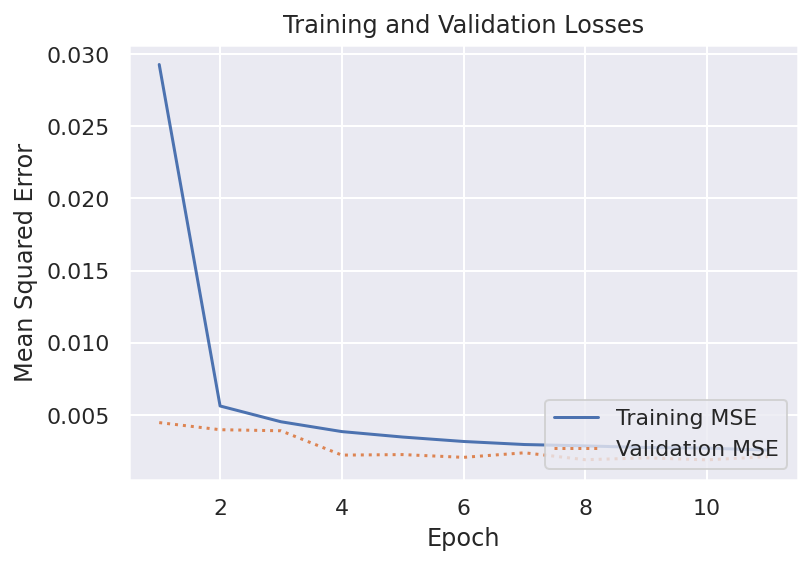

In [ ]:
start_time = time()
epoches = multi_head_cnn_lstm_model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_split=validation,callbacks=[early_stopping_callback, checkpoint_callback, rlrop_callback])
end_time = time()

print("Training Execution Time: ", end_time - start_time)

plt.rcParams["figure.figsize"] = (6,4)
sns.set() 
train = epoches.history['loss']
val = epoches.history['val_loss']
epochs = range(1, len(train) + 1)
 
plt.plot(epochs, train, '-', label='Training MSE')
plt.plot(epochs, val, ':', label='Validation MSE')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc='lower right')
plt.plot()


print("Last Epoch Training Loss: {}".format(train[-1]))
print("Last Epoch Validation Loss: {}".format(val[-1]))
print("")
print("Evaluation Metric Results: ")
yhat = multi_head_cnn_lstm_model.predict(X_test, verbose=0)
yhat_inverse, y_test_inverse = inverse_transform(y_test, yhat)
evaluate_forecast(y_test_inverse, yhat_inverse)

# Producing traffic intensity map images and saving them to a folder

## Intensity visuals at time t

In [ ]:
# kalan = fill_na_df_trafficMAD_ts_urb[fill_na_df_trafficMAD_ts_urb['timestamp']>"2022-02-08 09:15:00"]
# kalan['timestamp'].unique()

array(['2022-02-08T09:30:00.000000000', '2022-02-08T09:45:00.000000000',
       '2022-02-08T10:00:00.000000000', ...,
       '2022-06-30T23:15:00.000000000', '2022-06-30T23:30:00.000000000',
       '2022-06-30T23:45:00.000000000'], dtype='datetime64[ns]')

In [ ]:
date_names = modified_trafficMAD_urb_2022['timestamp'].unique()
print(len(date_names))
date_names = date_names[:40]
date_names

17376


array(['2022-01-01 00:00:00', '2022-01-01 00:15:00',
       '2022-01-01 00:30:00', '2022-01-01 00:45:00',
       '2022-01-01 01:00:00', '2022-01-01 01:15:00',
       '2022-01-01 01:30:00', '2022-01-01 01:45:00',
       '2022-01-01 02:00:00', '2022-01-01 02:15:00',
       '2022-01-01 02:30:00', '2022-01-01 02:45:00',
       '2022-01-01 03:00:00', '2022-01-01 03:15:00',
       '2022-01-01 03:30:00', '2022-01-01 03:45:00',
       '2022-01-01 04:00:00', '2022-01-01 04:15:00',
       '2022-01-01 04:30:00', '2022-01-01 04:45:00',
       '2022-01-01 05:00:00', '2022-01-01 05:15:00',
       '2022-01-01 05:30:00', '2022-01-01 05:45:00',
       '2022-01-01 06:00:00', '2022-01-01 06:15:00',
       '2022-01-01 06:30:00', '2022-01-01 06:45:00',
       '2022-01-01 07:00:00', '2022-01-01 07:15:00',
       '2022-01-01 07:30:00', '2022-01-01 07:45:00',
       '2022-01-01 08:00:00', '2022-01-01 08:15:00',
       '2022-01-01 08:30:00', '2022-01-01 08:45:00',
       '2022-01-01 09:00:00', '2022-01-01 09:1

In [ ]:
px.set_mapbox_access_token("pk.eyJ1Ijoic2hha2Fzb20iLCJhIjoiY2plMWg1NGFpMXZ5NjJxbjhlM2ttN3AwbiJ9.RtGYHmreKiyBfHuElgYq_w")

fig = px.scatter_mapbox(modified_trafficMAD_urb_2022[modified_trafficMAD_urb_2022['timestamp']=='2022-01-04 09:30:00'], 
                            lat='latitude', lon='longitude', center=dict(lat=40.42, lon=-3.68), zoom=9.7,hover_name="loc_district", hover_data=["loc_district", "Avg_Intensity"], 
                            color="Avg_Intensity",size="Avg_Intensity", color_continuous_scale=px.colors.sequential.matter, size_max=22,
                            width = 400, height=400)
fig.update_layout(coloraxis_showscale=False)
fig.show()

In [ ]:
px.set_mapbox_access_token("pk.eyJ1Ijoic2hha2Fzb20iLCJhIjoiY2plMWg1NGFpMXZ5NjJxbjhlM2ttN3AwbiJ9.RtGYHmreKiyBfHuElgYq_w")

for i, date in zip(range(len(date_names)),date_names):
  fig = px.scatter_mapbox(modified_trafficMAD_urb_2022[modified_trafficMAD_urb_2022['timestamp']==date], 
                            lat='latitude', lon='longitude', center=dict(lat=40.42, lon=-3.68), zoom=9.7,hover_name="loc_district", hover_data=["loc_district", "Avg_Intensity"], 
                            color="Avg_Intensity",size="Avg_Intensity", color_continuous_scale=px.colors.sequential.matter, size_max=22,
                            width = 400, height=400)
# fig.update_layout(coloraxis_showscale=False)
# fig.show()
  # saving the images to drive without color legend:
  fig.update_layout(coloraxis_showscale=False).write_image("/content/drive/MyDrive/THESIS/Producing_15_mins/deneme/{}.png".format(date))
  print(f'{i+1}- Image for date-{date} is saved successfully.')

1- Image for date-2022-01-01 00:00:00 is saved successfully.
2- Image for date-2022-01-01 00:15:00 is saved successfully.
3- Image for date-2022-01-01 00:30:00 is saved successfully.
4- Image for date-2022-01-01 00:45:00 is saved successfully.
5- Image for date-2022-01-01 01:00:00 is saved successfully.
6- Image for date-2022-01-01 01:15:00 is saved successfully.
7- Image for date-2022-01-01 01:30:00 is saved successfully.
8- Image for date-2022-01-01 01:45:00 is saved successfully.
9- Image for date-2022-01-01 02:00:00 is saved successfully.
10- Image for date-2022-01-01 02:15:00 is saved successfully.
11- Image for date-2022-01-01 02:30:00 is saved successfully.
12- Image for date-2022-01-01 02:45:00 is saved successfully.
13- Image for date-2022-01-01 03:00:00 is saved successfully.
14- Image for date-2022-01-01 03:15:00 is saved successfully.
15- Image for date-2022-01-01 03:30:00 is saved successfully.
16- Image for date-2022-01-01 03:45:00 is saved successfully.
17- Image for dat

In [ ]:
from sklearn.preprocessing import MinMaxScaler
dataset = df_trafficMAD_ts_urb_11.Avg_Intensity.values #numpy.ndarray
dataset = dataset.astype('float32')
dataset = np.reshape(dataset, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
train_size = int(len(dataset) * 0.80)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)
    
look_back = 30
X_train, Y_train = create_dataset(train, look_back)
X_test, Y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

In [ ]:
Y_train

array([0.153822  , 0.1309784 , 0.13595507, ..., 0.896024  , 0.89848036,
       0.8894373 ], dtype=float32)

# Implementing Paralel Input and Multi-step Time Series Forecasting with Images

First, load the some months produced images:

In [ ]:
data_dir = pathlib.Path('/content/drive/MyDrive/THESIS/Producing_15_mins/images')  # images (this is from 5 months 10am data)
path_of_images = list(data_dir.glob('*.png'))
print('The number of images: ', len(path_of_images))
path_of_images.sort()
# path_of_images[:10]
# for i in range(len(path_of_images)):
#   print(path_of_images[i].name)

# path_of_images[5664].name #2022-03-01T00:00:00.000000000.png
train_paths = path_of_images[:5664]
test_paths = path_of_images[5664:8640]
print("The 80 percent of the images for training: ", len(train_paths))
print("The 20 percent of the images for testing: ", len(test_paths))
test_paths[-1]

The number of images:  11168
The 80 percent of the images for training:  5664
The 20 percent of the images for testing:  2976


PosixPath('/content/drive/MyDrive/THESIS/Producing_15_mins/images/2022-03-31T23:45:00.000000000.png')

In [ ]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

t_images = []
for img in train_paths:
  # print(img)
  img = load_img(str(img), target_size=(33, 33))
  img = img_to_array(img)
  img = np.expand_dims(img, axis=0)
  t_images.append(img)
train_images = np.vstack(t_images)

te_images = []
for img in test_paths:
  # print(img)
  img = load_img(str(img), target_size=(33, 33))
  img = img_to_array(img)
  img = np.expand_dims(img, axis=0)
  te_images.append(img)
test_images = np.vstack(te_images)

In [ ]:
train_images.shape, test_images.shape

((5664, 33, 33, 3), (2976, 33, 33, 3))

In [ ]:
for i in range(0,5664):
  for j in range(0,33):
    train_images[i][j] = train_images[i][j]/255
print('Pixel values interval of the train images: ', np.min(train_images), np.max(train_images))

for i in range(0,2976):
  for j in range(0,33):
    test_images[i][j] = test_images[i][j]/255
print('Pixel values interval of the train images: ', np.min(test_images), np.max(test_images))

Pixel values interval of the train images:  0.03529412 1.0
Pixel values interval of the train images:  0.03529412 1.0


In [ ]:
from datetime import datetime
train_test_split = datetime.strptime('2022-03-01 00:00:00', '%Y-%m-%d %H:%M:%S')
end = datetime.strptime('2022-03-31 23:45:00', '%Y-%m-%d %H:%M:%S')
# districts_pivot_3_5 = districts_pivot_3_5.iloc[:, :2]
df_train = districts_pivot_3_5.loc[districts_pivot_3_5['timestamp'] < train_test_split]
df_test = districts_pivot_3_5.loc[(districts_pivot_3_5['timestamp'] >= train_test_split) & (districts_pivot_3_5['timestamp'] <= end)]
# and then normalize the data between 0 and 1 before training

from sklearn.preprocessing import MinMaxScaler
dist_list = [i for i in districts_pivot_3_5.columns if i != 'timestamp']
scaler = MinMaxScaler()
scaled_train = scaler.fit_transform(df_train[dist_list])
scaled_test = scaler.transform(df_test[dist_list])
scaled_train.shape, scaled_test.shape

((5664, 2), (2976, 2))

In [ ]:
def split_sequence(sequence, look_back, forecast_horizon):
 X, y = list(), list()
 for i in range(len(sequence)): 
   lag_end = i + look_back
   forecast_end = lag_end + forecast_horizon
   if forecast_end > len(sequence):
     break
   seq_x, seq_y = sequence[i:lag_end], sequence[lag_end:forecast_end]
   X.append(seq_x)
   y.append(seq_y)

 return np.array(X), np.array(y)


# Take into consideration last 6 hours, and perform forecasting for next 1 hour
LOOK_BACK = 4*6
FORECAST_RANGE = 4
n_features = len(dist_list)
X_train,_  = split_sequence(train_images, look_back=LOOK_BACK, forecast_horizon=FORECAST_RANGE)
X_test,_ = split_sequence(test_images, look_back=LOOK_BACK, forecast_horizon=FORECAST_RANGE)
print(X_train.shape)
print(X_test.shape)

_, y_train  = split_sequence(scaled_train, look_back=LOOK_BACK, forecast_horizon=FORECAST_RANGE)
_, y_test = split_sequence(scaled_test, look_back=LOOK_BACK, forecast_horizon=FORECAST_RANGE)

print(y_train.shape)
print(y_test.shape)

(5637, 24, 33, 33, 3)
(2949, 24, 33, 33, 3)
(5637, 4, 2)
(2949, 4, 2)


In [ ]:
# Base Model Results:
import warnings
warnings.filterwarnings("ignore")

# Baseline model before the main model:
dist_3_5 = modified_trafficMAD_urb_2022[modified_trafficMAD_urb_2022['loc_district'].isin([3,5])]
dist_3_5['timestamp'] = pd.to_datetime(dist_3_5['timestamp'])
dist_3_5['hour'] = dist_3_5['timestamp'].apply(lambda x: x.hour)
dist_3_5['minute'] = dist_3_5['timestamp'].apply(lambda x: x.minute)

train_test_split = datetime.strptime('2022-03-01 00:00:00', '%Y-%m-%d %H:%M:%S')
end = datetime.strptime('2022-03-31 23:45:00', '%Y-%m-%d %H:%M:%S')

df_train_pers = dist_3_5.loc[dist_3_5['timestamp'] < train_test_split]
df_test_pers = dist_3_5.loc[(dist_3_5['timestamp'] >= train_test_split) & (dist_3_5['timestamp'] <= end)]

df_cpu_mean = df_train_pers.groupby(['loc_district', 'hour', 'minute']).mean('Avg_Intensity').round(2) ## her saat içindeki dakika bazında ortalama yoğunluk bilgisi her günün o saat 
                                                                                                       ## ve dakikasındaki veri yerine yazılıyor.
df_cpu_mean.reset_index(inplace=True)
df_cpu_mean = df_cpu_mean.rename(columns={"Avg_Intensity": "Avg_Intensity_Pred"})

df_test_pers = df_test_pers.merge(df_cpu_mean, on=['loc_district', 'hour', 'minute'], how="inner")

evaluate_forecast(df_test_pers['Avg_Intensity'], df_test_pers['Avg_Intensity_Pred'])

mae: tf.Tensor(84.93214416503906, shape=(), dtype=float64)
mse: tf.Tensor(12651.0302734375, shape=(), dtype=float64)
rmse: 112.47679882285725
mape: tf.Tensor(28.58623504638672, shape=(), dtype=float64)


In [ ]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Lambda, LSTM, Dense, Dropout, Rescaling, TimeDistributed, Conv1D, Conv2D, Conv3D,MaxPooling1D, MaxPooling2D, MaxPooling3D, Flatten, Bidirectional, Input, Flatten, Activation, Reshape, RepeatVector, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

epochs = 50
batch_size = 32
validation = 0.1

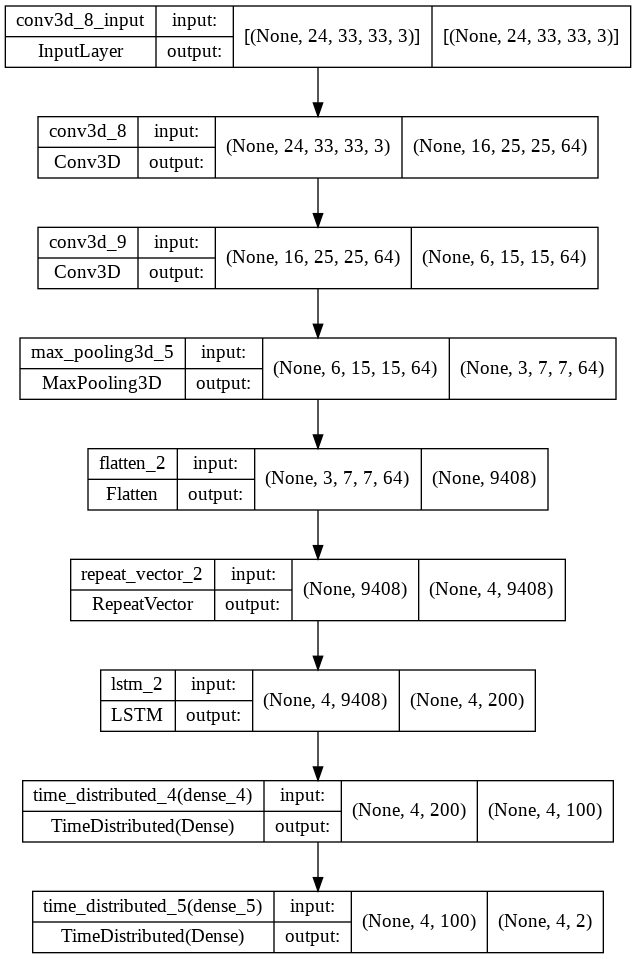

In [ ]:
def ReshapeLayer5D_4D(x):
    shape = x.shape #defining the shape of x
    # H,W*channel
    reshaped = tf.keras.layers.Reshape((shape[1],shape[2]*shape[3],shape[4]))(x)
    return reshaped

# def ReshapeLayer4D_3D(x):
#     shape = x.shape #defining the shape of x
#     # H,W*channel
#     reshape = Reshape((shape[1],shape[2]*shape[3]))(x)
#     return reshape


model_enc_dec_cnn = Sequential()
model_enc_dec_cnn.add(Conv2D(filters=64, kernel_size=9, activation='relu', input_shape=(24, 33,33,3)))
model_enc_dec_cnn.add(MaxPooling3D(pool_size=(2,2,2)))
model_enc_dec_cnn.add(Conv2D(filters=64, kernel_size=11, activation='relu'))
# model_enc_dec_cnn.add(Lambda(ReshapeLayer5D_4D)) # passing from 4D to 3D
model_enc_dec_cnn.add(MaxPooling3D(pool_size=(2,2,2)))
model_enc_dec_cnn.add(Flatten())
model_enc_dec_cnn.add(RepeatVector(FORECAST_RANGE))
# model_enc_dec_cnn.add(Lambda(ReshapeLayer4D_3D)) # passing from 4D to 3D
model_enc_dec_cnn.add(LSTM(200, activation='relu', return_sequences=True))
model_enc_dec_cnn.add(TimeDistributed(Dense(100, activation='relu')))
model_enc_dec_cnn.add(TimeDistributed(Dense(n_features)))
model_enc_dec_cnn.compile(loss='mse', optimizer='adam')

# model_enc_dec_cnn.build((None,24,33,33,3))
plot_model(model_enc_dec_cnn, show_shapes=True, show_layer_names=True)

Epoch 1/50
159/159 [==============================] - ETA: 0s - loss: 0.0799

159/159 [==============================] - 752s 5s/step - loss: 0.0799 - val_loss: 0.0684 - lr: 0.0010
Epoch 2/50
159/159 [==============================] - ETA: 0s - loss: 0.0445

159/159 [==============================] - 769s 5s/step - loss: 0.0445 - val_loss: 0.0260 - lr: 0.0010
Epoch 3/50
159/159 [==============================] - ETA: 0s - loss: 0.0139

159/159 [==============================] - 759s 5s/step - loss: 0.0139 - val_loss: 0.0093 - lr: 0.0010
Epoch 4/50
159/159 [==============================] - ETA: 0s - loss: 0.0096

159/159 [==============================] - 770s 5s/step - loss: 0.0096 - val_loss: 0.0084 - lr: 0.0010
Epoch 5/50
159/159 [==============================] - 758s 5s/step - loss: 0.0082 - val_loss: 0.0151 - lr: 0.0010
Epoch 6/50
159/159 [==============================] - ETA: 0s - loss: 0.0073

159/159 [==============================] - 775s 5s/step - loss: 0.0073 - val_loss: 0.0075 - lr: 0.0010
Epoch 7/50
159/159 [==============================] - 773s 5s/step - loss: 0.0056 - val_loss: 0.0079 - lr: 0.0010
Epoch 8/50
159/159 [==============================] - ETA: 0s - loss: 0.0053

159/159 [==============================] - 769s 5s/step - loss: 0.0053 - val_loss: 0.0065 - lr: 0.0010
Epoch 9/50
159/159 [==============================] - ETA: 0s - loss: 0.0043

159/159 [==============================] - 767s 5s/step - loss: 0.0043 - val_loss: 0.0059 - lr: 0.0010
Epoch 10/50
159/159 [==============================] - ETA: 0s - loss: 0.0039

159/159 [==============================] - 766s 5s/step - loss: 0.0039 - val_loss: 0.0058 - lr: 0.0010
Epoch 11/50
159/159 [==============================] - ETA: 0s - loss: 0.0035

159/159 [==============================] - 768s 5s/step - loss: 0.0035 - val_loss: 0.0051 - lr: 0.0010
Epoch 12/50
159/159 [==============================] - ETA: 0s - loss: 0.0032

159/159 [==============================] - 764s 5s/step - loss: 0.0032 - val_loss: 0.0051 - lr: 0.0010
Epoch 13/50
159/159 [==============================] - ETA: 0s - loss: 0.0030

159/159 [==============================] - 768s 5s/step - loss: 0.0030 - val_loss: 0.0047 - lr: 0.0010
Time consumed while training the model:  9956.706872701645
Loss evaluation by Epoch
Last Epoch Training Loss: 0.0029698091093450785
Last Epoch Validation Loss: 0.004661062266677618


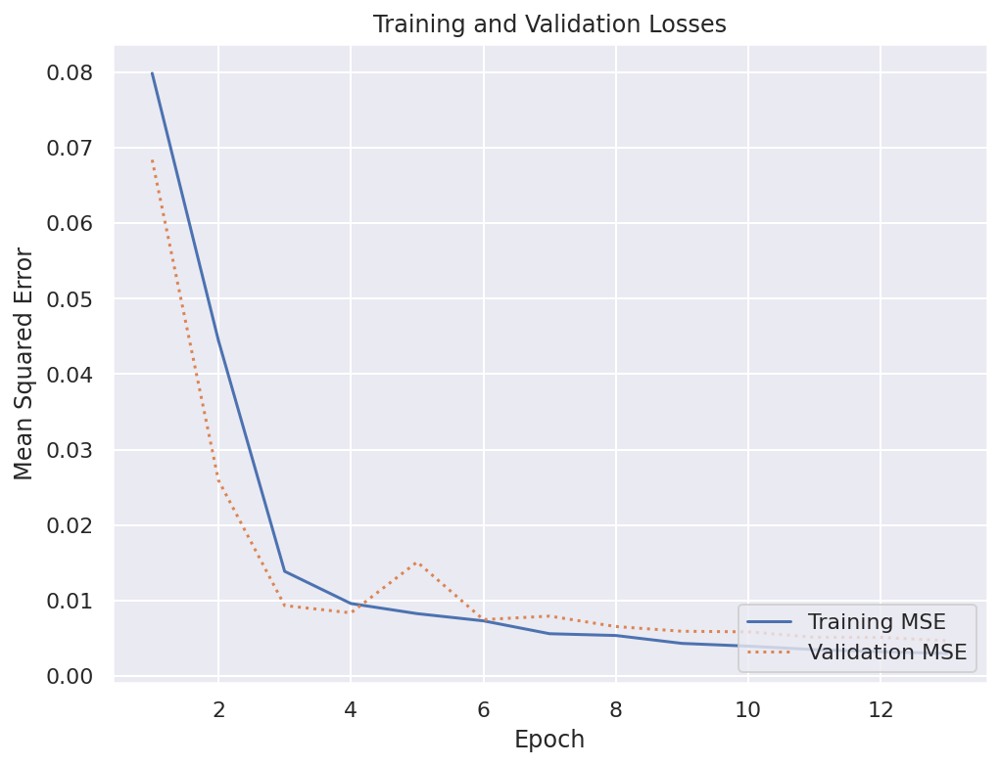

In [ ]:
start = time()

epoches = model_enc_dec_cnn.fit(X_train, y_train,
                    validation_split=validation,
                    callbacks=[early_stopping_callback, checkpoint_callback, rlrop_callback],
                    epochs=epochs, 
                    batch_size=batch_size)

end = time()

time_cnn = end- start
print('Time consumed while training the model: ', time_cnn)

print('Loss evaluation by Epoch')
sns.set() 
train = epoches.history['loss']
val = epoches.history['val_loss']
epochs = range(1, len(train) + 1)
 
plt.plot(epochs, train, '-', label='Training MSE')
plt.plot(epochs, val, ':', label='Validation MSE')
plt.title('Training and Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.legend(loc='lower right')
plt.plot()

print("Last Epoch Training Loss: {}".format(train[-1]))
print("Last Epoch Validation Loss: {}".format(val[-1]))

In [ ]:
print("Evaluation Metric Results: ")
yhat = model_enc_dec_cnn.predict(X_test, verbose=0)
yhat_inverse, y_test_inverse = inverse_transform(y_test, yhat)

evaluate_forecast(y_test_inverse, yhat_inverse)

Evaluation Metric Results: 
mae: tf.Tensor(41.126686, shape=(), dtype=float32)
mse: tf.Tensor(2930.3638, shape=(), dtype=float32)
rmse: 54.132834486393286
mape: tf.Tensor(15.946218, shape=(), dtype=float32)


mae: tf.Tensor(51.700443, shape=(), dtype=float32)
mse: tf.Tensor(4546.898, shape=(), dtype=float32)
rmse: 67.43068996546565
mape: tf.Tensor(14.354837, shape=(), dtype=float32)
mae: tf.Tensor(41.375404, shape=(), dtype=float32)
mse: tf.Tensor(2911.7861, shape=(), dtype=float32)
rmse: 53.960968605210375
mape: tf.Tensor(20.88689, shape=(), dtype=float32)
None
None


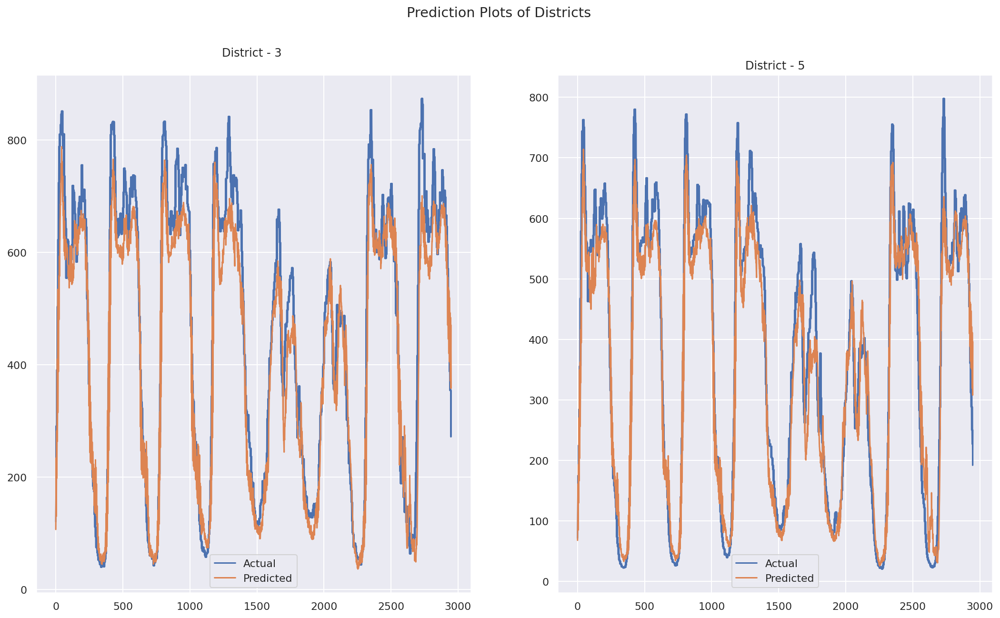

In [ ]:
dist_3_preds = []
dist_5_preds = []

dist_3_actual = []
dist_5_actual = []

for i in range(0,len(yhat)):

  dist_3_preds.append(yhat_inverse[i][0])
  dist_5_preds.append(yhat_inverse[i][1])

  dist_3_actual.append(y_test_inverse[i][0])
  dist_5_actual.append(y_test_inverse[i][1])

eval_metrics_3 = evaluate_forecast(dist_3_actual, dist_3_preds)
eval_metrics_5 = evaluate_forecast(dist_5_actual, dist_5_preds)

print(eval_metrics_3)
print(eval_metrics_5)
#plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))
fig.suptitle('Prediction Plots of Districts')
ax1.set_title("District - 3 \n")
ax2.set_title("District - 5")
ax1.plot(dist_3_actual, label='Actual')
ax1.plot(dist_3_preds, label='Predicted')
ax1.legend()
ax2.plot(dist_5_actual, label='Actual')
ax2.plot(dist_5_preds, label='Predicted')
ax2.legend()